# EDA_CaseStudy_DSC34_KallolaPradhan

In [1]:
#import modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Filtering out the warnings
import warnings
warnings.filterwarnings('ignore')

## 1.0 Read Case study files & data checks

In [3]:
#Read previous application data
df_prev= pd.read_csv('C:/Users/kpradhan/OneDrive - Amadeus Workplace/Desktop/EDA_Case_Study/previous_application.csv')

In [4]:
#Read current application data
df_app= pd.read_csv('C:/Users/kpradhan/OneDrive - Amadeus Workplace/Desktop/EDA_Case_Study/application_data.csv')

In [5]:
df_app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
df_app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [7]:
df_app.shape

(307511, 122)

In [8]:
df_app.columns[df_app.isna().any()]

Index(['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'OWN_CAR_AGE',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG',
       'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE',
       'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE',
       'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMI

In [9]:
df_app.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


## Data Cleaning : Selecting columns for analysis
### 2.1 Check %age of null values in different columns

In [10]:
#find columns with null above 30%
(df_app.isnull().sum()/len(df_app)*100).sort_values(ascending = False)

COMMONAREA_MEDI             69.872297
COMMONAREA_AVG              69.872297
COMMONAREA_MODE             69.872297
NONLIVINGAPARTMENTS_MODE    69.432963
NONLIVINGAPARTMENTS_AVG     69.432963
                              ...    
NAME_HOUSING_TYPE            0.000000
NAME_FAMILY_STATUS           0.000000
NAME_EDUCATION_TYPE          0.000000
NAME_INCOME_TYPE             0.000000
SK_ID_CURR                   0.000000
Length: 122, dtype: float64

In [11]:
columns_remove = df_app.isnull().sum().sort_values(ascending = False)
columns_remove = columns_remove[columns_remove.values >(0.30*len(df_app))]

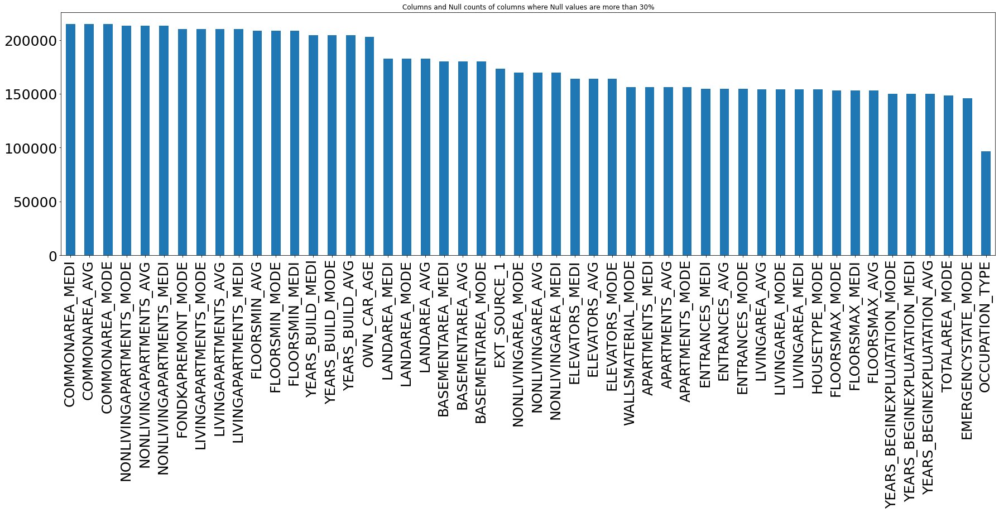

In [12]:
#plot columns with >30% null counts
plt.figure(figsize=(30,8))
columns_remove.plot(kind='bar')
plt.title('Columns and Null counts of columns where Null values are more than 30%')
plt.tick_params(axis='both', which='major', labelsize=25)
plt.show()

### 2.2 Drop columns with null values more than 30%

In [13]:
#drop columns with more than 30% null values
df_app = df_app.loc[:,df_app.isnull().mean()<=0.3]
df_app.shape

(307511, 72)

In [14]:
#columns left in current application dataset
df_app.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       

### 2.3 Drop more columns without logical correlation with probability of default 

In [15]:
#Personal assumption on columns which may not be logically correlated hence dropped
df_app.drop(['WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START','OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'], axis = 1, inplace = True)

### 2.4 Drop document columns as data is heavily imbalaced for document provided. Most cases document has not been provided. And there is no indication on type of document, hence we cannot logically conclude.

In [16]:
#Flag docs have much cases for defaulters and no indication on what each category of document refers to
#New dataframe to analyze the flagdocuments
df_app_Flagdoc = df_app[['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
       'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12',
       'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15',
       'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18',
       'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'TARGET']]

In [17]:
#create new df for anlyzing the flagdocs
df_app_Flagdoc['TARGET']=df_app_Flagdoc['TARGET'].replace({1:"defaulter",0:"non-defaulter"})
df_app_Flagdoc.head(10)

,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,...,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,TARGET
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,defaulter
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,non-defaulter
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,non-defaulter
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,non-defaulter
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,non-defaulter
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,non-defaulter
6,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,non-defaulter
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,non-defaulter
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,non-defaulter
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,non-defaulter


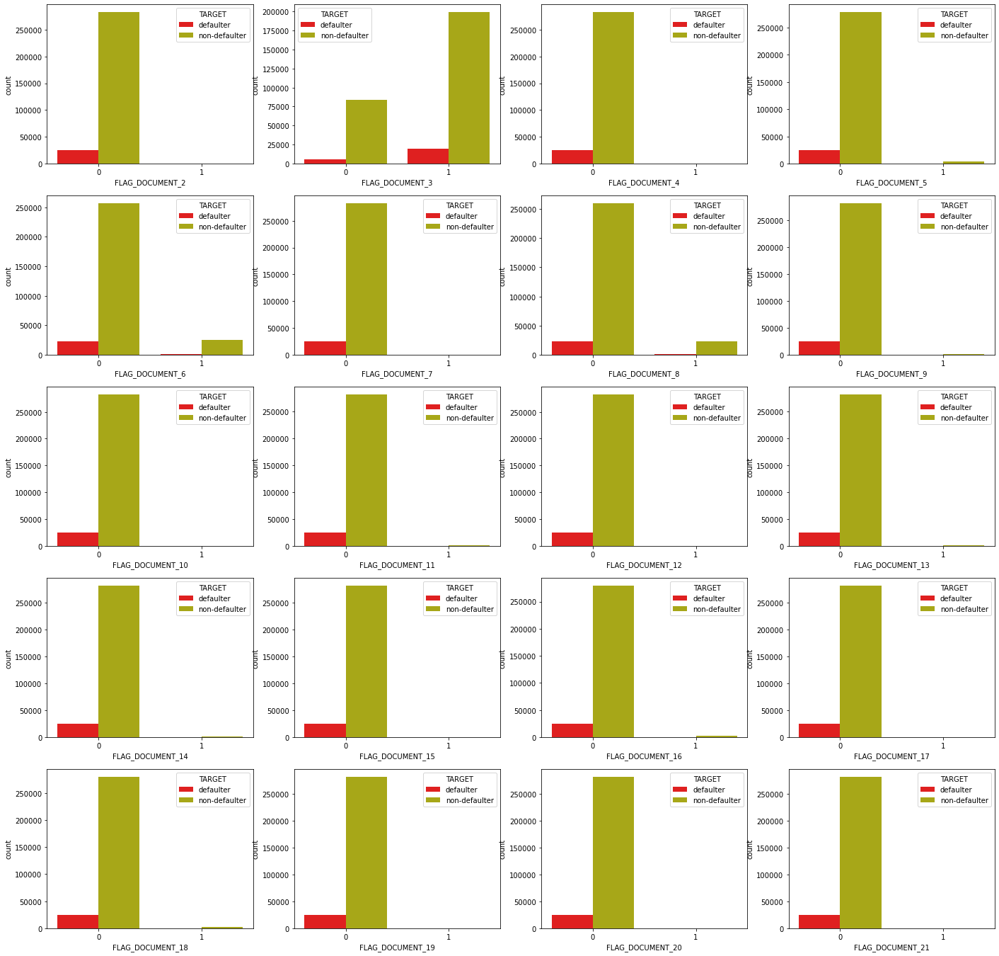

In [18]:
#segmented plotting for different flag docs wrt Target
fig = plt.figure(figsize=(24,24))

for c in range(0,20):
    plt.subplot(5,4,c+1)
    sns.countplot(df_app_Flagdoc.iloc[:,c],hue=df_app_Flagdoc["TARGET"],palette=["r","y"])

In [19]:
#dropping the flag docs columns
df_app.drop(['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
       'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12',
       'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15',
       'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18',
       'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21'], axis = 1, inplace = True)

In [20]:
#columns left in current application dataset
df_app.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2',
       'EXT_SOURCE_3'],
      dtype='object')

### 2.5 Dropping more columns with weak correlation

In [21]:
#some more columns with weak correlation
fig = plt.figure(figsize=(24,10))
df_app_Extsource = df_app[['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'EXT_SOURCE_2', 'EXT_SOURCE_3','TARGET']]
corr_df_app_Extsource = df_app_Extsource.corr()

<Figure size 1728x720 with 0 Axes>

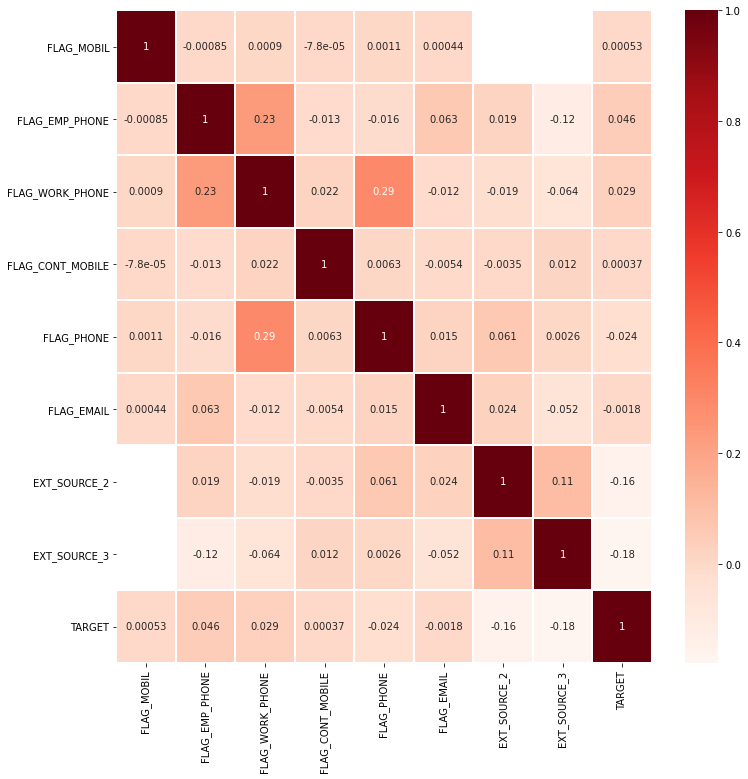

In [22]:
fig = plt.figure(figsize=(12,12))
sns.heatmap(corr_df_app_Extsource,
            xticklabels=corr_df_app_Extsource.columns,
            yticklabels=corr_df_app_Extsource.columns,
            annot = True,
            cmap ="Reds",
            linewidth=1)
plt.show()

In [23]:
# corrl for the above selected columns vary from 0.00053 to 0.018 which is significantly low, hence dropped
df_app.drop(['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_ID_PUBLISH'], axis = 1, inplace = True)

## 3.0 Data Cleaning : Correct Dtypes, Handling Outliers, Standardize values, Impute/remove missing values, Data Imbalance

In [24]:
#columns left in application dataset for analysis
df_app.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE'],
      dtype='object')

In [25]:
#Columns containing null values
df_app.isnull().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
FLAG_OWN_REALTY                   0
CNT_CHILDREN                      0
AMT_INCOME_TOTAL                  0
AMT_CREDIT                        0
AMT_ANNUITY                      12
AMT_GOODS_PRICE                 278
NAME_TYPE_SUITE                1292
NAME_INCOME_TYPE                  0
NAME_EDUCATION_TYPE               0
NAME_FAMILY_STATUS                0
NAME_HOUSING_TYPE                 0
REGION_POPULATION_RELATIVE        0
DAYS_BIRTH                        0
DAYS_EMPLOYED                     0
DAYS_REGISTRATION                 0
CNT_FAM_MEMBERS                   2
REGION_RATING_CLIENT              0
REGION_RATING_CLIENT_W_CITY       0
REG_REGION_NOT_LIVE_REGION        0
REG_REGION_NOT_WORK_REGION        0
LIVE_REGION_NOT_WORK_REGION       0
REG_CITY_NOT_LIVE_CITY            0
REG_CITY_NOT_WORK_CITY      

#### 3.1 No manipulation required for TARGET

In [26]:
#data for target in proper shape
df_app['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

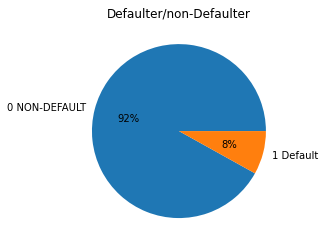

In [27]:
plt.pie(df_app['TARGET'].value_counts(normalize=True)*100,labels=['0 NON-DEFAULT','1 Default'],autopct='%1.f%%')
plt.title('Defaulter/non-Defaulter')
plt.show()

The data in the TARGET column is imbalanced and the imbalace ration is 8.07/91.92 = 0.877 tilted towards the non-deafult side

#### 3.2 No manipulation required for NAME_CONTRACT_TYPE

In [28]:
df_app['NAME_CONTRACT_TYPE'].value_counts()

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

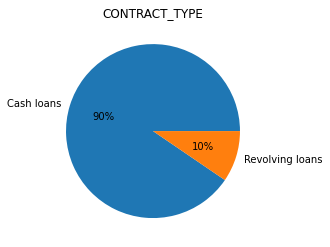

In [29]:
# Imbalanced Data wrt CONTRACT_TYPE
plt.pie(df_app['NAME_CONTRACT_TYPE'].value_counts(normalize=True)*100, labels=['Cash loans','Revolving loans'],autopct='%1.f%%')
plt.title('CONTRACT_TYPE')
plt.show()

NAME_CONTRACT_TYPE columns is also imbalanced and data is tilted towards Cash Loans

In [30]:
# split dataset according to diff loan types
df_app_CashLoans=df_app.loc[df_app["NAME_CONTRACT_TYPE"]=='Cash loans']
df_app_RevolvingLoans=df_app.loc[df_app["NAME_CONTRACT_TYPE"]=='Revolving loans']

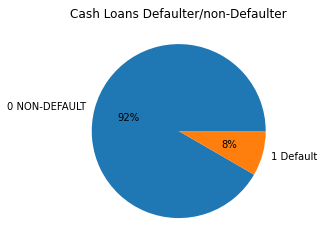

In [31]:
#plot cash loans
plt.pie(df_app_CashLoans['TARGET'].value_counts(normalize=True)*100,labels=['0 NON-DEFAULT','1 Default'],autopct='%1.f%%')
plt.title('Cash Loans Defaulter/non-Defaulter')
plt.show()

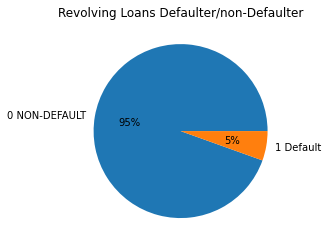

In [32]:
#plot revolving loans
plt.pie(df_app_RevolvingLoans['TARGET'].value_counts(normalize=True)*100,labels=['0 NON-DEFAULT','1 Default'],autopct='%1.f%%')
plt.title('Revolving Loans Defaulter/non-Defaulter')
plt.show()

Revolving loans have lesser default than Cash loans.

#### 3.3 NA values replaced as F in CODE_GENDER

In [33]:
df_app['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

More Females have applied for a credit from the bank as compared to Males.

In [34]:
df_app['CODE_GENDER']=df_app['CODE_GENDER'].replace('XNA','F')
df_app['CODE_GENDER'].value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

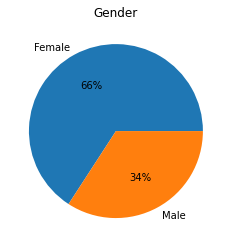

In [35]:
plt.pie(df_app['CODE_GENDER'].value_counts(normalize=True)*100, labels=['Female','Male'],autopct='%1.f%%')
plt.title('Gender')
plt.show()

As NA values are quite small, imputed F as median for the column

In [36]:
df_app_Male=df_app[df_app["CODE_GENDER"]=='M']
df_app_Female=df_app[df_app["CODE_GENDER"]=='F']

In [37]:
df_app_Male['TARGET'].value_counts()

0    94404
1    10655
Name: TARGET, dtype: int64

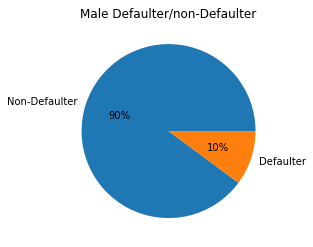

In [38]:
#pie chart for males wrt to TARGET
plt.pie(df_app_Male['TARGET'].value_counts(normalize=True)*100, labels=['Non-Defaulter','Defaulter'], autopct='%1.f%%')
plt.title('Male Defaulter/non-Defaulter')
plt.show()

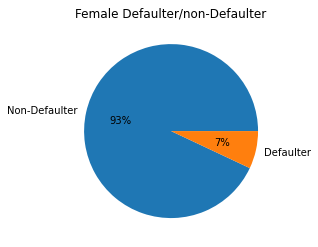

In [39]:
#pie chart for females wrt to TARGET
plt.pie(df_app_Female['TARGET'].value_counts(normalize=True)*100,labels=['Non-Defaulter','Defaulter'],autopct='%1.f%%')
plt.title('Female Defaulter/non-Defaulter')
plt.show()

#### 3.4 No manipulation required for FLAG_OWN_CAR

In [40]:
df_app['FLAG_OWN_CAR'].value_counts()

N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64

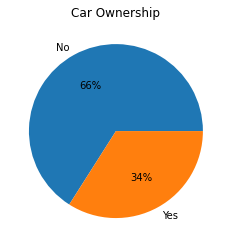

In [41]:
plt.pie(df_app['FLAG_OWN_CAR'].value_counts(normalize=True)*100, labels=['No','Yes'],autopct='%1.f%%')
plt.title('Car Ownership')
plt.show()

#### 3.5 No manipulation required for FLAG_OWN_REALTY

In [42]:
df_app['FLAG_OWN_REALTY'].value_counts()

Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

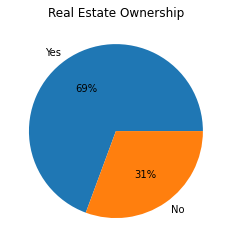

In [43]:
plt.pie(df_app['FLAG_OWN_REALTY'].value_counts(normalize=True)*100, labels=['Yes','No'],autopct='%1.f%%')
plt.title('Real Estate Ownership')
plt.show()

#### 3.6 Removed records having children > 7, assuming high prob of incorrect info provided

In [44]:
df_app['CNT_CHILDREN'].value_counts()

0     215371
1      61119
2      26749
3       3717
4        429
5         84
6         21
7          7
14         3
8          2
9          2
10         2
12         2
19         2
11         1
Name: CNT_CHILDREN, dtype: int64

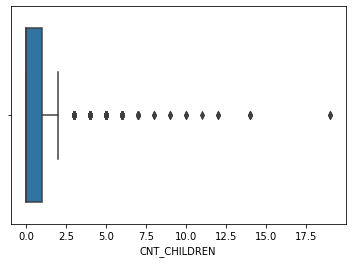

In [45]:
sns.boxplot(df_app['CNT_CHILDREN'])
plt.show()

In [46]:
df_app = df_app[df_app['CNT_CHILDREN']<8]

In [47]:
df_app['CNT_CHILDREN'].value_counts()

0    215371
1     61119
2     26749
3      3717
4       429
5        84
6        21
7         7
Name: CNT_CHILDREN, dtype: int64

<AxesSubplot:>

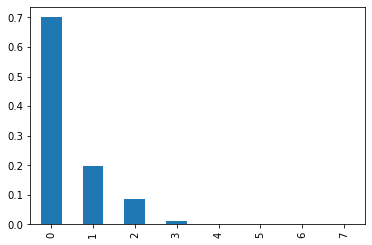

In [48]:
df_app['CNT_CHILDREN'].value_counts(normalize=True).plot.bar()

Logically assuming the relation between number of childern and high financial commitments. There may be a possibility of higher default with higher number of childeren. Hence as data looks incorrect, I decided to remove the outlier

#### 3.7 Dropping record with AMT_INCOME_TOTAL > 120 million as it will contribut to bias

In [49]:
df_app['AMT_INCOME_TOTAL'].value_counts()

135000.0    35750
112500.0    31016
157500.0    26556
180000.0    24718
90000.0     22483
            ...  
83479.5         1
44955.0         1
78916.5         1
37008.0         1
131125.5        1
Name: AMT_INCOME_TOTAL, Length: 2548, dtype: int64

In [50]:
df_app['AMT_INCOME_TOTAL in Ks'] = df_app['AMT_INCOME_TOTAL'].apply(lambda x: round(x/1000, 2))

In [51]:
df_app = df_app[df_app['AMT_INCOME_TOTAL in Ks']<5000]

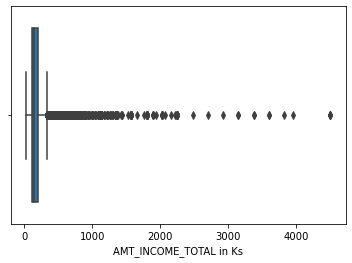

In [52]:
sns.boxplot(df_app['AMT_INCOME_TOTAL in Ks'])
plt.show()

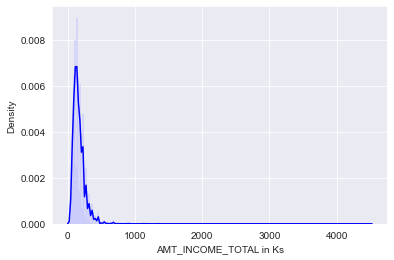

In [53]:
sns.set_style('darkgrid')
sns.distplot(df_app['AMT_INCOME_TOTAL in Ks'], color ='blue', bins = 300)
plt.show()

For better visualization of data outliers above 5,000,000 income were discarded and column was rescaled to in 1000 instead of 1.

In [54]:
df_app['AMT_INCOME_RANGE'] = pd.qcut(df_app['AMT_INCOME_TOTAL in Ks'], q=[0, 0.2, 0.4, 0.6, 0.8, 1], labels=['VERY_LOW', 'LOW', "MEDIUM", 'HIGH', 'VERY_HIGH'])
df_app['AMT_INCOME_RANGE'].head()

0         HIGH
1    VERY_HIGH
2     VERY_LOW
3          LOW
4          LOW
Name: AMT_INCOME_RANGE, dtype: category
Categories (5, object): ['VERY_LOW' < 'LOW' < 'MEDIUM' < 'HIGH' < 'VERY_HIGH']

In [55]:
df_app.drop(['AMT_INCOME_TOTAL'], axis = 1, inplace = True)

Creation of new feature AMT_INCOME_RANGE by binning AMT_INCOME_TOTAL

#### 3.8 Converting AMT_CREDIT in 1000s

In [56]:
df_app['AMT_CREDIT in Ks'] = df_app['AMT_CREDIT'].apply(lambda x: round(x/1000, 2))

In [57]:
df_app['AMT_CREDIT in Ks']

0          406.60
1         1293.50
2          135.00
3          312.68
4          513.00
           ...   
307506     254.70
307507     269.55
307508     677.66
307509     370.11
307510     675.00
Name: AMT_CREDIT in Ks, Length: 307492, dtype: float64

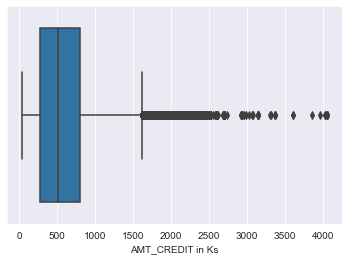

In [58]:
#Prefer not imputing/removing outliers as they are continuous
sns.boxplot(df_app['AMT_CREDIT in Ks'])
plt.show()

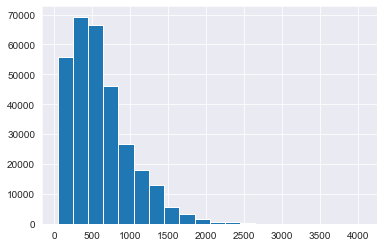

In [59]:
hist = df_app['AMT_CREDIT in Ks'].hist(bins=20)

The credited amount was rescaled in 1000s instead of 1

In [60]:
df_app['AMT_CREDIT_RANGE'] = pd.qcut(df_app['AMT_CREDIT'], q=[0, 0.2, 0.4, 0.6, 0.8, 1], labels=['VERY_LOW', 'LOW', "MEDIUM", 'HIGH', 'VERY_HIGH'])
df_app['AMT_CREDIT_RANGE'].head()

0          LOW
1    VERY_HIGH
2     VERY_LOW
3          LOW
4       MEDIUM
Name: AMT_CREDIT_RANGE, dtype: category
Categories (5, object): ['VERY_LOW' < 'LOW' < 'MEDIUM' < 'HIGH' < 'VERY_HIGH']

In [61]:
df_app.drop(['AMT_CREDIT'], axis = 1, inplace = True)

Creation of new feature AMT_CREDIT_RANGE by binning AMT_CREDIT

#### 3.9 Converting AMT_ANNUITY in 1000s + fill null with median values

In [62]:
df_app['AMT_ANNUITY'].value_counts()

9000.0     6385
13500.0    5514
6750.0     2279
10125.0    2034
37800.0    1602
           ... 
41980.5       1
43015.5       1
68058.0       1
58905.0       1
70429.5       1
Name: AMT_ANNUITY, Length: 13670, dtype: int64

In [63]:
df_app['AMT_ANNUITY in Ks'] = df_app['AMT_ANNUITY'].apply(lambda x: round(x/1000, 2))
df_app['AMT_ANNUITY in Ks'] = df_app['AMT_ANNUITY in Ks'].fillna(df_app['AMT_ANNUITY in Ks'].median())

In [64]:
df_app['AMT_ANNUITY in Ks']

0         24.70
1         35.70
2          6.75
3         29.69
4         21.87
          ...  
307506    27.56
307507    12.00
307508    29.98
307509    20.20
307510    49.12
Name: AMT_ANNUITY in Ks, Length: 307492, dtype: float64

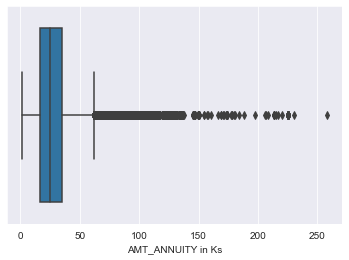

In [65]:
#Prefer not imputing/removing outliers as they are continuous
sns.boxplot(df_app['AMT_ANNUITY in Ks'])
plt.show()

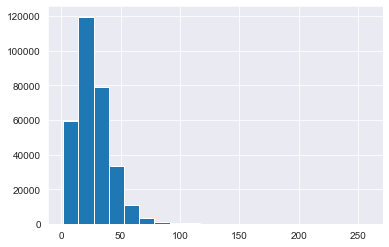

In [66]:
hist = df_app['AMT_ANNUITY in Ks'].hist(bins=20)

The credited amount was rescaled in 1000s instead of 1

In [67]:
df_app['AMT_ANNUITY_RANGE'] = pd.qcut(df_app['AMT_ANNUITY'], q=[0, 0.2, 0.4, 0.6, 0.8, 1], labels=['VERY_LOW', 'LOW', "MEDIUM", 'HIGH', 'VERY_HIGH'])
df_app['AMT_ANNUITY_RANGE'].head()

0      MEDIUM
1        HIGH
2    VERY_LOW
3        HIGH
4         LOW
Name: AMT_ANNUITY_RANGE, dtype: category
Categories (5, object): ['VERY_LOW' < 'LOW' < 'MEDIUM' < 'HIGH' < 'VERY_HIGH']

In [68]:
df_app.drop(['AMT_ANNUITY'], axis = 1, inplace = True)

Creation of new feature AMT_ANNUITY_RANGE by binning AMT_ANNUITY

#### 3.10 Converting AMT_GOODS_PRICE in 1000s + fill null with median values

In [69]:
df_app['AMT_GOODS_PRICE'].value_counts()

450000.0     26021
225000.0     25280
675000.0     24958
900000.0     15416
270000.0     11428
             ...  
592452.0         1
1130125.5        1
362632.5         1
498856.5         1
1271875.5        1
Name: AMT_GOODS_PRICE, Length: 1002, dtype: int64

In [70]:
df_app['AMT_GOODS_PRICE'] = df_app['AMT_GOODS_PRICE'].fillna(df_app['AMT_GOODS_PRICE'].median())

In [71]:
df_app['AMT_GOODS_PRICE in Ks'] = df_app['AMT_GOODS_PRICE'].apply(lambda x: round(x/1000, 2))

The credited amount was rescaled in 1000s instead of 1

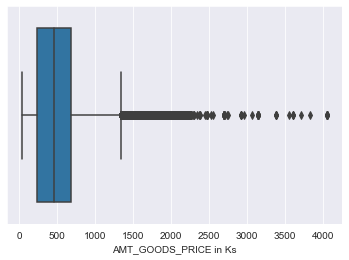

In [72]:
#Prefer not imputing/removing outliers as they are continuous
sns.boxplot(df_app['AMT_GOODS_PRICE in Ks'])
plt.show()

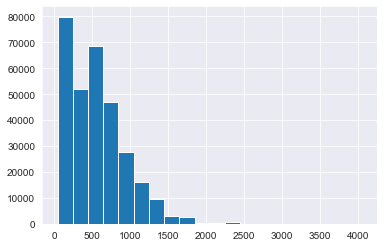

In [73]:
hist = df_app['AMT_GOODS_PRICE in Ks'].hist(bins=20)

In [74]:
# binning AMT_GOODS_PRICE and creating new feature AMT_GOODS_RANGE
df_app['AMT_GOODS_RANGE'] = pd.qcut(df_app['AMT_GOODS_PRICE'], q=[0, 0.2, 0.4, 0.6, 0.8, 1], labels=['VERY_LOW', 'LOW', "MEDIUM", 'HIGH', 'VERY_HIGH'])
df_app['AMT_GOODS_RANGE'].head()

0          LOW
1    VERY_HIGH
2     VERY_LOW
3          LOW
4       MEDIUM
Name: AMT_GOODS_RANGE, dtype: category
Categories (5, object): ['VERY_LOW' < 'LOW' < 'MEDIUM' < 'HIGH' < 'VERY_HIGH']

In [75]:
df_app.drop(['AMT_GOODS_PRICE'], axis = 1, inplace = True)

Creation of new feature AMT_GOODS_RANGE by binning AMT_GOODS_PRICE

#### 3.10 fill null with median values for NAME_TYPE_SUITE as null amount is quite less

In [76]:
df_app['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248513
Family              40144
Spouse, partner     11370
Children             3266
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

In [77]:
mde = df_app['NAME_TYPE_SUITE'].mode().values[0]
df_app['NAME_TYPE_SUITE'].fillna(value=mde, inplace=True)

In [78]:
df_app[df_app['NAME_TYPE_SUITE'].isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,...,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,AMT_INCOME_TOTAL in Ks,AMT_INCOME_RANGE,AMT_CREDIT in Ks,AMT_CREDIT_RANGE,AMT_ANNUITY in Ks,AMT_ANNUITY_RANGE,AMT_GOODS_PRICE in Ks,AMT_GOODS_RANGE


<AxesSubplot:>

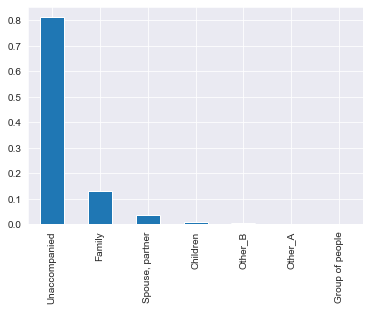

In [79]:
df_app['NAME_TYPE_SUITE'].value_counts(normalize=True).plot.bar()

The NA/null values were filled with mode which is unaccompanied

#### 3.11  No manipulation required for NAME_INCOME_TYPE

In [80]:
df_app['NAME_INCOME_TYPE'].value_counts()

Working                 158763
Commercial associate     71611
Pensioner                55361
State servant            21702
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

<AxesSubplot:>

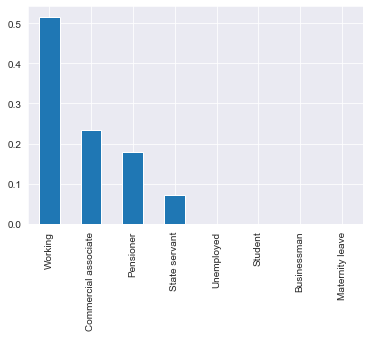

In [81]:
df_app['NAME_INCOME_TYPE'].value_counts(normalize=True).plot.bar()

#### 3.12 No manipulation required for NAME_EDUCATION_TYPE

In [82]:
df_app['NAME_EDUCATION_TYPE'].value_counts()

Secondary / secondary special    218379
Higher education                  74856
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64

<AxesSubplot:>

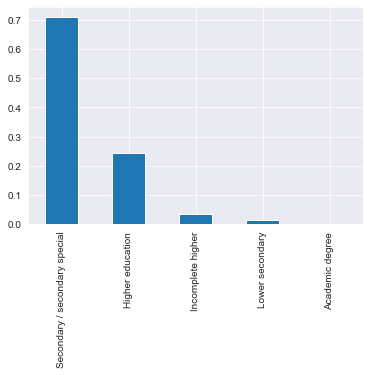

In [83]:
df_app['NAME_EDUCATION_TYPE'].value_counts(normalize=True).plot.bar()

#### 3.13 Converting Unknown NAME_FAMILY_STATUS as married

In [84]:
df_app['NAME_FAMILY_STATUS'].value_counts()

Married                 196419
Single / not married     45441
Civil marriage           29773
Separated                19769
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

In [85]:
df_app['NAME_FAMILY_STATUS'] = df_app['NAME_FAMILY_STATUS'].replace('Unknown', 'Married')
df_app['NAME_FAMILY_STATUS'].value_counts()

Married                 196421
Single / not married     45441
Civil marriage           29773
Separated                19769
Widow                    16088
Name: NAME_FAMILY_STATUS, dtype: int64

<AxesSubplot:>

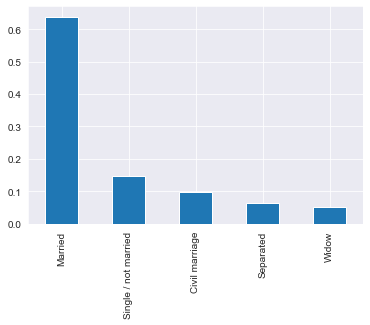

In [86]:
df_app['NAME_FAMILY_STATUS'].value_counts(normalize=True).plot.bar()

Imputed Married to the Unknown values

#### 3.14 No manipulation required for NAME_EDUCATION_TYPE

In [87]:
df_app['NAME_HOUSING_TYPE'].value_counts()

House / apartment      272851
With parents            14840
Municipal apartment     11181
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64

<AxesSubplot:>

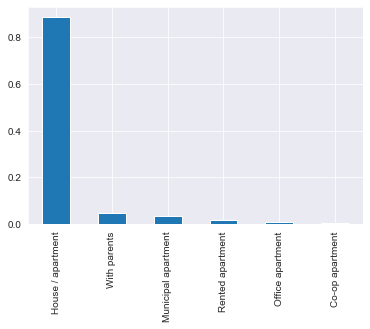

In [88]:
df_app['NAME_HOUSING_TYPE'].value_counts(normalize=True).plot.bar()

#### 3.15 REGION_POPULATION_RELATIVE converte to scale 100ks and outlier imputed with median as it was discontinuous

In [89]:
df_app['REGION_POPULATION_RELATIVE'].value_counts()

0.035792    16408
0.046220    13440
0.030755    12161
0.025164    11950
0.026392    11601
            ...  
0.001417      467
0.001333      235
0.000533       39
0.000938       28
0.000290        2
Name: REGION_POPULATION_RELATIVE, Length: 81, dtype: int64

In [90]:
df_app['REGION_POPULATION_RELATIVE in 100Ks'] = df_app['REGION_POPULATION_RELATIVE'].apply(lambda x: round(x*1000, 2))
df_app.drop(['REGION_POPULATION_RELATIVE'], axis = 1, inplace = True)

In [91]:
df_app['REGION_POPULATION_RELATIVE in 100Ks'].value_counts()

35.79    16408
46.22    13440
30.76    12161
25.16    11950
26.39    11601
         ...  
1.42       467
1.33       235
0.53        39
0.94        28
0.29         2
Name: REGION_POPULATION_RELATIVE in 100Ks, Length: 80, dtype: int64

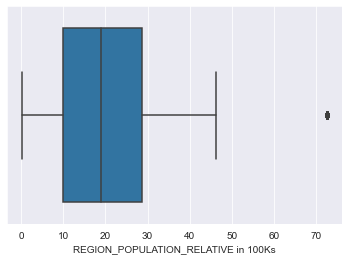

In [92]:
sns.boxplot(df_app['REGION_POPULATION_RELATIVE in 100Ks'])
plt.show()

In [93]:
med = df_app['REGION_POPULATION_RELATIVE in 100Ks'].median()
df_app['REGION_POPULATION_RELATIVE in 100Ks'] = df_app['REGION_POPULATION_RELATIVE in 100Ks'].apply(lambda x: x if x<50 else med)

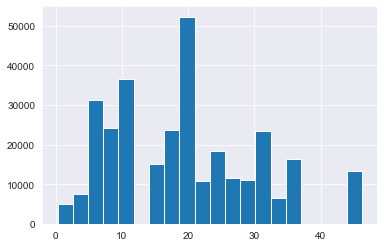

In [94]:
hist = df_app['REGION_POPULATION_RELATIVE in 100Ks'].hist(bins=20)

Converted teh scale to 1000s poulation and imputed the outliers above 50000 with median for better visualization

#### 3.16 Converted DAYS_BIRTH to age in years Age_Years

In [95]:
df_app['DAYS_BIRTH'].value_counts()

-13749    43
-13481    42
-18248    41
-10020    41
-10292    40
          ..
-24988     1
-7829      1
-25179     1
-25070     1
-7720      1
Name: DAYS_BIRTH, Length: 17460, dtype: int64

In [96]:
df_app['Age_Years'] = df_app['DAYS_BIRTH'].apply(lambda x: int(x/(-365)))

In [97]:
df_app['Age_Years']

0         25
1         45
2         52
3         52
4         54
          ..
307506    25
307507    56
307508    41
307509    32
307510    46
Name: Age_Years, Length: 307492, dtype: int64

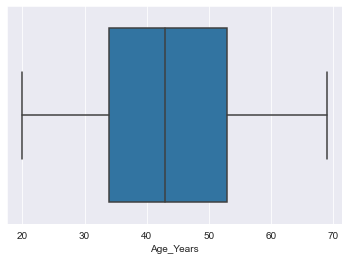

In [98]:
sns.boxplot(df_app['Age_Years'])
plt.show()

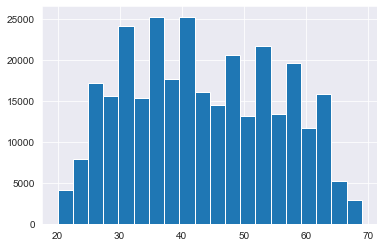

In [99]:
hist = df_app['Age_Years'].hist(bins=20)

Converted age from days to years

In [100]:
# binning AGE into categories
df_app['Age_Years_RANGE'] = pd.cut(df_app['Age_Years'], bins=[19,25,35,60,100], labels=['VeryYoung','Young', 'MiddleAge', 'SeniorCitizen'])
df_app['Age_Years_RANGE'].head()

0    VeryYoung
1    MiddleAge
2    MiddleAge
3    MiddleAge
4    MiddleAge
Name: Age_Years_RANGE, dtype: category
Categories (4, object): ['VeryYoung' < 'Young' < 'MiddleAge' < 'SeniorCitizen']

In [101]:
df_app.drop(['DAYS_BIRTH'], axis = 1, inplace = True)

Creating new feature Age_Years_RANGE by binning Age_Years

#### 3.17 Converted DAYS_EMPLOYED to age in years YEARS_EMPLOYED + imputing outlier

In [102]:
df_app['DAYS_EMPLOYED'].value_counts()

 365243    55373
-200         156
-224         152
-230         151
-199         151
           ...  
-11060         1
-10409         1
-10155         1
-11948         1
-12341         1
Name: DAYS_EMPLOYED, Length: 12574, dtype: int64

In [103]:
df_app['Years Employed'] = df_app['DAYS_EMPLOYED'].apply(lambda x: int(x/(-365)) if x<0 else int(x/365))
df_app.drop(['DAYS_EMPLOYED'], axis = 1, inplace = True)
df_app['Years Employed']

0            1
1            3
2            0
3            8
4            8
          ... 
307506       0
307507    1000
307508      21
307509      13
307510       3
Name: Years Employed, Length: 307492, dtype: int64

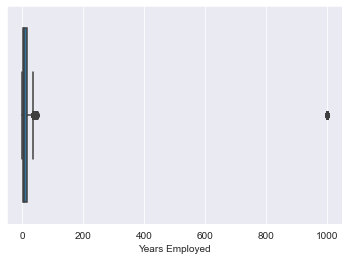

In [104]:
sns.boxplot(df_app['Years Employed'])
plt.show()

In [105]:
med = df_app['Years Employed'].median()
df_app['Years Employed'] = df_app['Years Employed'].apply(lambda x: x if x<100 else med)

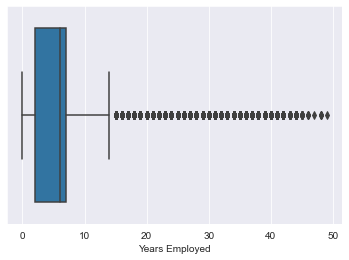

In [106]:
sns.boxplot(df_app['Years Employed'])
plt.show()

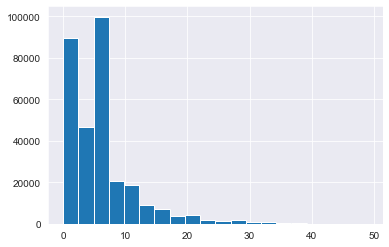

In [107]:
hist = df_app['Years Employed'].hist(bins=20)

Converted days employed to years employed

In [108]:
#binning Years_Employed and creating new feature Years_Employed_Range
df_app['Years_Employed_Range'] = pd.cut(df_app['Years Employed'], bins=[0,10,20,30,40,50,60], labels=['0-10','10-20','20-30','30-40','40-50','50-60'])
df_app['Years_Employed_Range'].head()

0    0-10
1    0-10
2     NaN
3    0-10
4    0-10
Name: Years_Employed_Range, dtype: category
Categories (6, object): ['0-10' < '10-20' < '20-30' < '30-40' < '40-50' < '50-60']

Creating new feature Years_Employed_Range by binning Years Employed.

#### 3.18 No manipulation required for DAYS_REGISTRATION

In [109]:
df_app['DAYS_REGISTRATION'].value_counts()

-1.0        113
-7.0         98
-6.0         96
-4.0         92
-2.0         92
           ... 
-14707.0      1
-12412.0      1
-15191.0      1
-17173.0      1
-13683.0      1
Name: DAYS_REGISTRATION, Length: 15688, dtype: int64

In [110]:
df_app['DAYS_REGISTRATION'] = df_app['DAYS_REGISTRATION'].abs().astype(int)
df_app['DAYS_REGISTRATION'].value_counts()

1        113
7         98
6         96
4         92
2         92
        ... 
14410      1
14872      1
14312      1
14616      1
15945      1
Name: DAYS_REGISTRATION, Length: 15687, dtype: int64

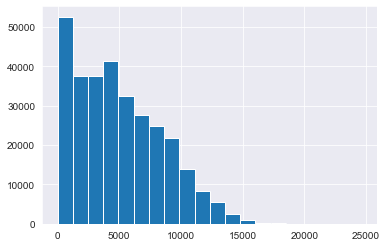

In [111]:
hist = df_app['DAYS_REGISTRATION'].hist(bins=20)

#### 3.19 Filled NA values with median for CNT_FAM_MEMBERS

In [112]:
df_app['CNT_FAM_MEMBERS'].value_counts()

2.0    158354
1.0     67847
3.0     52600
4.0     24696
5.0      3478
6.0       408
7.0        81
8.0        20
9.0         6
Name: CNT_FAM_MEMBERS, dtype: int64

In [113]:
df_app['CNT_FAM_MEMBERS'] = df_app['CNT_FAM_MEMBERS'].fillna(df_app['CNT_FAM_MEMBERS'].median())

In [114]:
df_app['CNT_FAM_MEMBERS'] = df_app['CNT_FAM_MEMBERS'].astype(int)

In [115]:
df_app['CNT_FAM_MEMBERS'].value_counts()

2    158356
1     67847
3     52600
4     24696
5      3478
6       408
7        81
8        20
9         6
Name: CNT_FAM_MEMBERS, dtype: int64

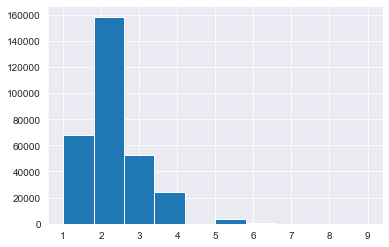

In [116]:
hist = df_app['CNT_FAM_MEMBERS'].hist(bins=10)

Filled NA values with median.

#### 3.20 No manipulation required for REGION_RATING_CLIENT

In [117]:
df_app['REGION_RATING_CLIENT'].value_counts()

2    226968
3     48329
1     32195
Name: REGION_RATING_CLIENT, dtype: int64

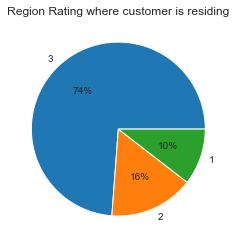

In [118]:
plt.pie(df_app['REGION_RATING_CLIENT'].value_counts(normalize=True)*100,labels=['3','2','1'],autopct='%1.f%%')
plt.title('Region Rating where customer is residing')
plt.show()

#### 3.21 No manipulation required for REGION_RATING_CLIENT_W_CITY

In [119]:
df_app['REGION_RATING_CLIENT_W_CITY'].value_counts()

2    229468
3     43859
1     34165
Name: REGION_RATING_CLIENT_W_CITY, dtype: int64

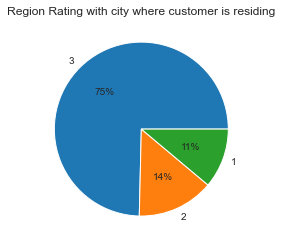

In [120]:
plt.pie(df_app['REGION_RATING_CLIENT_W_CITY'].value_counts(normalize=True)*100,labels=['3','2','1'],autopct='%1.f%%')
plt.title('Region Rating with city where customer is residing')
plt.show()

#### 3.22 No manipulation required for REG_CITY_NOT_LIVE_CITY

In [121]:
df_app['REG_CITY_NOT_LIVE_CITY'].value_counts()

0    283455
1     24037
Name: REG_CITY_NOT_LIVE_CITY, dtype: int64

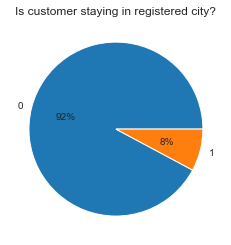

In [122]:
plt.pie(df_app['REG_CITY_NOT_LIVE_CITY'].value_counts(normalize=True)*100,labels=['0','1'],autopct='%1.f%%')
plt.title('Is customer staying in registered city?')
plt.show()

#### 3.23 No manipulation required for LIVE_CITY_NOT_WORK_CITY

In [123]:
df_app['LIVE_CITY_NOT_WORK_CITY'].value_counts()

0    252280
1     55212
Name: LIVE_CITY_NOT_WORK_CITY, dtype: int64

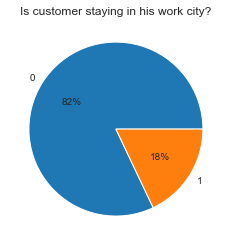

In [124]:
plt.pie(df_app['LIVE_CITY_NOT_WORK_CITY'].value_counts(normalize=True)*100,labels=['0','1'],autopct='%1.f%%')
plt.title('Is customer staying in his work city?')
plt.show()

#### 3.24 No manipulation required for ORGANIZATION_TYPE, not imputing NA values as the number i shuge and it will create bias

In [125]:
df_app['ORGANIZATION_TYPE'].value_counts()

Business Entity Type 3    67988
XNA                       55373
Self-employed             38409
Other                     16682
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8891
Trade: type 7              7831
Kindergarten               6877
Construction               6721
Business Entity Type 1     5983
Transport: type 4          5397
Trade: type 3              3492
Industry: type 9           3367
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2156
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1810
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57]),
 [Text(0, 0, 'Business Entity Type 3'),
  Text(1, 0, 'XNA'),
  Text(2, 0, 'Self-employed'),
  Text(3, 0, 'Other'),
  Text(4, 0, 'Medicine'),
  Text(5, 0, 'Business Entity Type 2'),
  Text(6, 0, 'Government'),
  Text(7, 0, 'School'),
  Text(8, 0, 'Trade: type 7'),
  Text(9, 0, 'Kindergarten'),
  Text(10, 0, 'Construction'),
  Text(11, 0, 'Business Entity Type 1'),
  Text(12, 0, 'Transport: type 4'),
  Text(13, 0, 'Trade: type 3'),
  Text(14, 0, 'Industry: type 9'),
  Text(15, 0, 'Industry: type 3'),
  Text(16, 0, 'Security'),
  Text(17, 0, 'Housing'),
  Text(18, 0, 'Industry: type 11'),
  Text(19, 0, 'Military'),
  Text(20, 0, 'Bank'),
  Text(21, 0, 'Agriculture'),
  Text(22, 0, 'Police'),
  Text(23, 0, 'Transport: type 2'),


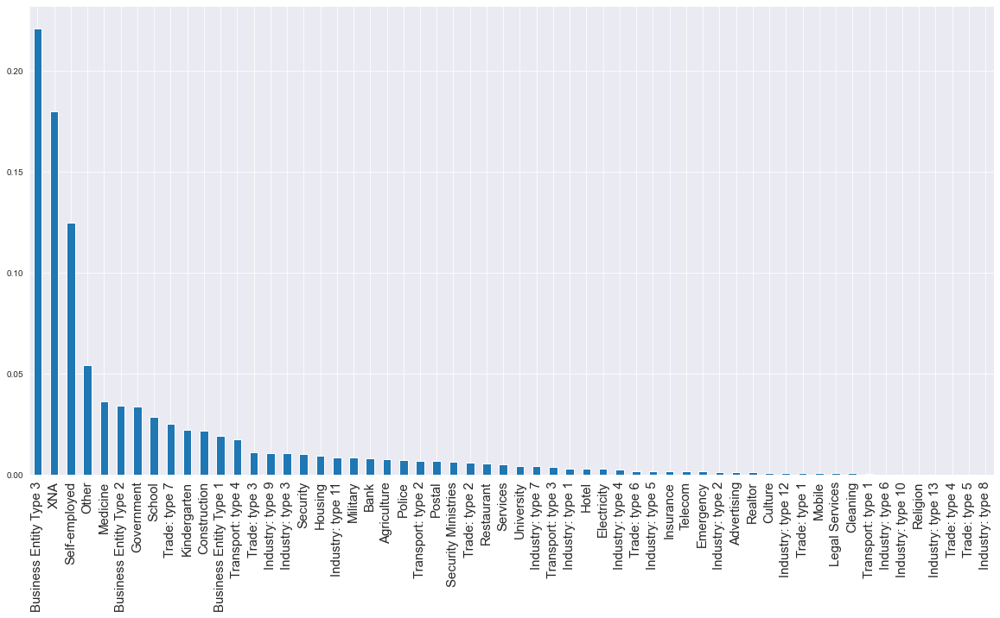

In [126]:
df_app['ORGANIZATION_TYPE'].value_counts(normalize=True).plot.bar(figsize=(20, 10))
plt.xticks(fontsize=15)


Preferred not to convert/imput XNA values as imputing will create bias and also cannot remove as the NA/null numbers are high

#### 3.24 No manipulation required for REG_REGION_NOT_LIVE_REGION

In [127]:
df_app['REG_REGION_NOT_LIVE_REGION'].value_counts()

0    302835
1      4657
Name: REG_REGION_NOT_LIVE_REGION, dtype: int64

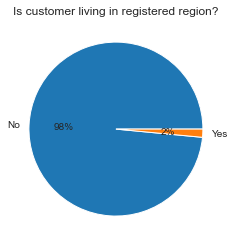

In [128]:
plt.pie(df_app['REG_REGION_NOT_LIVE_REGION'].value_counts(normalize=True)*100,labels=['No','Yes'],autopct='%1.f%%')
plt.title('Is customer living in registered region?')
plt.show()

#### 3.25 No manipulation required for REG_REGION_NOT_WORK_REGION

In [129]:
df_app['REG_REGION_NOT_WORK_REGION'].value_counts()

0    291881
1     15611
Name: REG_REGION_NOT_WORK_REGION, dtype: int64

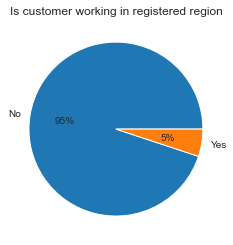

In [130]:
plt.pie(df_app['REG_REGION_NOT_WORK_REGION'].value_counts(normalize=True)*100,labels=['No','Yes'],autopct='%1.f%%')
plt.title('Is customer working in registered region')
plt.show()

#### 3.26 No manipulation required for LIVE_CITY_NOT_WORK_CITY

In [131]:
df_app['LIVE_REGION_NOT_WORK_REGION'].value_counts()

0    294990
1     12502
Name: LIVE_REGION_NOT_WORK_REGION, dtype: int64

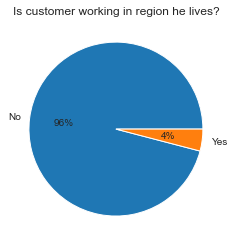

In [132]:
plt.pie(df_app['LIVE_REGION_NOT_WORK_REGION'].value_counts(normalize=True)*100,labels=['No','Yes'],autopct='%1.f%%')
plt.title('Is customer working in region he lives?')
plt.show()

#### 3.27 No manipulation required for LIVE_CITY_NOT_WORK_CITY

In [133]:
df_app['REG_CITY_NOT_LIVE_CITY'].value_counts()

0    283455
1     24037
Name: REG_CITY_NOT_LIVE_CITY, dtype: int64

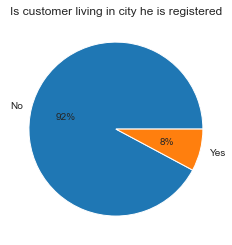

In [134]:
plt.pie(df_app['REG_CITY_NOT_LIVE_CITY'].value_counts(normalize=True)*100,labels=['No','Yes'],autopct='%1.f%%')
plt.title('Is customer living in city he is registered')
plt.show()

#### 3.28 No manipulation required for LIVE_CITY_NOT_WORK_CITY

In [135]:
df_app['REG_CITY_NOT_WORK_CITY'].value_counts()

0    236629
1     70863
Name: REG_CITY_NOT_WORK_CITY, dtype: int64

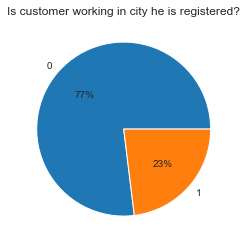

In [136]:
plt.pie(df_app['REG_CITY_NOT_WORK_CITY'].value_counts(normalize=True)*100,labels=['0','1'],autopct='%1.f%%')
plt.title('Is customer working in city he is registered?')
plt.show()

#### 3.29 Rechecks

In [137]:
df_app.columns[df_app.isna().any()]

Index(['AMT_ANNUITY_RANGE', 'Years_Employed_Range'], dtype='object')

In [138]:
df_app.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,DAYS_REGISTRATION,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,AMT_INCOME_TOTAL in Ks,AMT_CREDIT in Ks,AMT_ANNUITY in Ks,AMT_GOODS_PRICE in Ks,REGION_POPULATION_RELATIVE in 100Ks,Age_Years,Years Employed
count,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.00000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000,307492.000000
mean,278180.993886,0.080721,0.416518,4986.127720,2.152128,2.05247,2.031526,0.015145,0.050769,0.040658,0.078171,0.230455,0.179556,168.266945,599.023751,27.107675,538.313980,19.399775,43.436216,6.030339
std,102790.431689,0.272406,0.717459,3522.937402,0.907048,0.50904,0.502743,0.122130,0.219526,0.197497,0.268441,0.421125,0.383818,99.164774,402.491150,14.490712,369.288451,10.784674,11.954769,5.809747
min,100002.000000,0.000000,0.000000,0.000000,1.000000,1.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.650000,45.000000,1.620000,40.500000,0.290000,20.000000,0.000000
25%,189144.500000,0.000000,0.000000,2009.000000,2.000000,2.00000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,112.500000,270.000000,16.520000,238.500000,10.010000,34.000000,2.000000
50%,278200.500000,0.000000,0.000000,4504.000000,2.000000,2.00000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,147.150000,513.530000,24.900000,450.000000,18.850000,43.000000,6.000000
75%,367143.250000,0.000000,1.000000,7480.000000,3.000000,2.00000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,202.500000,808.650000,34.600000,679.500000,26.390000,53.000000,7.000000
max,456255.000000,1.000000,7.000000,24672.000000,9.000000,3.00000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4500.000000,4050.000000,258.030000,4050.000000,46.220000,69.000000,49.000000


#### 3.30 Datatypes look ok, will modify later when needed

In [139]:
df_app.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307492 entries, 0 to 307510
Data columns (total 36 columns):
 #   Column                               Non-Null Count   Dtype   
---  ------                               --------------   -----   
 0   SK_ID_CURR                           307492 non-null  int64   
 1   TARGET                               307492 non-null  int64   
 2   NAME_CONTRACT_TYPE                   307492 non-null  object  
 3   CODE_GENDER                          307492 non-null  object  
 4   FLAG_OWN_CAR                         307492 non-null  object  
 5   FLAG_OWN_REALTY                      307492 non-null  object  
 6   CNT_CHILDREN                         307492 non-null  int64   
 7   NAME_TYPE_SUITE                      307492 non-null  object  
 8   NAME_INCOME_TYPE                     307492 non-null  object  
 9   NAME_EDUCATION_TYPE                  307492 non-null  object  
 10  NAME_FAMILY_STATUS                   307492 non-null  object  
 11  

### 3.31 creation of new features and analysis

#### Analysis of new feature 'credit to income ratio'

In [140]:
#new feature credit to income ratio
df_app['CREDIT_INCOME_RATIO'] = df_app['AMT_CREDIT in Ks']/df_app['AMT_INCOME_TOTAL in Ks']
df_app['CREDIT_INCOME_RATIO'].value_counts()

2.000000    5304
3.000000    3921
2.500000    3142
5.000000    3119
3.333333    2816
            ... 
1.448392       1
0.470286       1
0.948107       1
1.494054       1
8.041636       1
Name: CREDIT_INCOME_RATIO, Length: 52765, dtype: int64

Creating a new feature, assuming more default with increase in credit to income ratio

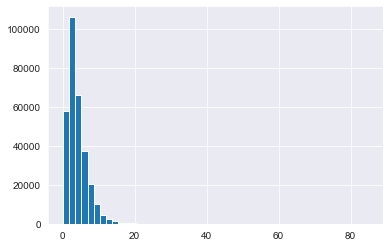

In [141]:
hist = df_app['CREDIT_INCOME_RATIO'].hist(bins=50)

#### Analysis of new feature 'income to annuity ratio'

In [142]:
#new feature income to annuity ratio
df_app['INCOME_ANNUITY_RATIO'] = df_app['AMT_INCOME_TOTAL in Ks']/df_app['AMT_ANNUITY in Ks']
df_app['INCOME_ANNUITY_RATIO'].value_counts()

10.000000    3002
6.666667     1982
15.000000    1200
12.500000    1025
8.333333      985
             ... 
5.500475        1
5.377827        1
5.738465        1
10.151466       1
3.022308        1
Name: INCOME_ANNUITY_RATIO, Length: 70603, dtype: int64

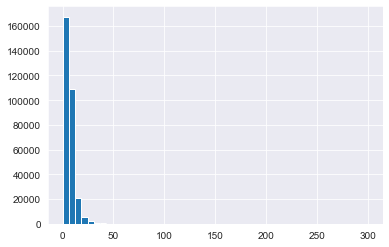

In [143]:
hist = df_app['INCOME_ANNUITY_RATIO'].hist(bins=50)

Creating a new feature, assuming more default with decrease in Income to annuity ratio

#### Analysis of new feature 'credit to annuity ratio'

In [144]:
#new feature credit to annuity ratio
df_app['CREDIT_ANNUITY_RATIO'] = df_app['AMT_CREDIT in Ks']/df_app['AMT_ANNUITY in Ks']
df_app['CREDIT_ANNUITY_RATIO'].value_counts()

20.000000    22983
20.009881     2033
34.083333     1641
30.840961     1448
34.194529     1394
             ...  
22.628613        1
9.423293         1
10.532299        1
10.521636        1
16.345234        1
Name: CREDIT_ANNUITY_RATIO, Length: 40191, dtype: int64

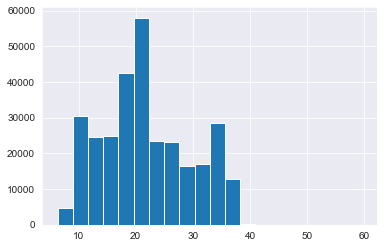

In [145]:
hist = df_app['CREDIT_ANNUITY_RATIO'].hist(bins=20)

Creating a new feature, assuming more default with decrease in credit to annuity ratio

#### Analysis of new feature 'amount credit to goodsprice ratio'

In [146]:
#new feature amount credit to goodsprice ratio
df_app['AMOUNTCREDIT_GOODSPRICE_RATIO'] = df_app['AMT_CREDIT in Ks']/df_app['AMT_GOODS_PRICE in Ks']
df_app['AMOUNTCREDIT_GOODSPRICE_RATIO'].value_counts()

1.000000    108213
1.198000     14089
1.132000     10012
1.118800      7083
1.158400      6964
             ...  
1.198001         1
1.095041         1
1.158399         1
1.055441         1
1.085813         1
Name: AMOUNTCREDIT_GOODSPRICE_RATIO, Length: 3940, dtype: int64

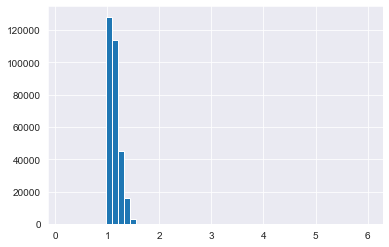

In [147]:
hist = df_app['AMOUNTCREDIT_GOODSPRICE_RATIO'].hist(bins=50)

Creating a new feature, assuming more default with decrease in Income to annuity ratio

## 3.32 converting numerical data to categorical data 

In [148]:
df_app['REGION_RATING_CLIENT'] = df_app['REGION_RATING_CLIENT'].astype('str')
df_app['REGION_RATING_CLIENT_W_CITY'] = df_app['REGION_RATING_CLIENT_W_CITY'].astype('str')
df_app['REG_REGION_NOT_LIVE_REGION'] = df_app['REG_REGION_NOT_LIVE_REGION'].astype('str').apply(lambda x: 'yes' if x=='1' else 'no')
df_app['REG_REGION_NOT_WORK_REGION'] = df_app['REG_REGION_NOT_WORK_REGION'].astype('str').apply(lambda x: 'yes' if x=='1' else 'no')
df_app['LIVE_REGION_NOT_WORK_REGION'] = df_app['LIVE_REGION_NOT_WORK_REGION'].astype('str').apply(lambda x: 'yes' if x=='1' else 'no')
df_app['REG_CITY_NOT_LIVE_CITY'] = df_app['REG_CITY_NOT_LIVE_CITY'].astype('str').apply(lambda x: 'yes' if x=='1' else 'no')
df_app['REG_CITY_NOT_WORK_CITY'] = df_app['REG_CITY_NOT_WORK_CITY'].astype('str').apply(lambda x: 'yes' if x=='1' else 'no')
df_app['LIVE_CITY_NOT_WORK_CITY'] = df_app['LIVE_CITY_NOT_WORK_CITY'].astype('str').apply(lambda x: 'yes' if x=='1' else 'no')

In [149]:
df_app['REGION_RATING_CLIENT_W_CITY'].value_counts()

2    229468
3     43859
1     34165
Name: REGION_RATING_CLIENT_W_CITY, dtype: int64

In [150]:
df_app['REG_CITY_NOT_WORK_CITY']

0          no
1          no
2          no
3          no
4         yes
         ... 
307506     no
307507     no
307508    yes
307509    yes
307510    yes
Name: REG_CITY_NOT_WORK_CITY, Length: 307492, dtype: object

In [151]:
df_app['LIVE_CITY_NOT_WORK_CITY']

0          no
1          no
2          no
3          no
4         yes
         ... 
307506     no
307507     no
307508    yes
307509     no
307510    yes
Name: LIVE_CITY_NOT_WORK_CITY, Length: 307492, dtype: object

In [152]:
df_app.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307492 entries, 0 to 307510
Data columns (total 40 columns):
 #   Column                               Non-Null Count   Dtype   
---  ------                               --------------   -----   
 0   SK_ID_CURR                           307492 non-null  int64   
 1   TARGET                               307492 non-null  int64   
 2   NAME_CONTRACT_TYPE                   307492 non-null  object  
 3   CODE_GENDER                          307492 non-null  object  
 4   FLAG_OWN_CAR                         307492 non-null  object  
 5   FLAG_OWN_REALTY                      307492 non-null  object  
 6   CNT_CHILDREN                         307492 non-null  int64   
 7   NAME_TYPE_SUITE                      307492 non-null  object  
 8   NAME_INCOME_TYPE                     307492 non-null  object  
 9   NAME_EDUCATION_TYPE                  307492 non-null  object  
 10  NAME_FAMILY_STATUS                   307492 non-null  object  
 11  

In [153]:
df_app['REG_CITY_NOT_WORK_CITY'].value_counts()

no     236629
yes     70863
Name: REG_CITY_NOT_WORK_CITY, dtype: int64

In [154]:
df_app.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307492 entries, 0 to 307510
Data columns (total 40 columns):
 #   Column                               Non-Null Count   Dtype   
---  ------                               --------------   -----   
 0   SK_ID_CURR                           307492 non-null  int64   
 1   TARGET                               307492 non-null  int64   
 2   NAME_CONTRACT_TYPE                   307492 non-null  object  
 3   CODE_GENDER                          307492 non-null  object  
 4   FLAG_OWN_CAR                         307492 non-null  object  
 5   FLAG_OWN_REALTY                      307492 non-null  object  
 6   CNT_CHILDREN                         307492 non-null  int64   
 7   NAME_TYPE_SUITE                      307492 non-null  object  
 8   NAME_INCOME_TYPE                     307492 non-null  object  
 9   NAME_EDUCATION_TYPE                  307492 non-null  object  
 10  NAME_FAMILY_STATUS                   307492 non-null  object  
 11  

Converting features having flags i.e 0,1 to categorical features by imputing Yes and No instead

## 4.0 Univariate, Segmented Univariate and Imbalanced Data

### 4.1 Imbalance in Target 

In [155]:
#splitting data set wrt TARGET
df_app_Target0=df_app.loc[df_app["TARGET"]==0]
df_app_Target1=df_app.loc[df_app["TARGET"]==1]

In [156]:
#Imablance Ratio
round(len(df_app_Target0)/len(df_app_Target1),2)

11.39

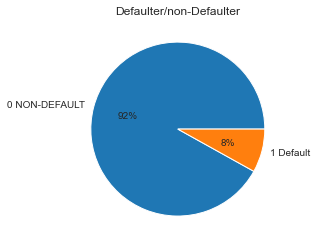

In [157]:
plt.pie(df_app['TARGET'].value_counts(normalize=True)*100,labels=['0 NON-DEFAULT','1 Default'],autopct='%1.f%%')
plt.title('Defaulter/non-Defaulter')
plt.show()

### Imbalanced data wrt to non-defaulter to defaulter is 11.39

## 5. Segment univariate analysis wrt TARGET = 0 & TARGET = 1 for ordered and unordered categorical features

In [158]:
#copied from open source the loop for univariate analysis
def masterplot(var):
    plt.style.use('fivethirtyeight')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(30,15))   
    sns.countplot(x=var, data=df_app_Target0,ax=ax1, palette=['#432371',"#FAAE7B"])
    ax1.set_ylabel('Total Counts')
    ax1.set_title(f'Distribution for Non-Defaulters {var}',fontsize=25)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, ha="right")
    for p in ax1.patches:
        ax1.annotate('{:.1f}%'.format((p.get_height()/len(df_app_Target0))*100), (p.get_x()+0.1, p.get_height()+50))
        
    sns.countplot(x=var, data=df_app_Target1,ax=ax2, palette=["#7fcdbb","#edf8b1"])
    ax2.set_ylabel('Total Counts')
    ax2.set_title(f'Distribution for Defaulters {var}',fontsize=25)    
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90, ha="right")
    for p in ax2.patches:
        ax2.annotate('{:.1f}%'.format((p.get_height()/len(df_app_Target1))*100), (p.get_x()+0.1, p.get_height()+50))
    
    plt.show()

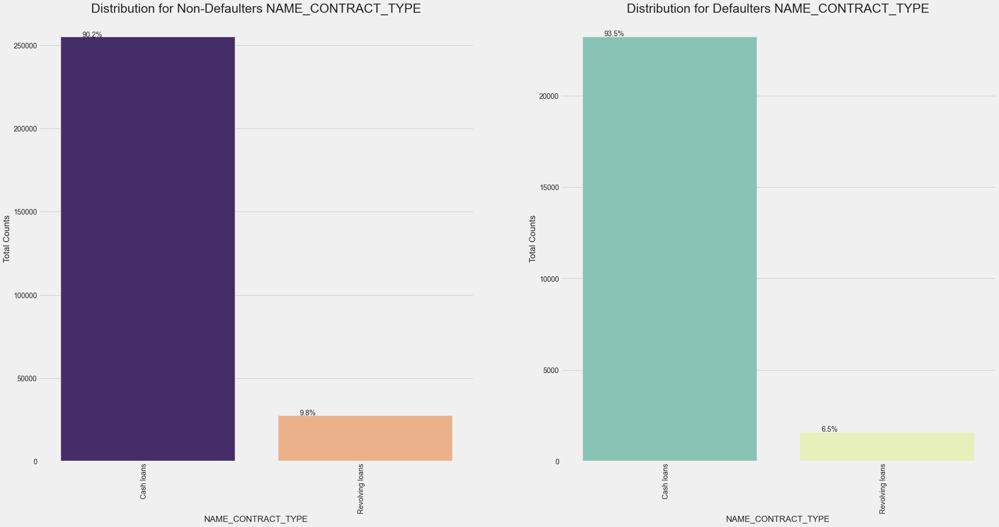

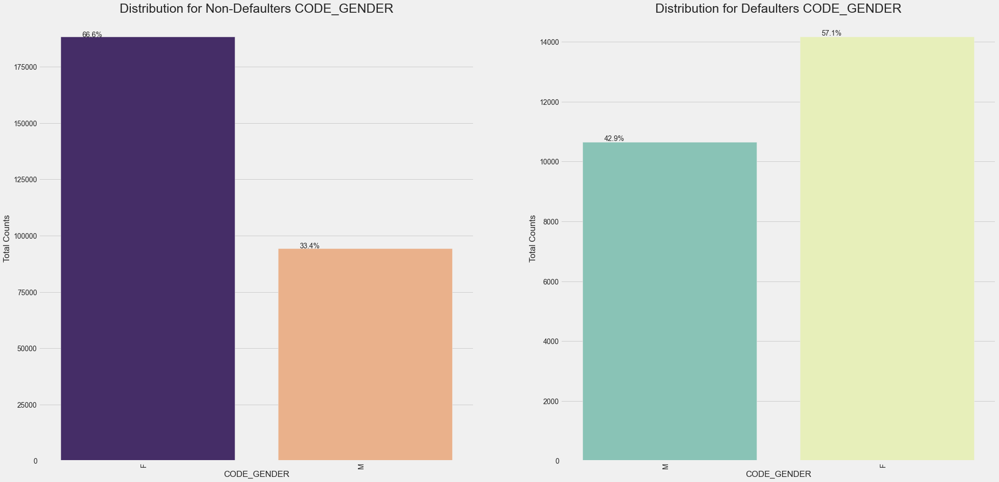

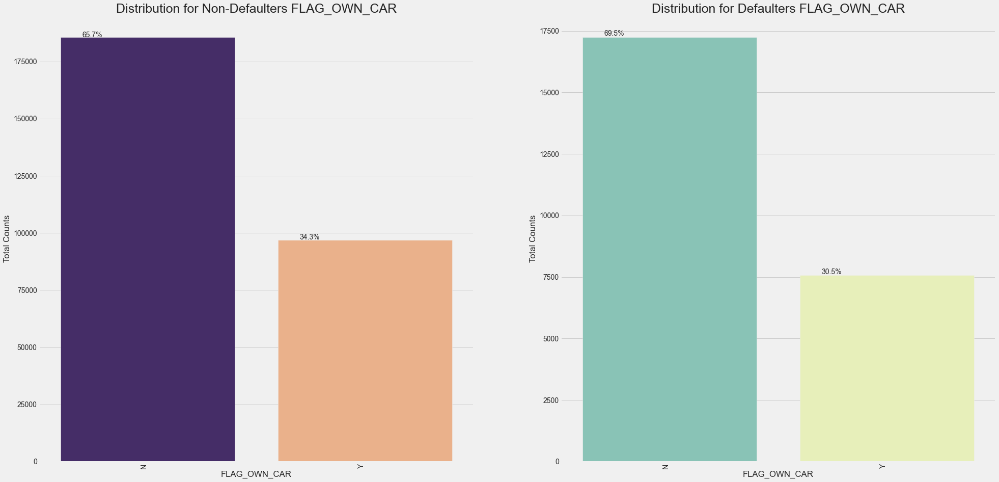

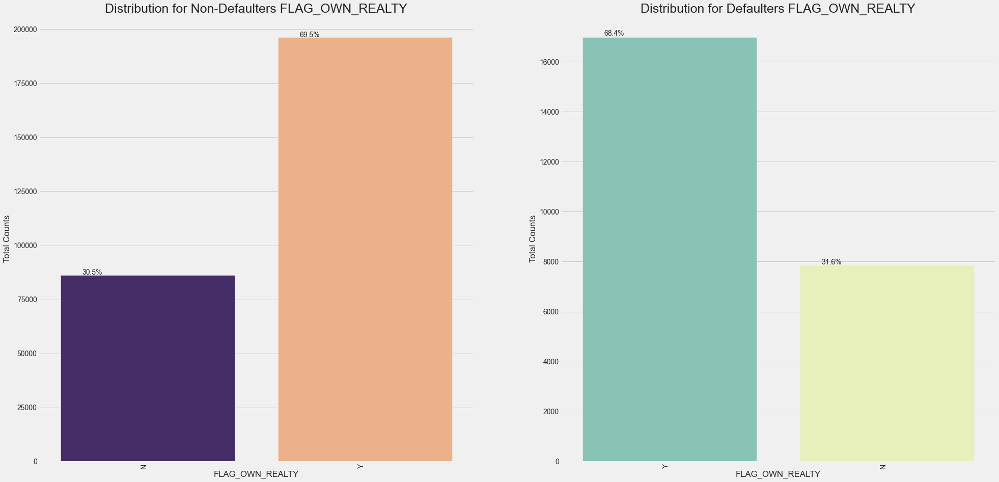

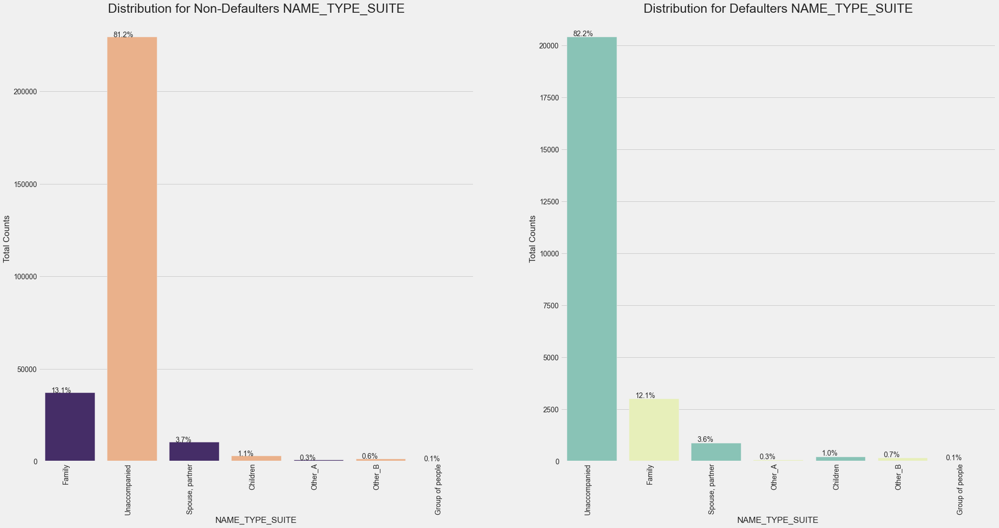

...

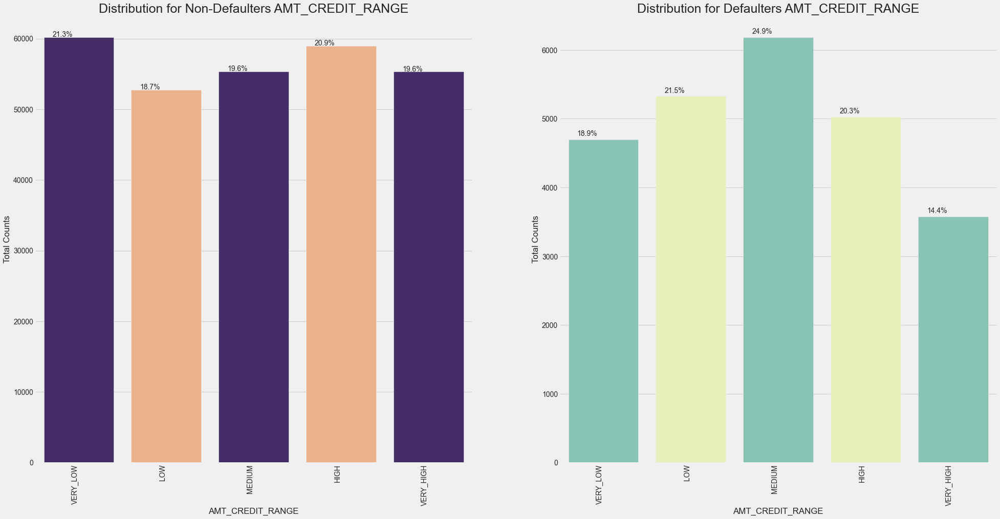

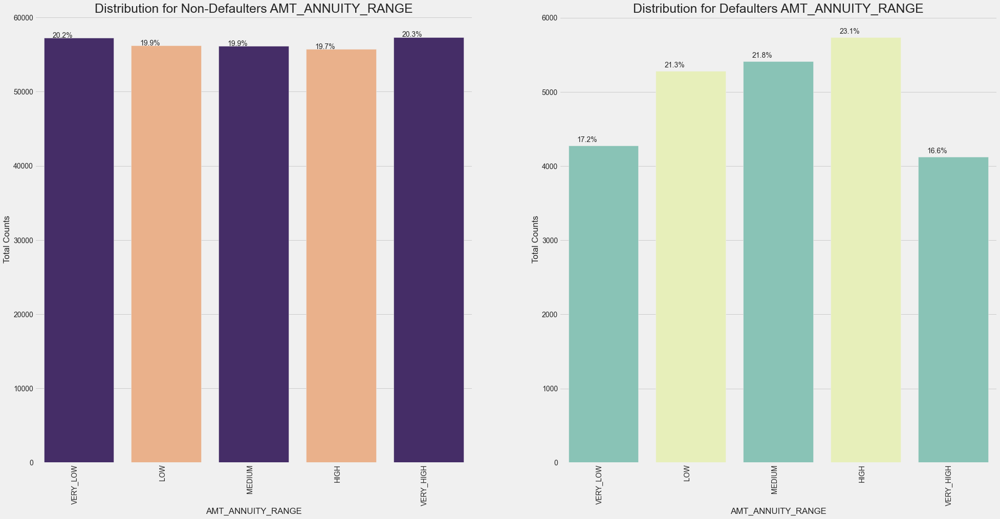

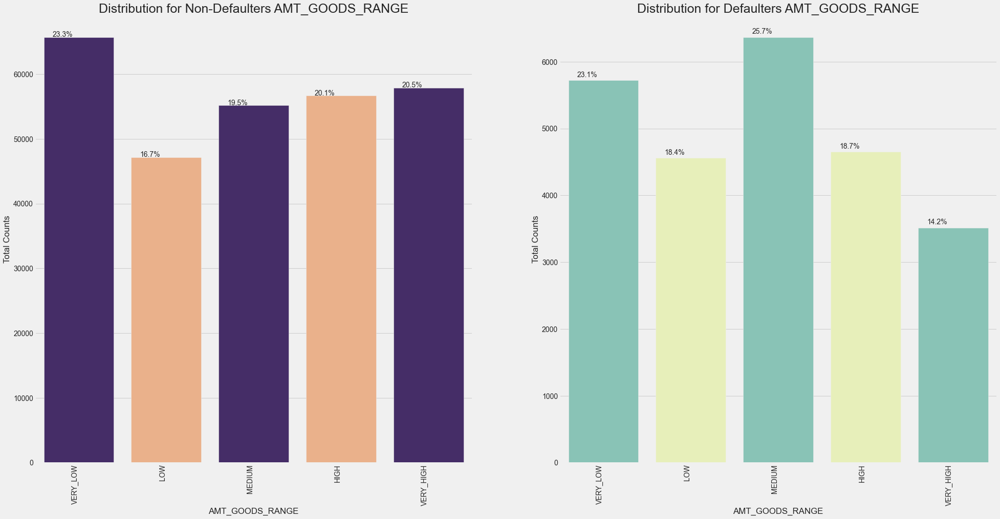

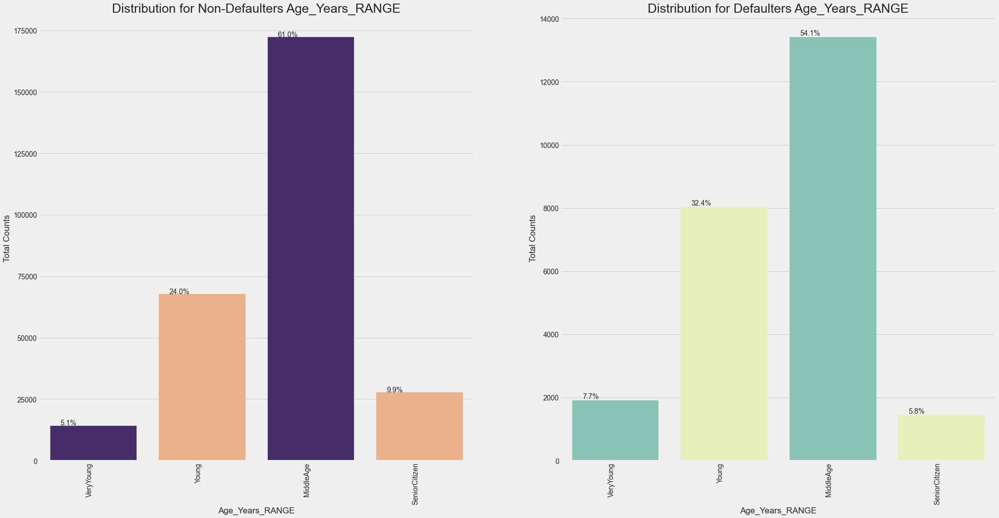

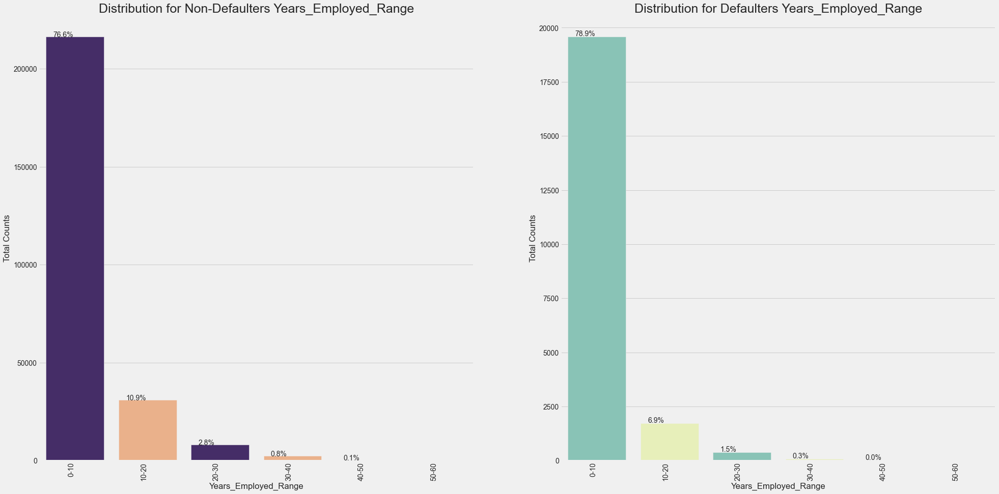

In [159]:
Categorical_columns = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 
'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'AMT_INCOME_RANGE', 'AMT_CREDIT_RANGE', 'AMT_ANNUITY_RANGE', 'AMT_GOODS_RANGE', 'Age_Years_RANGE', 'Years_Employed_Range']
for c in Categorical_columns:
    masterplot(c)

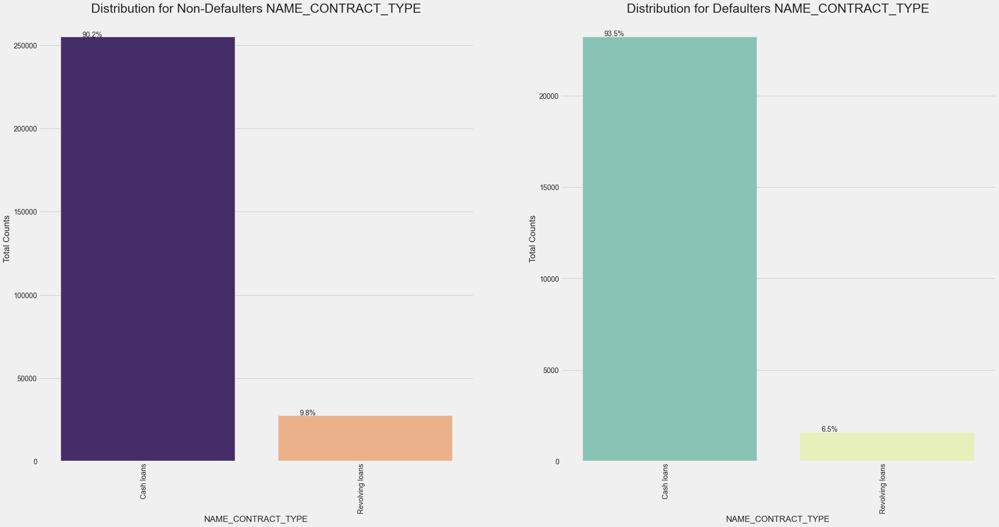

In [160]:
masterplot('NAME_CONTRACT_TYPE')

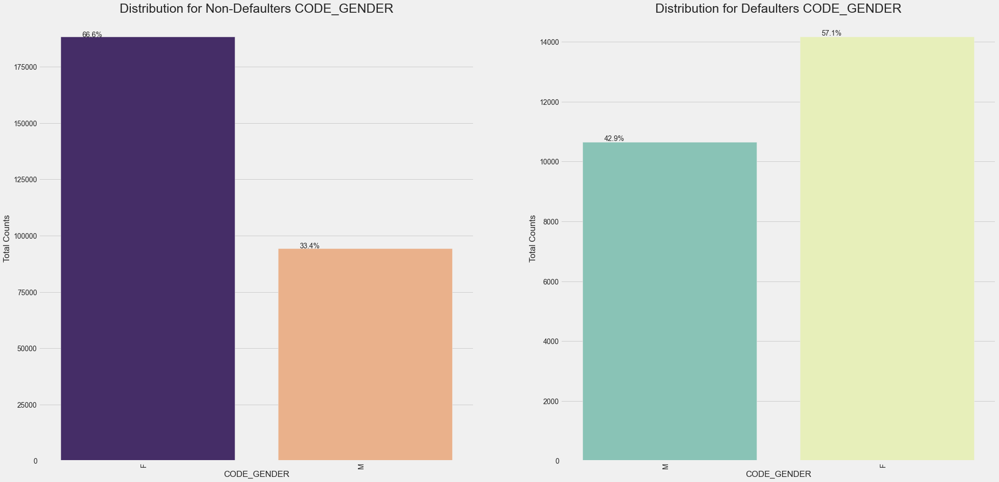

In [161]:
masterplot('CODE_GENDER')

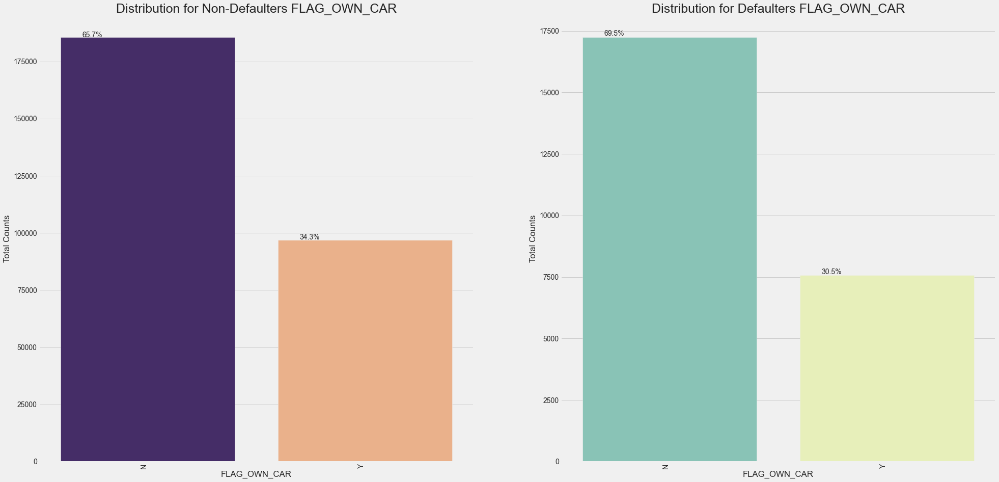

In [162]:
masterplot('FLAG_OWN_CAR')

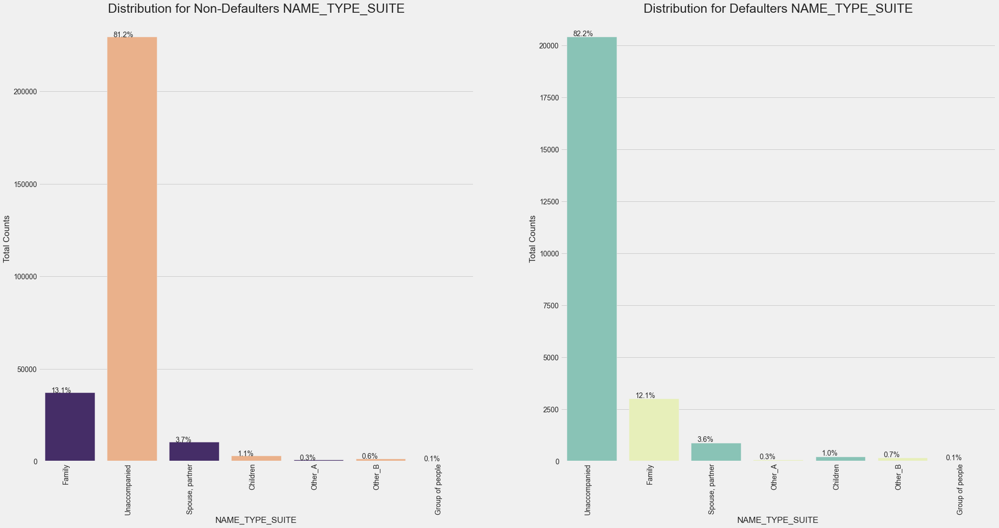

In [163]:
masterplot('NAME_TYPE_SUITE')

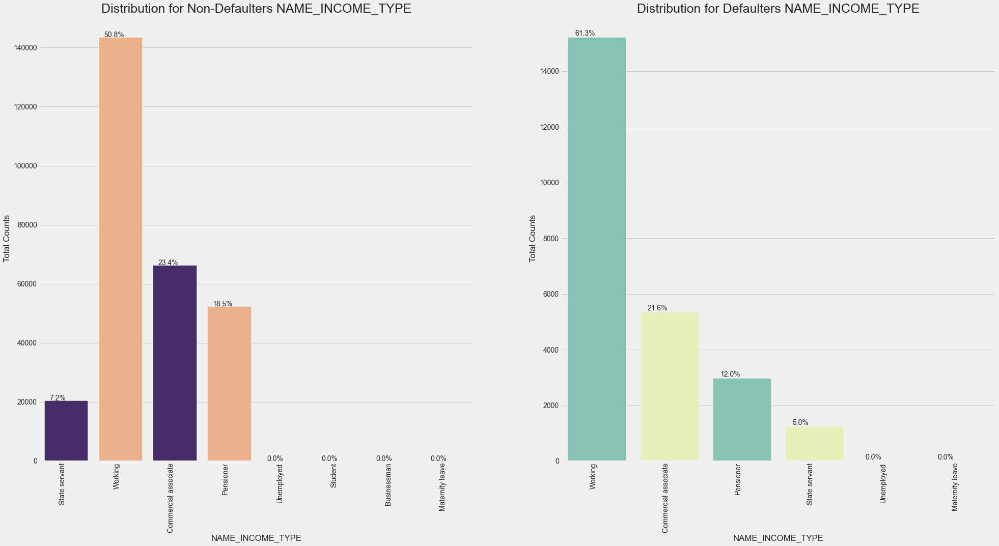

In [164]:
masterplot('NAME_INCOME_TYPE')

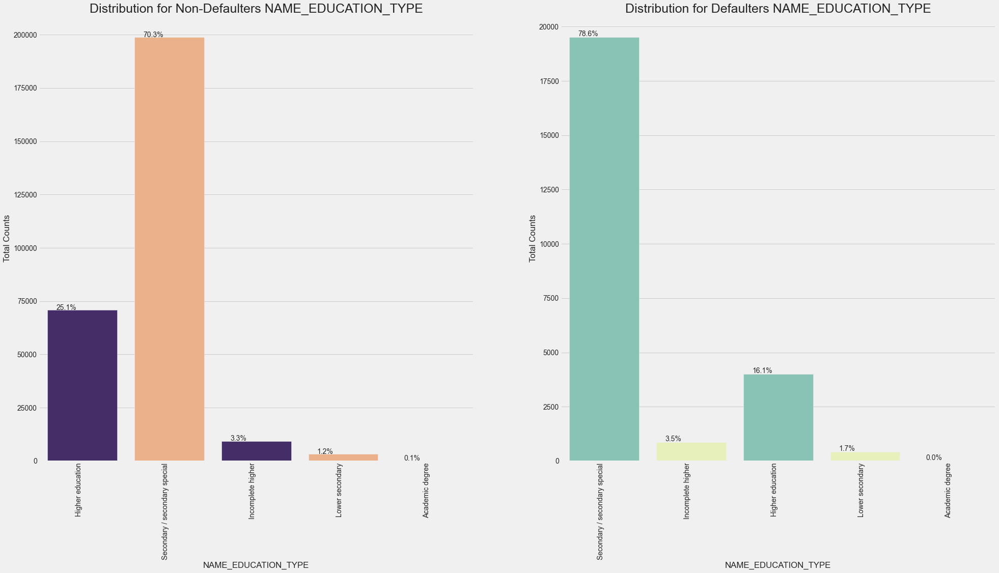

In [165]:
masterplot('NAME_EDUCATION_TYPE')

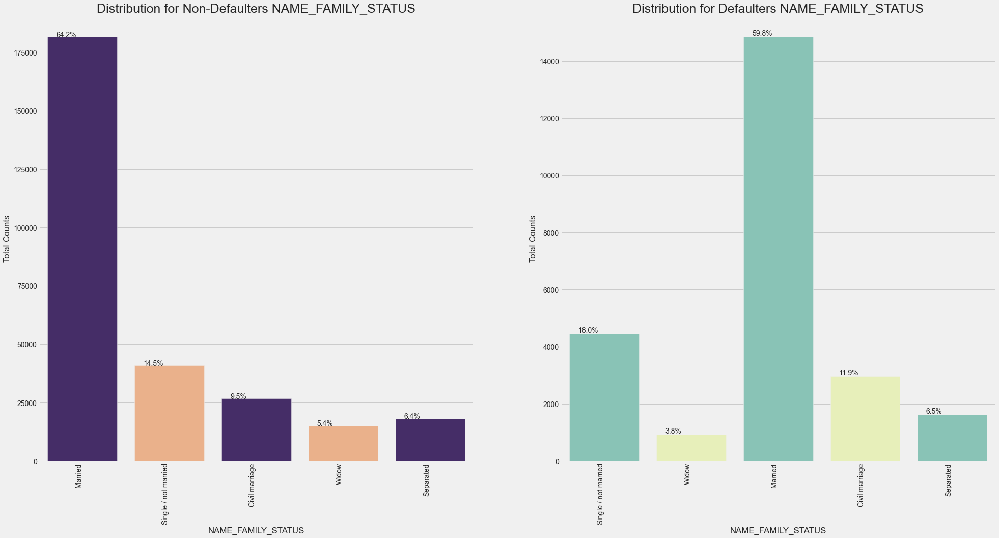

In [166]:
masterplot('NAME_FAMILY_STATUS')

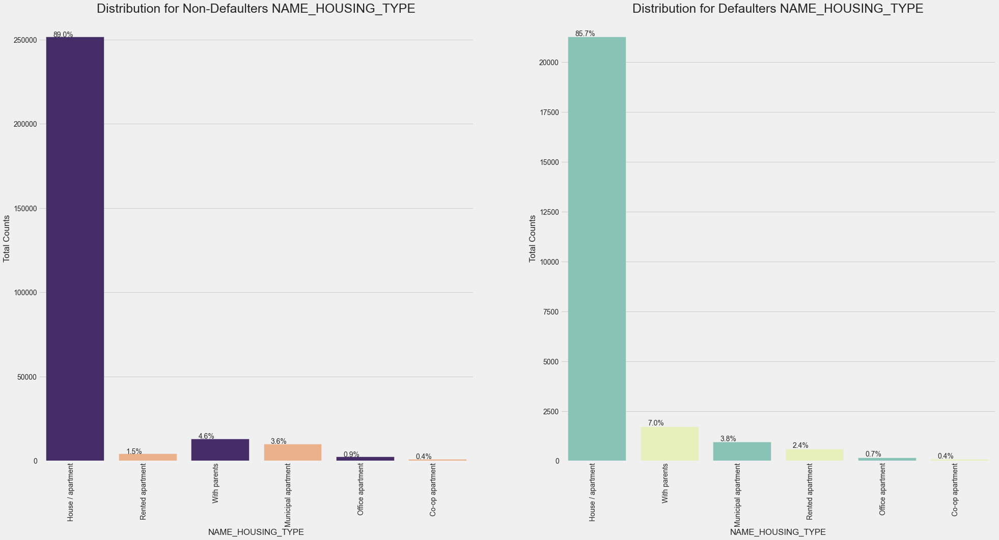

In [167]:
masterplot('NAME_HOUSING_TYPE')

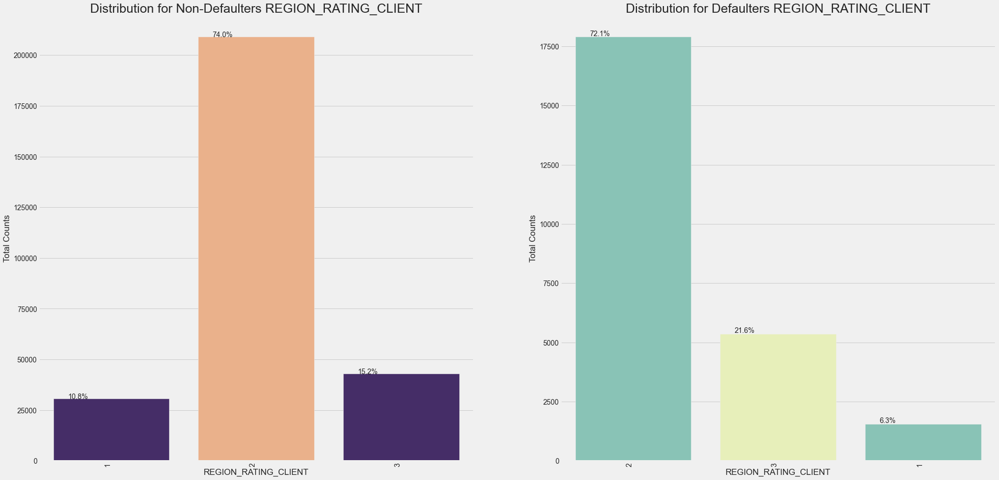

In [168]:
masterplot('REGION_RATING_CLIENT')

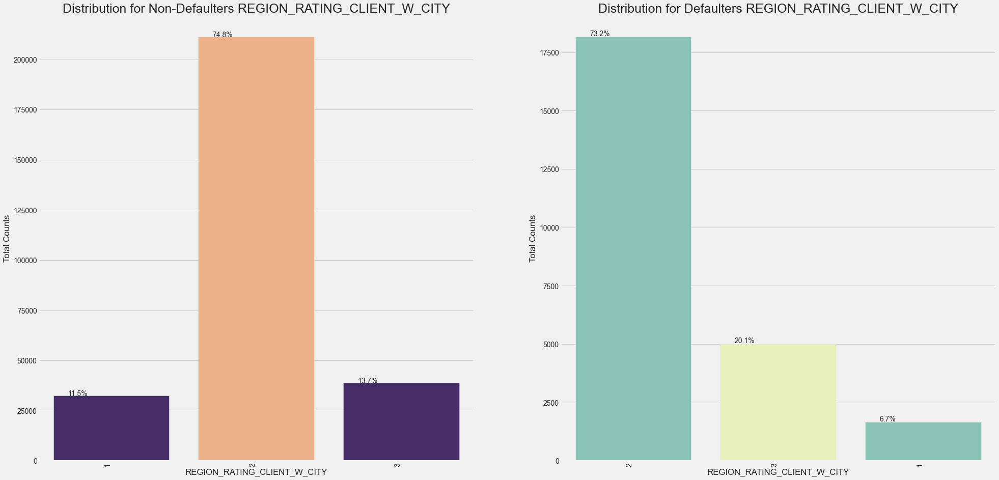

In [169]:
masterplot('REGION_RATING_CLIENT_W_CITY')

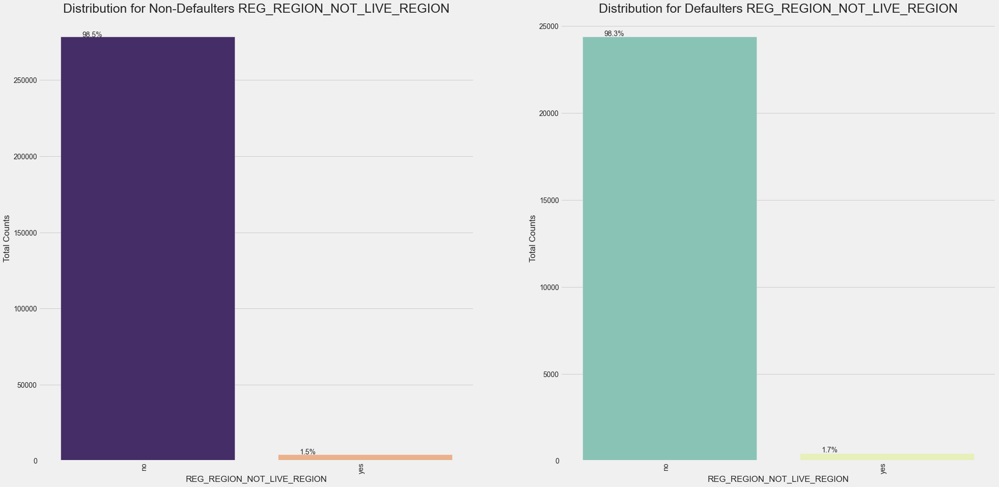

In [170]:
masterplot('REG_REGION_NOT_LIVE_REGION')

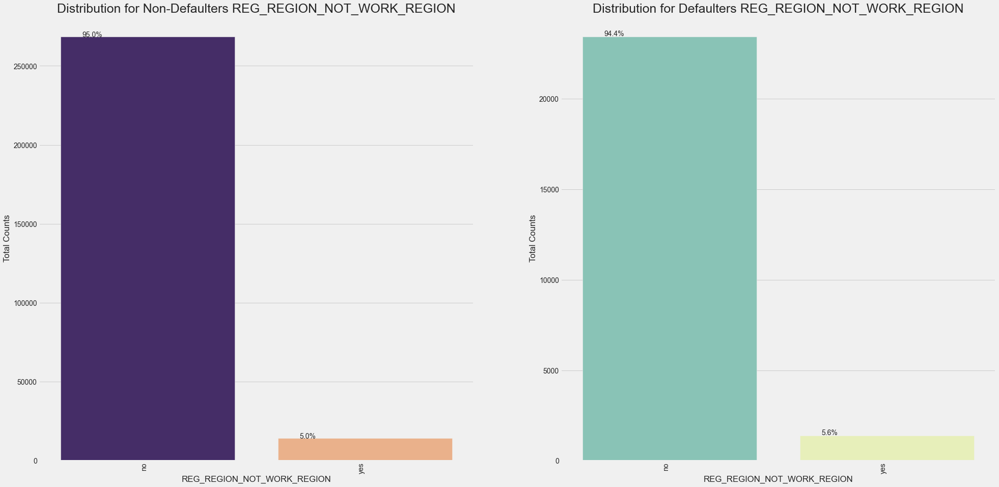

In [171]:
masterplot('REG_REGION_NOT_WORK_REGION')

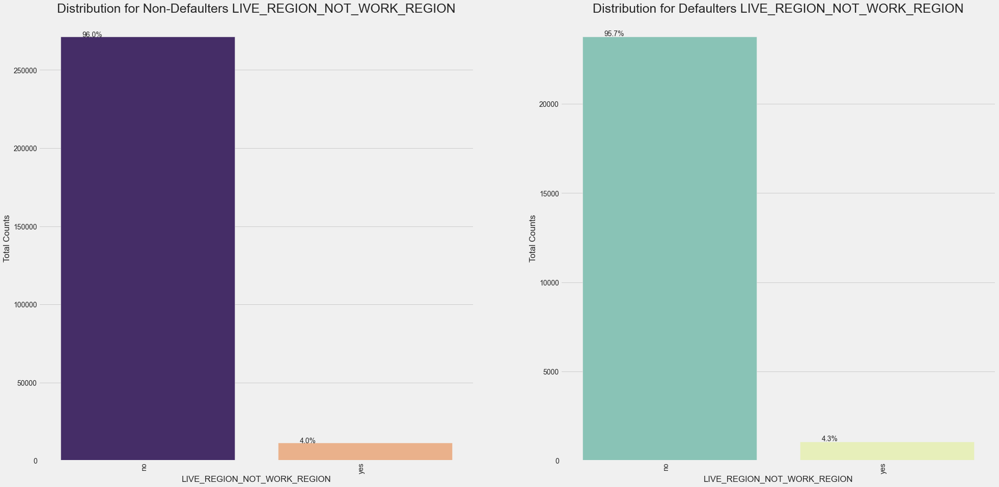

In [172]:
masterplot('LIVE_REGION_NOT_WORK_REGION')

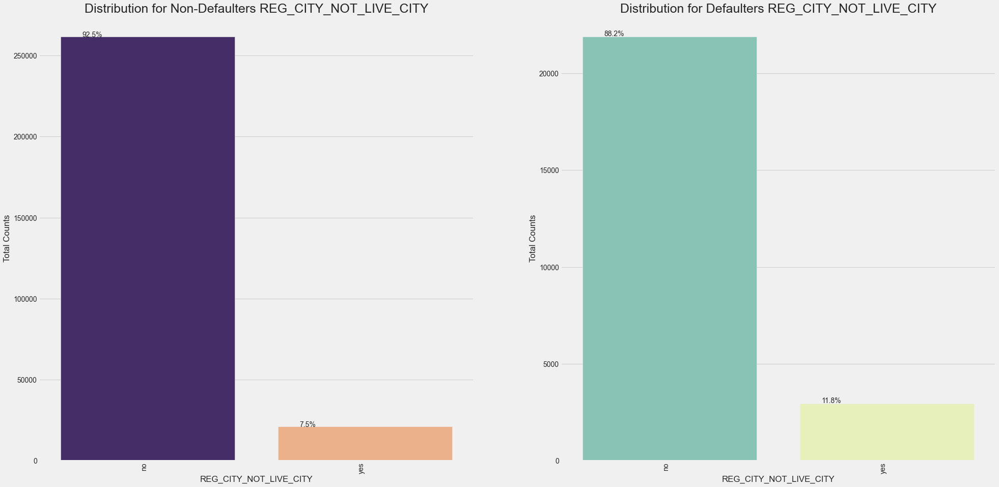

In [173]:
masterplot('REG_CITY_NOT_LIVE_CITY')

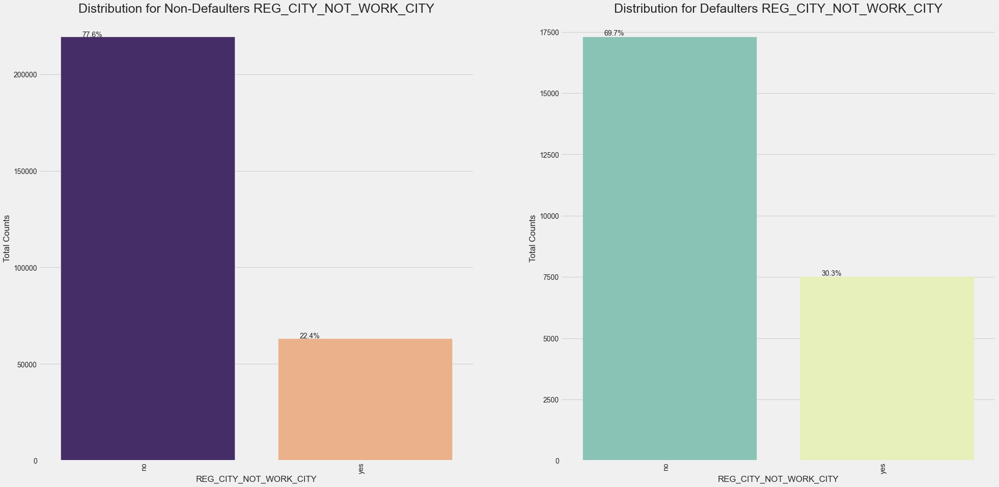

In [174]:
masterplot('REG_CITY_NOT_WORK_CITY')

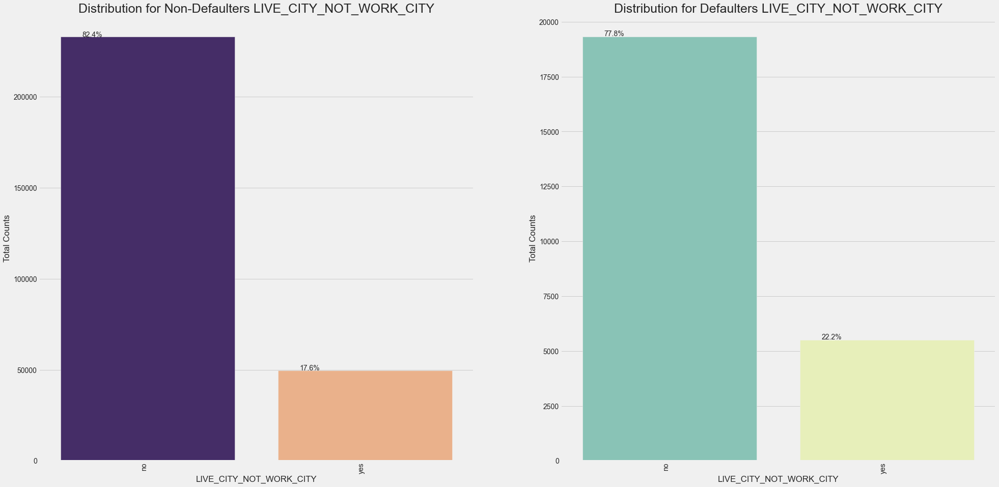

In [175]:
masterplot('LIVE_CITY_NOT_WORK_CITY')

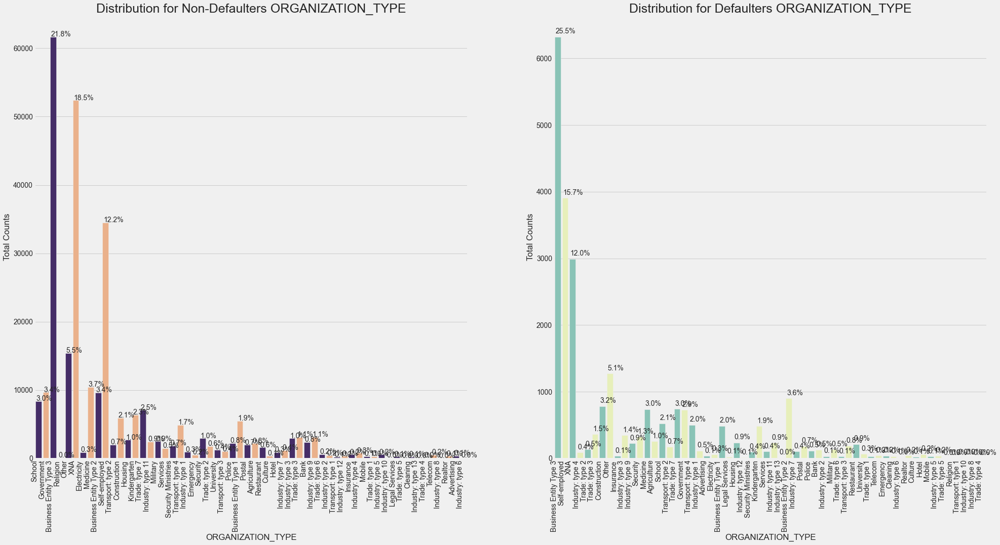

In [176]:
masterplot('ORGANIZATION_TYPE')

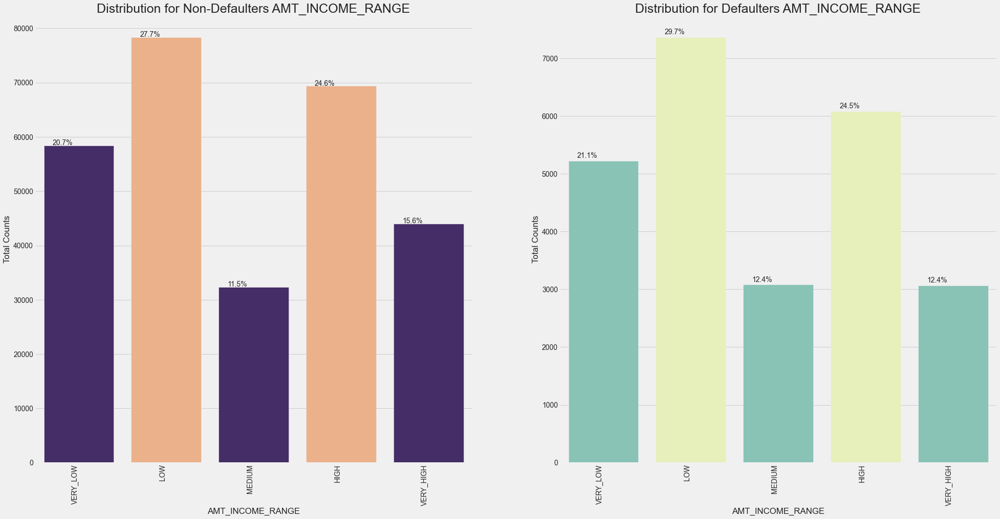

In [177]:
masterplot('AMT_INCOME_RANGE')

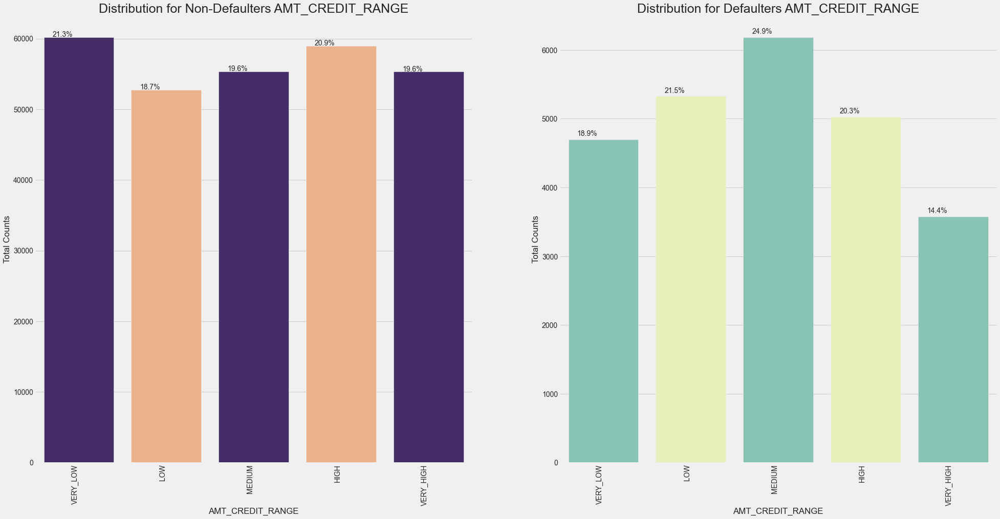

In [178]:
masterplot('AMT_CREDIT_RANGE')

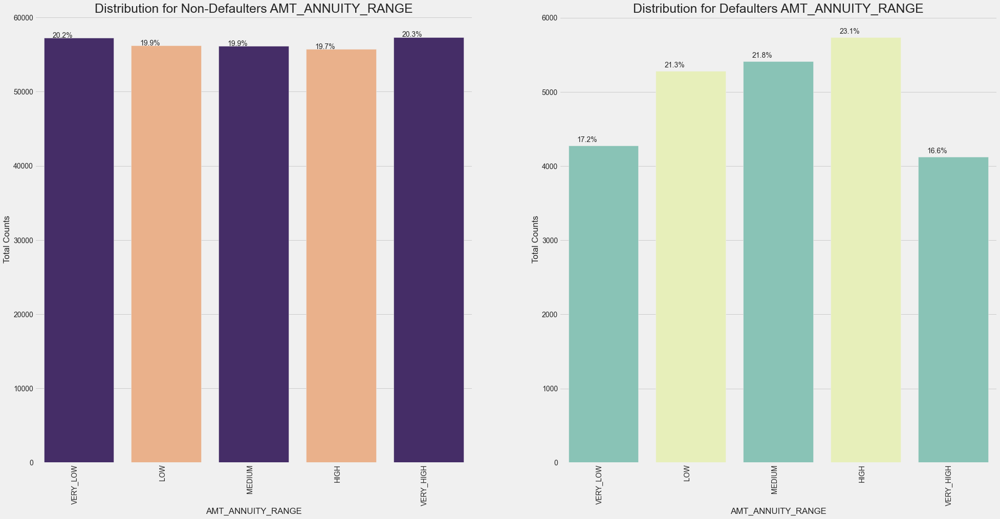

In [179]:
masterplot('AMT_ANNUITY_RANGE')

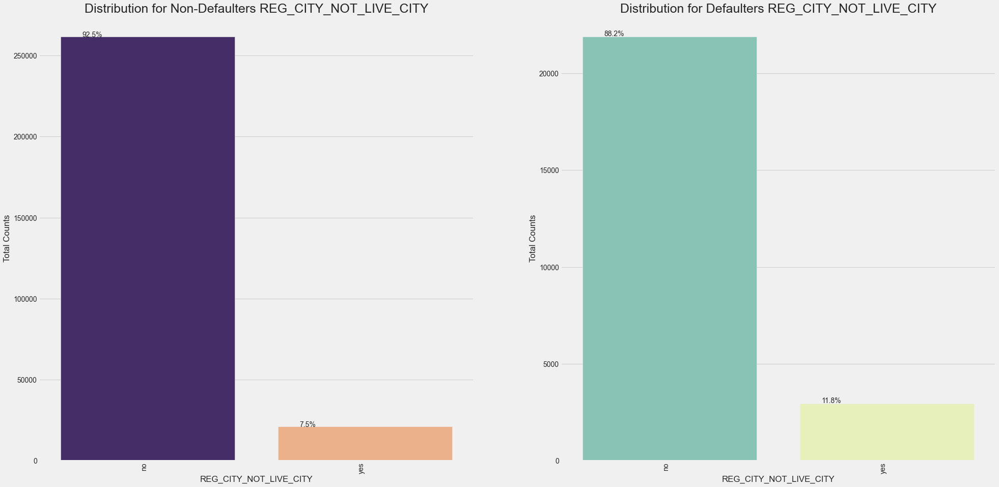

In [180]:
masterplot('REG_CITY_NOT_LIVE_CITY')

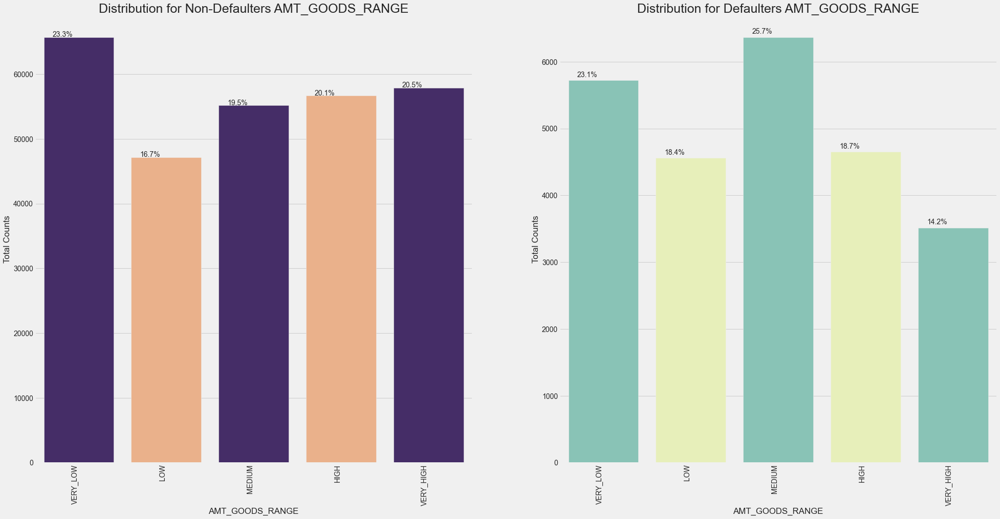

In [181]:
masterplot('AMT_GOODS_RANGE')

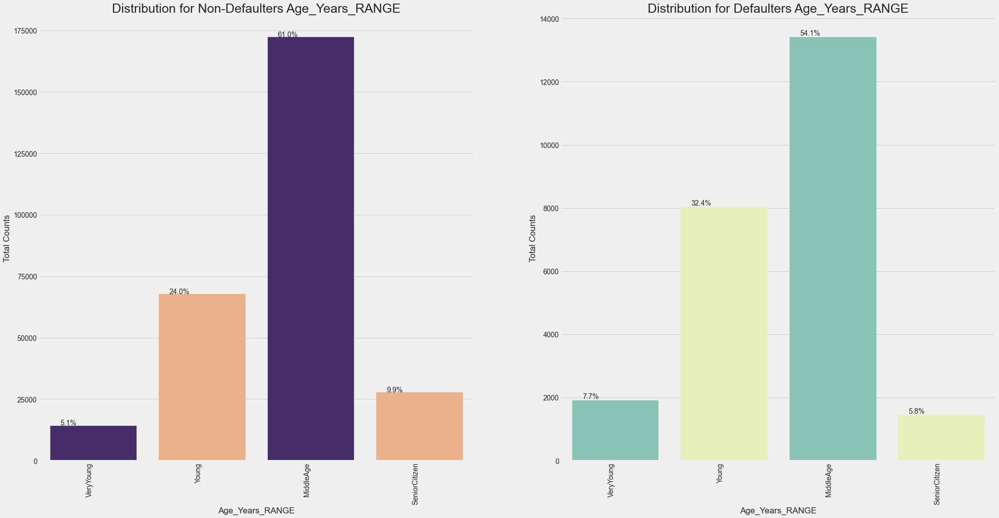

In [182]:
masterplot('Age_Years_RANGE')

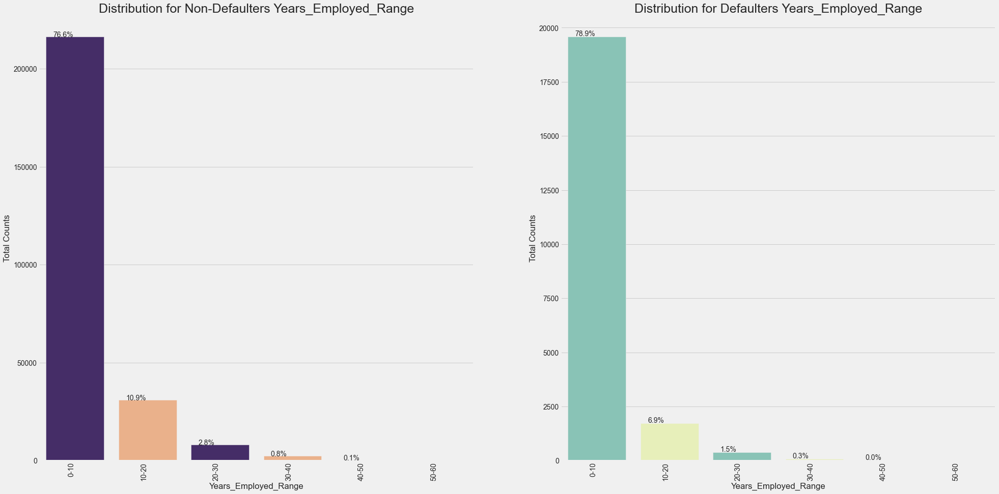

In [183]:
masterplot('Years_Employed_Range')

# 5.1 Segment univariate analysis wrt TARGET = 0 & TARGET =1 for numerical features

In [184]:
def masterploty(var):
    plt.style.use('ggplot')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(15,5))    
    sns.distplot(a=df_app_Target0[var],ax=ax1)
    ax1.set_title(f'Distribution of Non-Defaulters wrt {var}',fontsize=15) 
    plt.xticks(fontsize=15)
    sns.distplot(a=df_app_Target1[var],ax=ax2)
    ax2.set_title(f'Distribution of Defaulters wrt {var}',fontsize=15)
    plt.xticks(fontsize=15)
    plt.show()


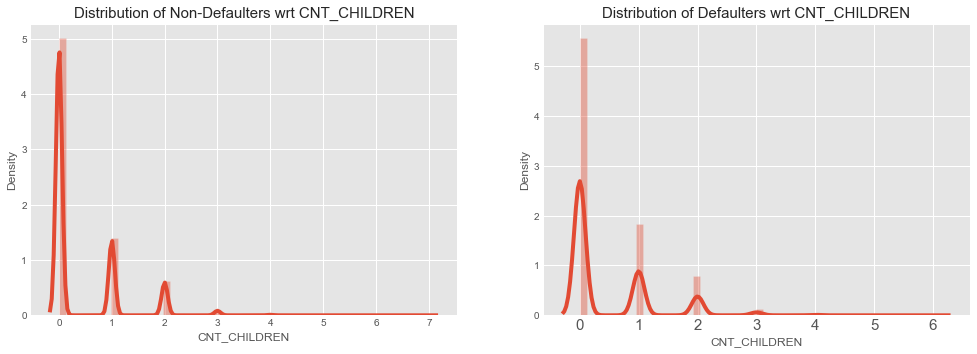

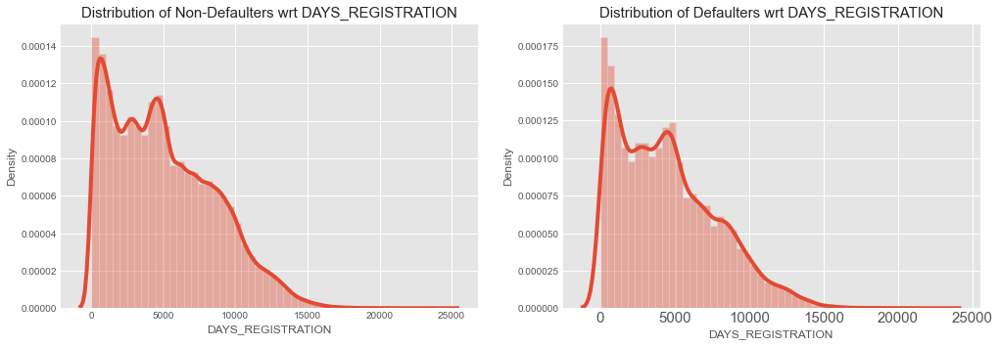

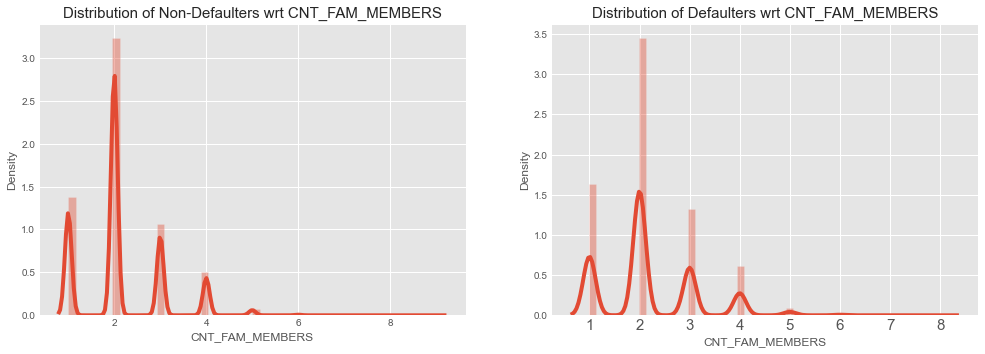

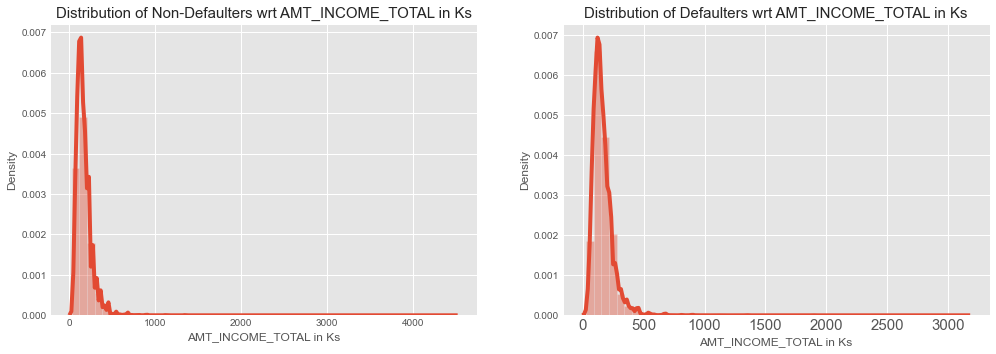

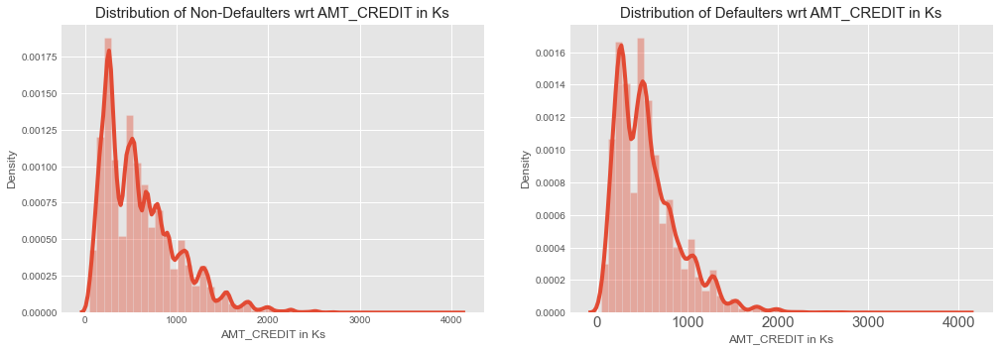

...

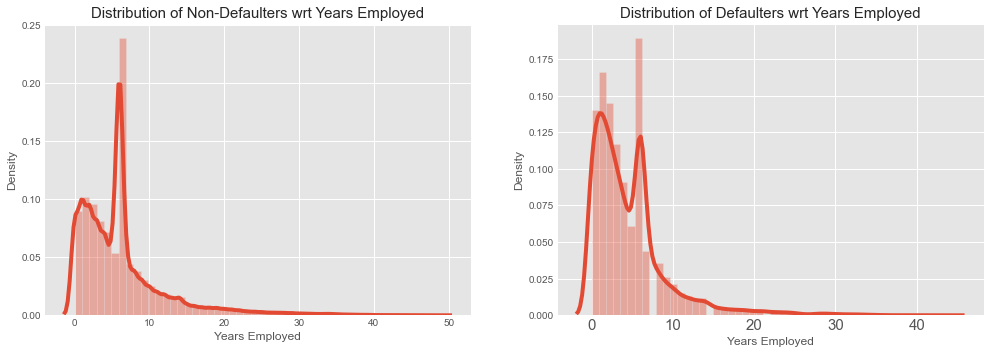

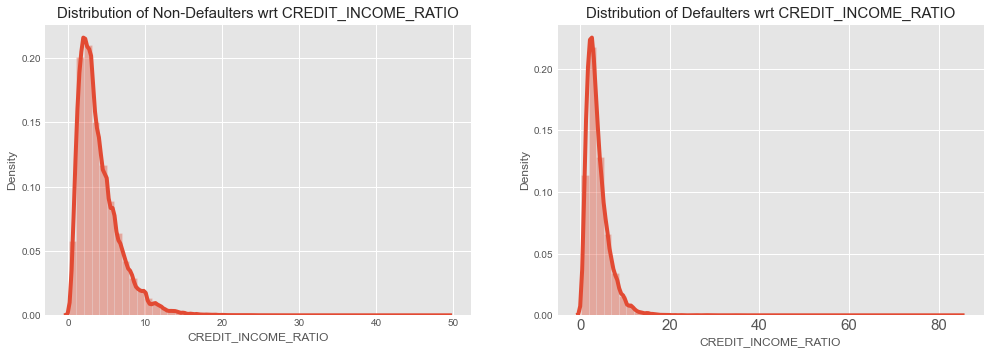

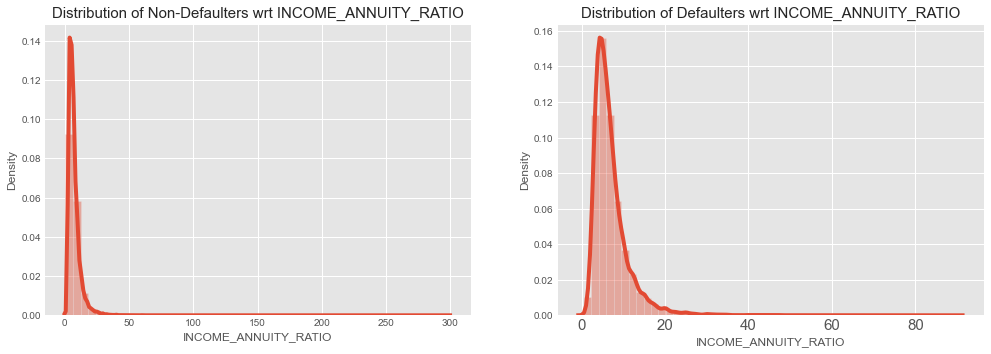

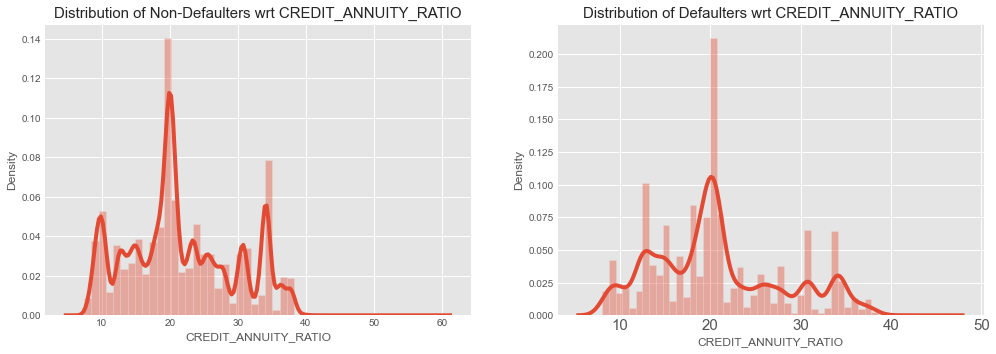

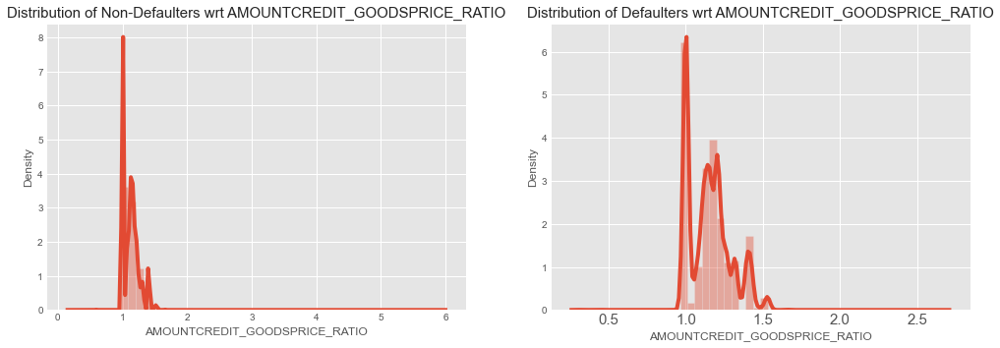

In [185]:
Numerical_columns = ['CNT_CHILDREN', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS', 'AMT_INCOME_TOTAL in Ks', 'AMT_CREDIT in Ks', 'AMT_ANNUITY in Ks', 'AMT_GOODS_PRICE in Ks', 
'REGION_POPULATION_RELATIVE in 100Ks', 'Age_Years', 'Years Employed', 'CREDIT_INCOME_RATIO',
'INCOME_ANNUITY_RATIO', 'CREDIT_ANNUITY_RATIO', 'AMOUNTCREDIT_GOODSPRICE_RATIO']
for n in Numerical_columns:
    masterploty(n)

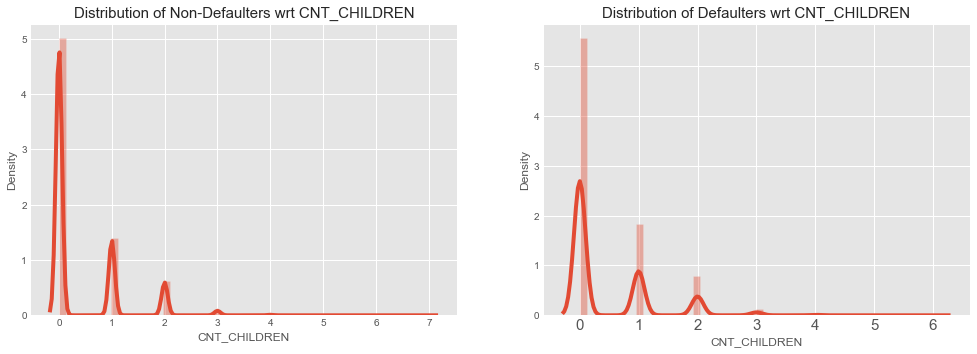

In [186]:
masterploty('CNT_CHILDREN')

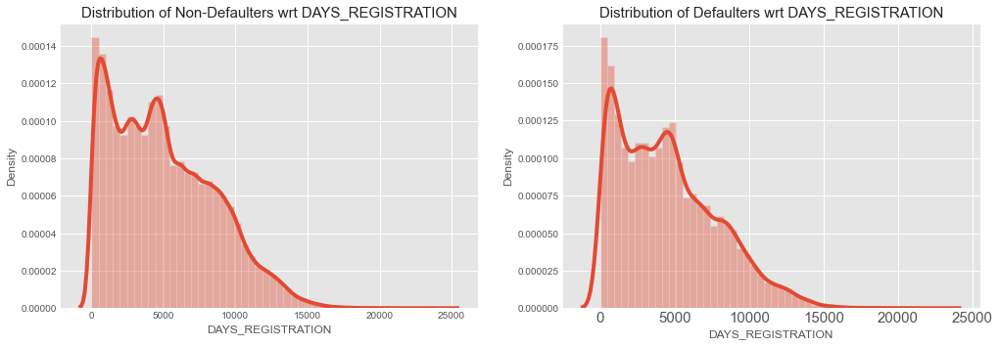

In [187]:
masterploty('DAYS_REGISTRATION')

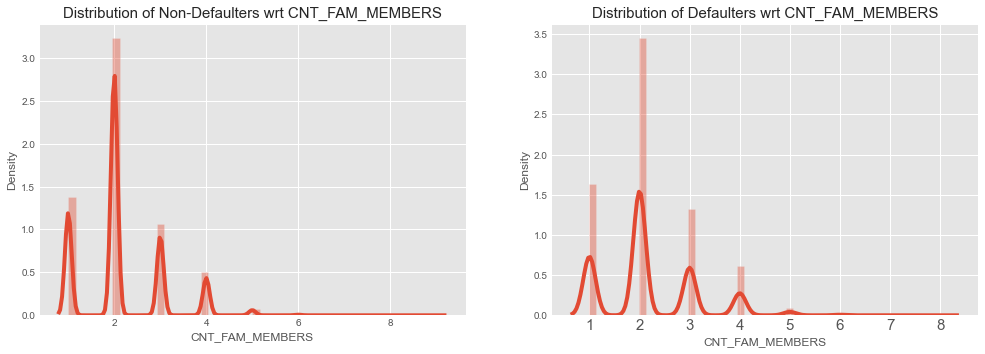

In [188]:
masterploty('CNT_FAM_MEMBERS')

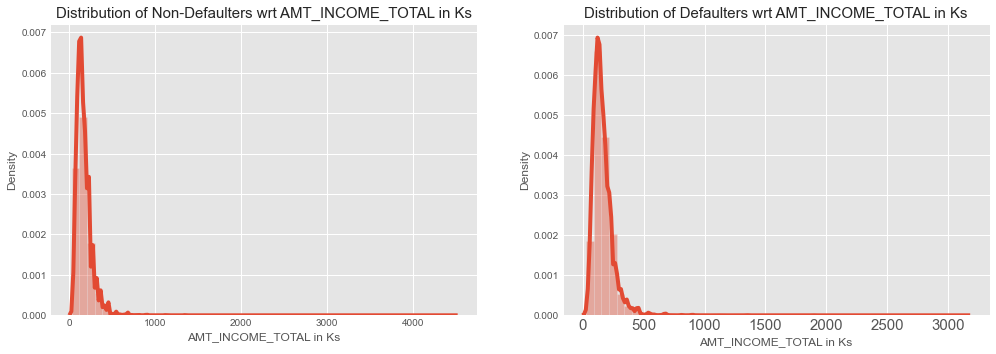

In [189]:
masterploty('AMT_INCOME_TOTAL in Ks')

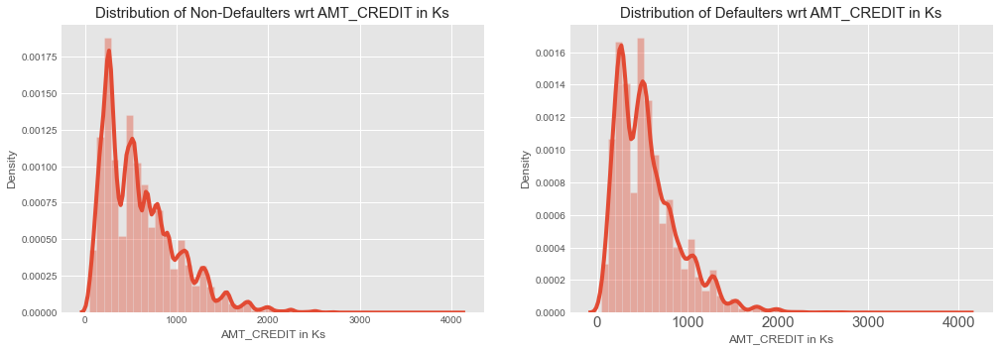

In [190]:
masterploty('AMT_CREDIT in Ks')

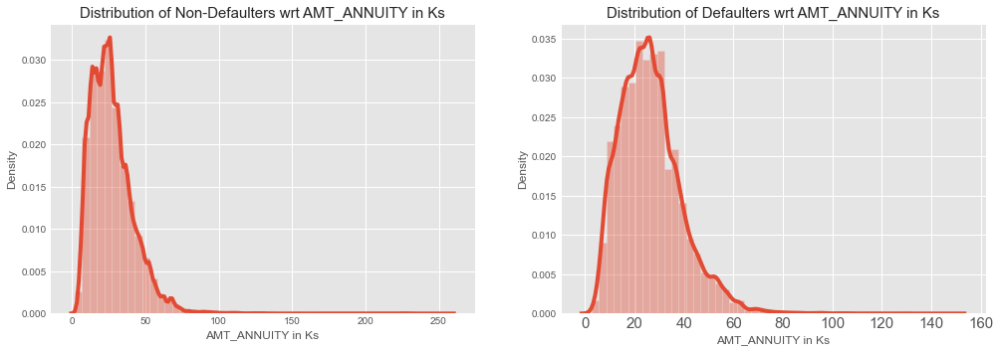

In [191]:
masterploty('AMT_ANNUITY in Ks')

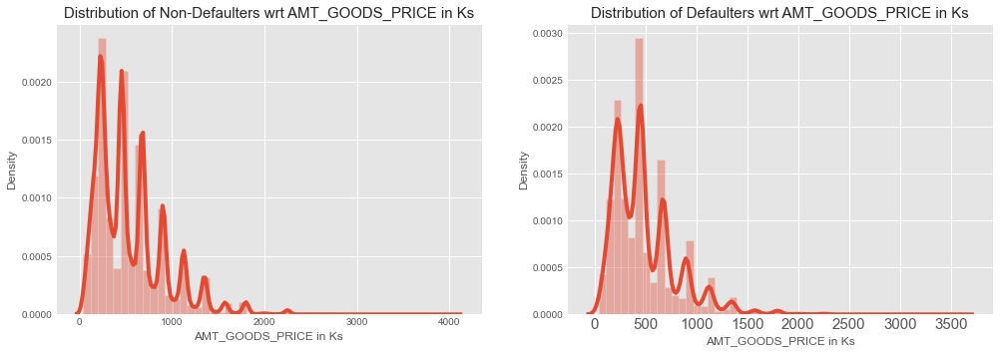

In [192]:
masterploty('AMT_GOODS_PRICE in Ks')

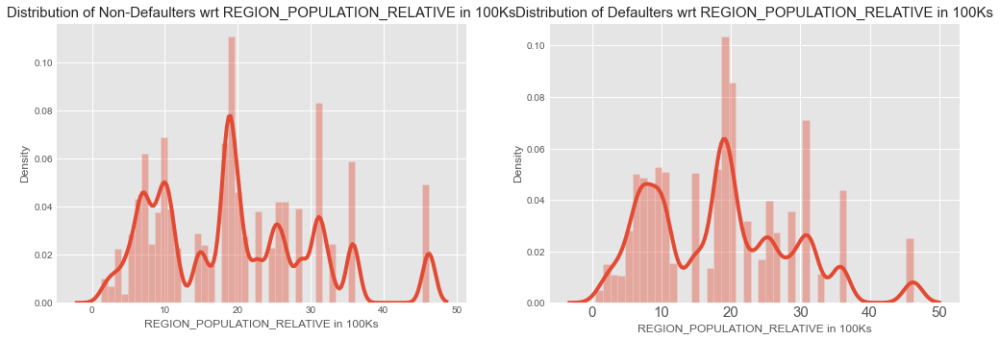

In [193]:
masterploty('REGION_POPULATION_RELATIVE in 100Ks')

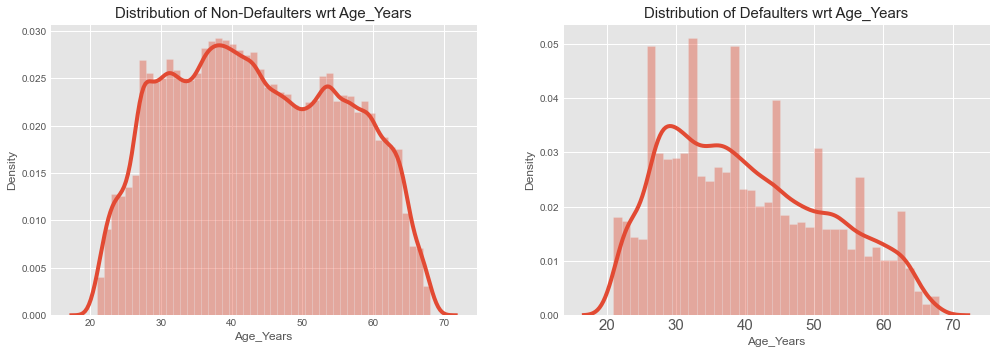

In [194]:
masterploty('Age_Years')

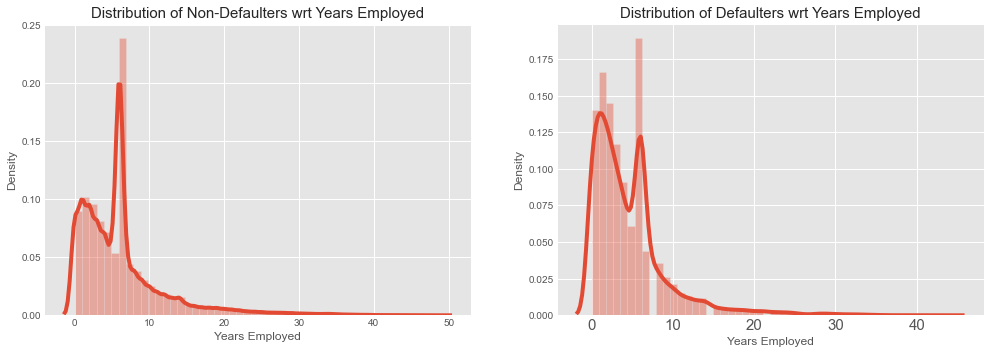

In [195]:
masterploty('Years Employed')

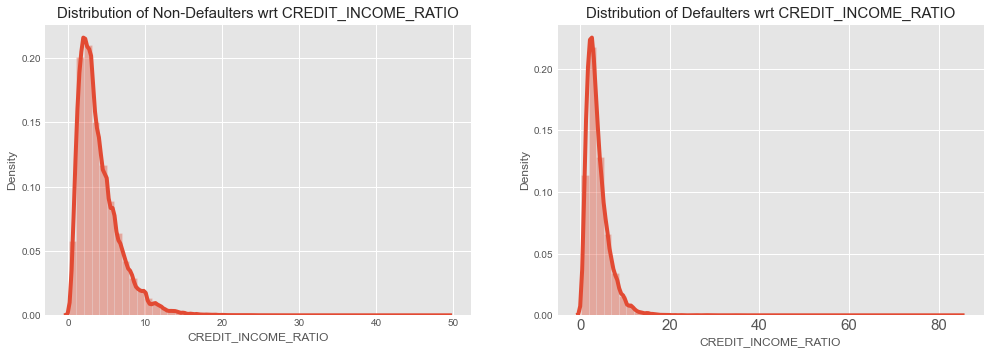

In [196]:
masterploty('CREDIT_INCOME_RATIO')

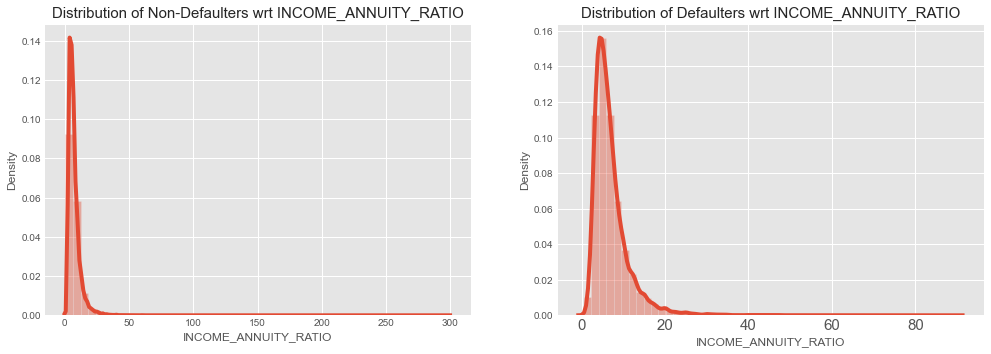

In [197]:
masterploty('INCOME_ANNUITY_RATIO')

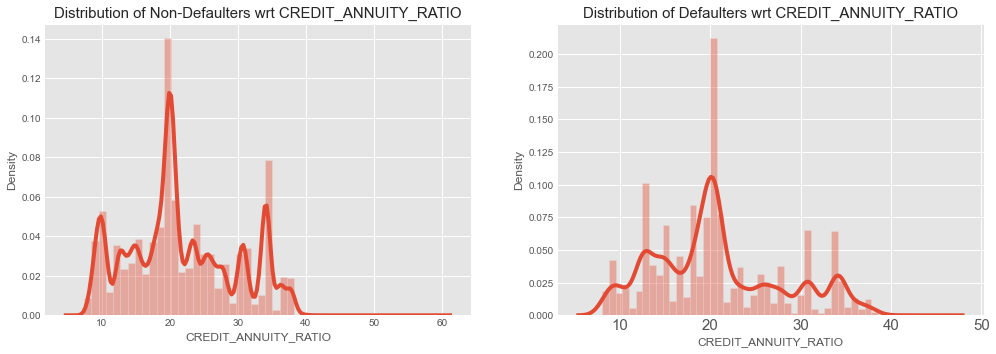

In [198]:
masterploty('CREDIT_ANNUITY_RATIO')

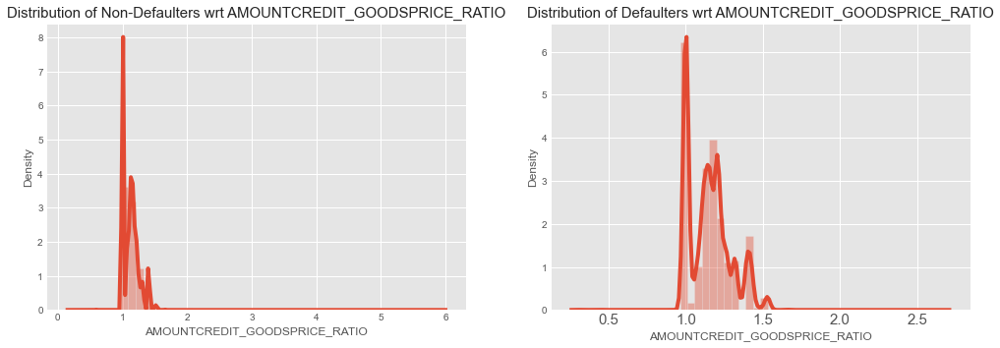

In [199]:
masterploty('AMOUNTCREDIT_GOODSPRICE_RATIO')

## Heatmap to find strong correlation betweeen numerical features

In [200]:
#finding coorelation for two datasets TARGET =0 and TARGET =1
app_t0_corr=df_app_Target0.iloc[0:,2:]
app_t1_corr=df_app_Target1.iloc[0:,2:]

t0=app_t0_corr.corr(method='pearson')
t1=app_t1_corr.corr(method='pearson')

In [201]:
t0

,CNT_CHILDREN,DAYS_REGISTRATION,CNT_FAM_MEMBERS,AMT_INCOME_TOTAL in Ks,AMT_CREDIT in Ks,AMT_ANNUITY in Ks,AMT_GOODS_PRICE in Ks,REGION_POPULATION_RELATIVE in 100Ks,Age_Years,Years Employed,CREDIT_INCOME_RATIO,INCOME_ANNUITY_RATIO,CREDIT_ANNUITY_RATIO,AMOUNTCREDIT_GOODSPRICE_RATIO
CNT_CHILDREN,1.000000,-0.186974,0.877632,0.029851,0.003347,0.021207,-0.000321,-0.019287,-0.338708,-0.057368,-0.017930,0.010777,-0.025311,0.019075
DAYS_REGISTRATION,-0.186974,1.000000,-0.176322,-0.071559,-0.013494,-0.039454,-0.015908,0.028359,0.333017,0.140675,0.044451,-0.034764,0.028107,0.014831
CNT_FAM_MEMBERS,0.877632,-0.176322,1.000000,0.037017,0.064978,0.076210,0.063193,-0.011682,-0.286666,-0.026496,0.048053,-0.028056,0.008204,0.004510
AMT_INCOME_TOTAL in Ks,0.029851,-0.071559,0.037017,1.000000,0.376511,0.454599,0.383562,0.079153,-0.068864,0.032130,-0.247920,0.401828,0.085226,-0.049946
AMT_CREDIT in Ks,0.003347,-0.013494,0.064978,0.376511,1.000000,0.771357,0.987021,0.050415,0.047348,0.080560,0.652198,-0.350686,0.658423,0.022926
AMT_ANNUITY in Ks,0.021207,-0.039454,0.076210,0.454599,0.771357,1.000000,0.776476,0.056367,-0.012261,0.048770,0.394361,-0.428103,0.117632,-0.057949
AMT_GOODS_PRICE in Ks,-0.000321,-0.015908,0.063193,0.383562,0.987021,0.776476,1.000000,0.056288,0.044620,0.081592,0.632141,-0.340862,0.631400,-0.110235
REGION_POPULATION_RELATIVE in 100Ks,-0.019287,0.028359,-0.011682,0.079153,0.050415,0.056367,0.056288,1.000000,0.023057,-0.001375,-0.010815,0.020806,0.016362,-0.049092
Age_Years,-0.338708,0.333017,-0.286666,-0.068864,0.047348,-0.012261,0.044620,0.023057,1.000000,0.259185,0.118503,-0.073258,0.097709,0.020228
Years Employed,-0.057368,0.140675,-0.026496,0.032130,0.080560,0.048770,0.081592,-0.001375,0.259185,1.000000,0.059123,-0.017057,0.076284,-0.006263


In [202]:
t1

,CNT_CHILDREN,DAYS_REGISTRATION,CNT_FAM_MEMBERS,AMT_INCOME_TOTAL in Ks,AMT_CREDIT in Ks,AMT_ANNUITY in Ks,AMT_GOODS_PRICE in Ks,REGION_POPULATION_RELATIVE in 100Ks,Age_Years,Years Employed,CREDIT_INCOME_RATIO,INCOME_ANNUITY_RATIO,CREDIT_ANNUITY_RATIO,AMOUNTCREDIT_GOODSPRICE_RATIO
CNT_CHILDREN,1.000000,-0.149827,0.884181,0.001179,-0.002493,0.030980,-0.008870,-0.021701,-0.261460,-0.051927,0.003806,-0.026456,-0.043280,0.031732
DAYS_REGISTRATION,-0.149827,1.000000,-0.146155,-0.038488,0.025874,-0.034262,0.025669,0.029953,0.289112,0.140764,0.058096,0.001039,0.091194,-0.001093
CNT_FAM_MEMBERS,0.884181,-0.146155,1.000000,0.009215,0.050876,0.075706,0.047081,-0.015895,-0.204496,-0.017930,0.056620,-0.054215,-0.010762,0.017386
AMT_INCOME_TOTAL in Ks,0.001179,-0.038488,0.009215,1.000000,0.325338,0.398252,0.327407,0.062066,0.002477,0.016392,-0.295375,0.448951,0.064191,-0.032997
AMT_CREDIT in Ks,-0.002493,0.025874,0.050876,0.325338,1.000000,0.752184,0.982785,0.040810,0.135059,0.099166,0.643808,-0.350540,0.668855,0.033584
AMT_ANNUITY in Ks,0.030980,-0.034262,0.075706,0.398252,0.752184,1.000000,0.752292,0.035802,0.014024,0.036986,0.383415,-0.456688,0.087993,-0.043179
AMT_GOODS_PRICE in Ks,-0.008870,0.025669,0.047081,0.327407,0.982785,0.752292,1.000000,0.049510,0.135501,0.104712,0.627320,-0.339310,0.640631,-0.124448
REGION_POPULATION_RELATIVE in 100Ks,-0.021701,0.029953,-0.015895,0.062066,0.040810,0.035802,0.049510,1.000000,0.039926,0.012198,-0.005230,0.016523,0.031705,-0.057270
Age_Years,-0.261460,0.289112,-0.204496,0.002477,0.135059,0.014024,0.135501,0.039926,1.000000,0.301075,0.158970,-0.018143,0.215578,0.011599
Years Employed,-0.051927,0.140764,-0.017930,0.016392,0.099166,0.036986,0.104712,0.012198,0.301075,1.000000,0.096126,-0.015730,0.124369,-0.017912


In [203]:
def hmap(data,title):
    plt.figure(figsize=(25, 15))
    plt.rcParams['axes.titlesize'] = 20
    plt.rcParams['axes.titlepad'] = 75
    sns.heatmap(data, cmap="Greys",annot=False)
    plt.title(title)
    plt.yticks(rotation=0)
    plt.show()

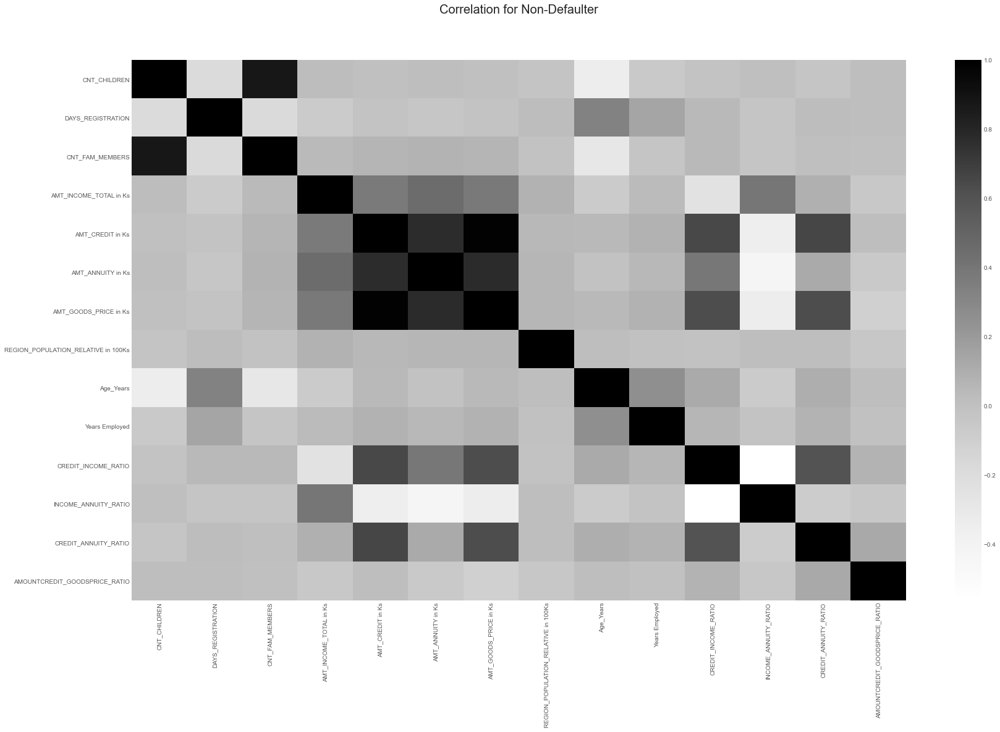

In [204]:
hmap(data=t0,title='Correlation for Non-Defaulter')

Heatmap for numerical features of a Non-Defaulter

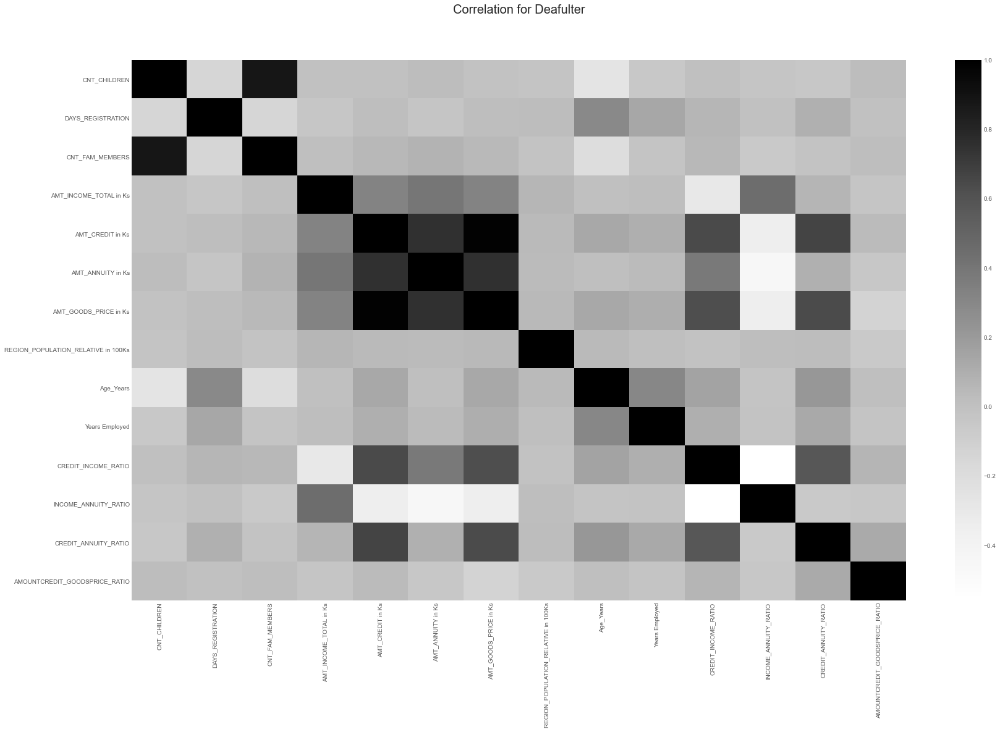

In [205]:
hmap(data=t1,title='Correlation for Deafulter')

Heatmap for numerical features of a Defaulter

## Top Correlation between numerical features of Defaulters and non-Defaulters 

In [206]:
corr_0 = df_app_Target0.corr().abs().unstack().sort_values(kind='quicksort',ascending=False)
corr_0 = corr_0[corr_0 != 1.0]
corr_0.head(50)

AMT_CREDIT in Ks        AMT_GOODS_PRICE in Ks     0.987021
AMT_GOODS_PRICE in Ks   AMT_CREDIT in Ks          0.987021
CNT_FAM_MEMBERS         CNT_CHILDREN              0.877632
CNT_CHILDREN            CNT_FAM_MEMBERS           0.877632
AMT_ANNUITY in Ks       AMT_GOODS_PRICE in Ks     0.776476
AMT_GOODS_PRICE in Ks   AMT_ANNUITY in Ks         0.776476
AMT_ANNUITY in Ks       AMT_CREDIT in Ks          0.771357
AMT_CREDIT in Ks        AMT_ANNUITY in Ks         0.771357
                        CREDIT_ANNUITY_RATIO      0.658423
CREDIT_ANNUITY_RATIO    AMT_CREDIT in Ks          0.658423
AMT_CREDIT in Ks        CREDIT_INCOME_RATIO       0.652198
CREDIT_INCOME_RATIO     AMT_CREDIT in Ks          0.652198
AMT_GOODS_PRICE in Ks   CREDIT_INCOME_RATIO       0.632141
CREDIT_INCOME_RATIO     AMT_GOODS_PRICE in Ks     0.632141
AMT_GOODS_PRICE in Ks   CREDIT_ANNUITY_RATIO      0.631400
CREDIT_ANNUITY_RATIO    AMT_GOODS_PRICE in Ks     0.631400
CREDIT_INCOME_RATIO     CREDIT_ANNUITY_RATIO      0.6012

In [207]:
corr_1 = df_app_Target1.corr().abs().unstack().sort_values(kind='quicksort',ascending=False)
corr_1 = corr_1[corr_1 != 1.0]
corr_1.head(50)

AMT_CREDIT in Ks        AMT_GOODS_PRICE in Ks     0.982785
AMT_GOODS_PRICE in Ks   AMT_CREDIT in Ks          0.982785
CNT_FAM_MEMBERS         CNT_CHILDREN              0.884181
CNT_CHILDREN            CNT_FAM_MEMBERS           0.884181
AMT_ANNUITY in Ks       AMT_GOODS_PRICE in Ks     0.752292
AMT_GOODS_PRICE in Ks   AMT_ANNUITY in Ks         0.752292
AMT_ANNUITY in Ks       AMT_CREDIT in Ks          0.752184
AMT_CREDIT in Ks        AMT_ANNUITY in Ks         0.752184
CREDIT_ANNUITY_RATIO    AMT_CREDIT in Ks          0.668855
AMT_CREDIT in Ks        CREDIT_ANNUITY_RATIO      0.668855
CREDIT_INCOME_RATIO     AMT_CREDIT in Ks          0.643808
AMT_CREDIT in Ks        CREDIT_INCOME_RATIO       0.643808
CREDIT_ANNUITY_RATIO    AMT_GOODS_PRICE in Ks     0.640631
AMT_GOODS_PRICE in Ks   CREDIT_ANNUITY_RATIO      0.640631
                        CREDIT_INCOME_RATIO       0.627320
CREDIT_INCOME_RATIO     AMT_GOODS_PRICE in Ks     0.627320
CREDIT_ANNUITY_RATIO    CREDIT_INCOME_RATIO       0.5749

### Multivariate Analysis as per the strong correlation we found above

#### Bivariate Analysis for defaulters

In [208]:
def multivar(var1,var2):
    plt.style.use('dark_background')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(20,6))   
    sns.scatterplot(x=var1, y=var2,data=df_app_Target0,ax=ax1)
    ax1.set_xlabel(var1)    
    ax1.set_ylabel(var2)
    ax1.set_title(f'{var1} vs {var2} for Non-Defaulters',fontsize=15)    
    sns.scatterplot(x=var1, y=var2,data=df_app_Target1,ax=ax2)
    ax2.set_xlabel(var1)    
    ax2.set_ylabel(var2)
    ax2.set_title(f'{var1} vs {var2} for Defaulters',fontsize=15)            
    plt.show()


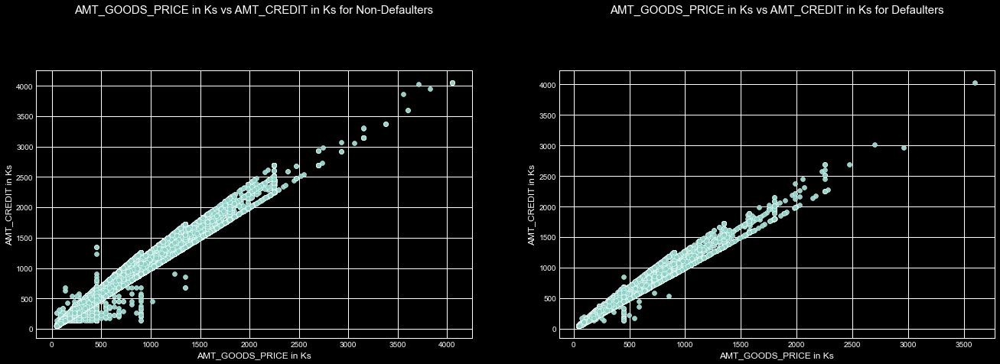

In [209]:
multivar('AMT_GOODS_PRICE in Ks','AMT_CREDIT in Ks')

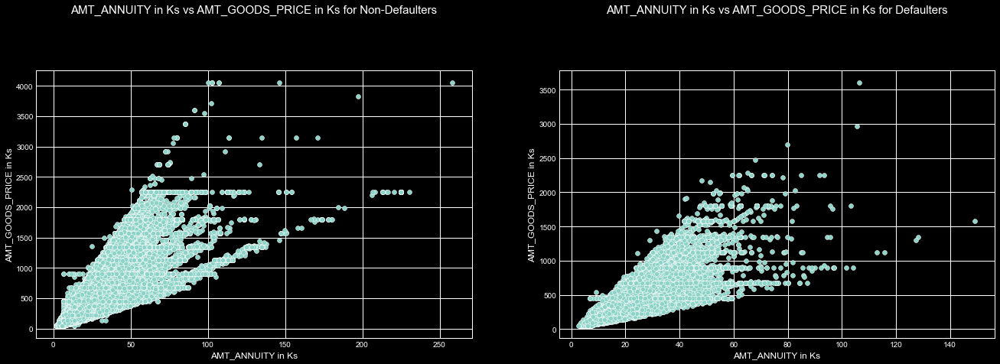

In [210]:
multivar('AMT_ANNUITY in Ks','AMT_GOODS_PRICE in Ks')

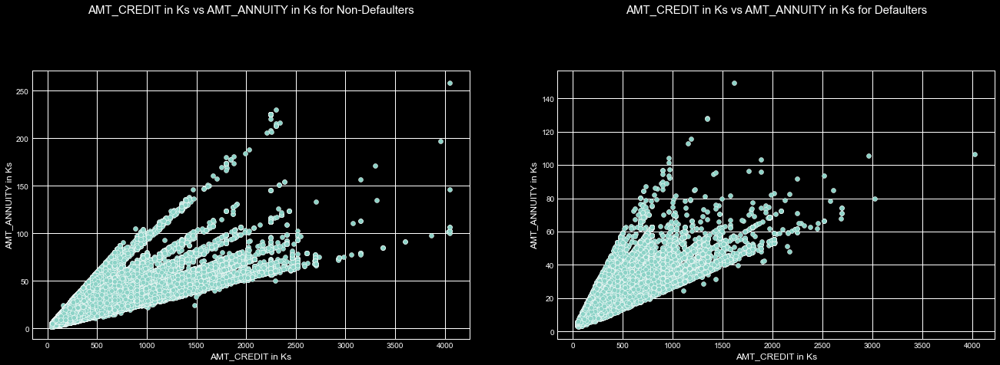

In [211]:
multivar('AMT_CREDIT in Ks','AMT_ANNUITY in Ks')

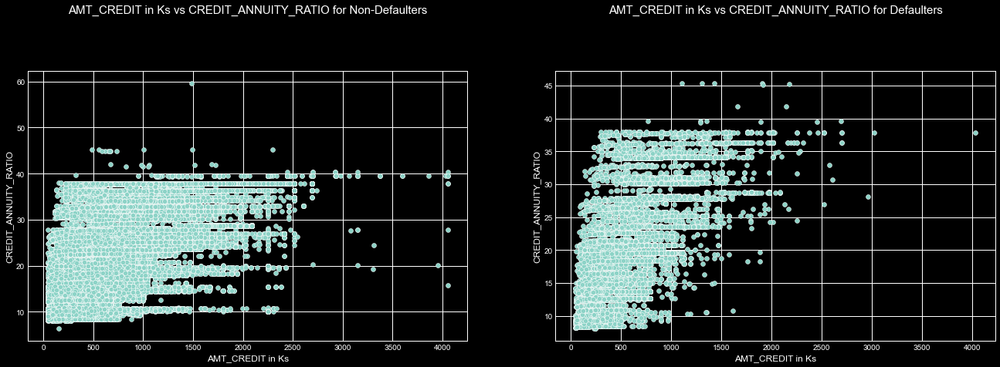

In [212]:
multivar('AMT_CREDIT in Ks','CREDIT_ANNUITY_RATIO')

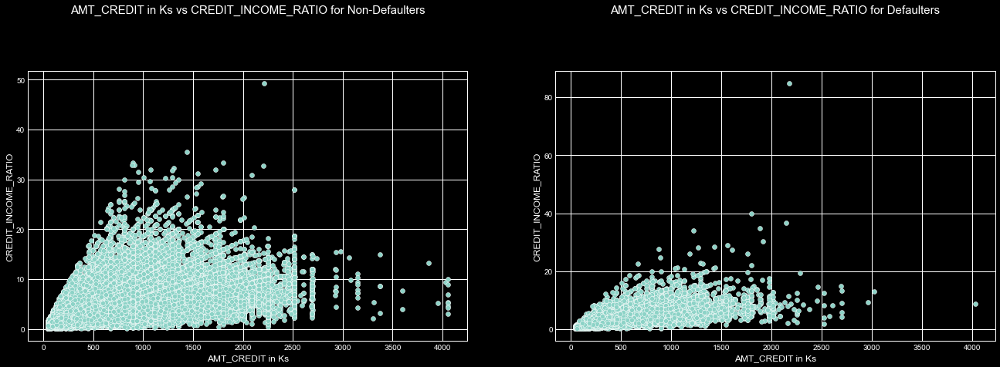

In [213]:
multivar('AMT_CREDIT in Ks','CREDIT_INCOME_RATIO')

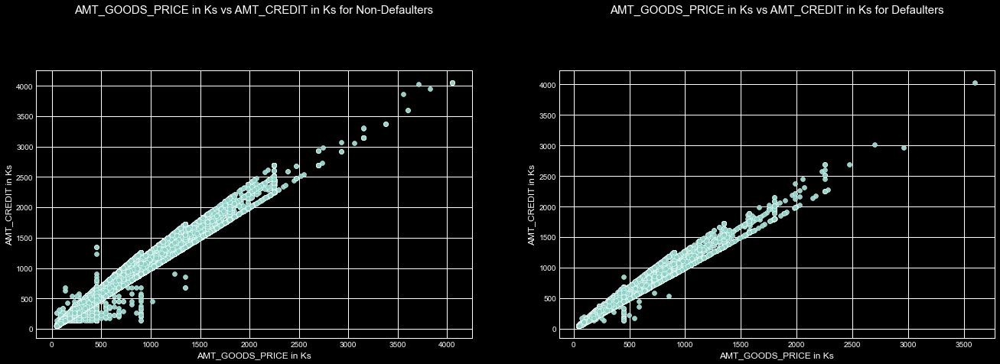

In [214]:
multivar('AMT_GOODS_PRICE in Ks','AMT_CREDIT in Ks')

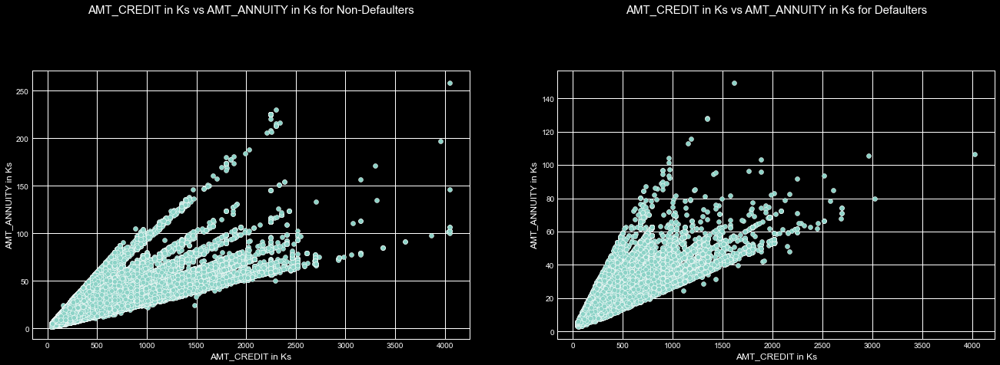

In [215]:
multivar('AMT_CREDIT in Ks','AMT_ANNUITY in Ks')

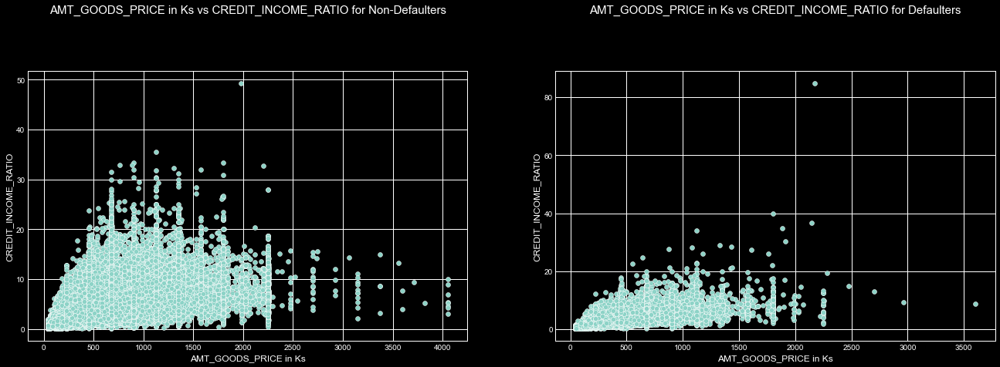

In [216]:
multivar('AMT_GOODS_PRICE in Ks','CREDIT_INCOME_RATIO')

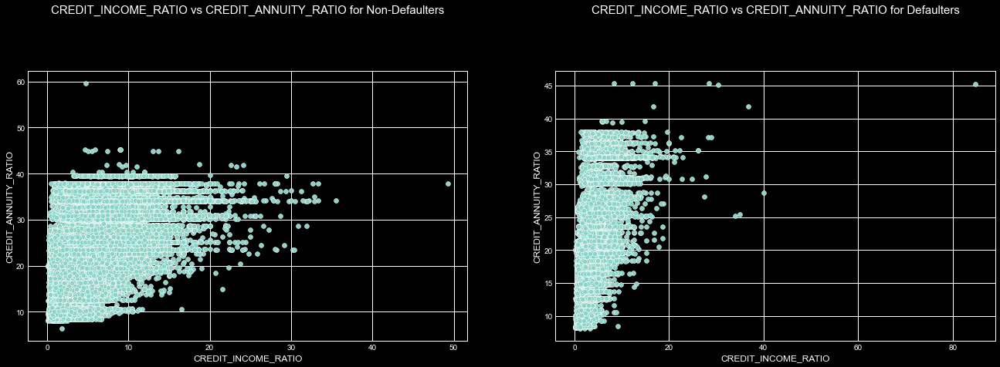

In [217]:
multivar('CREDIT_INCOME_RATIO','CREDIT_ANNUITY_RATIO')

### Multivariate Analysis

### Multivariate analysis wrt entire dataset 

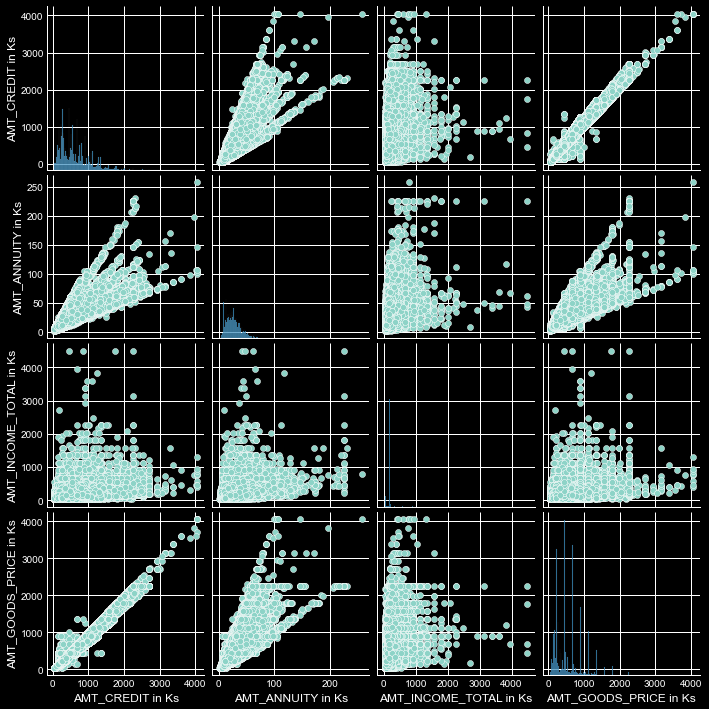

In [218]:
bv_plot = df_app[['AMT_CREDIT in Ks', 'AMT_ANNUITY in Ks', 'AMT_INCOME_TOTAL in Ks', 'AMT_GOODS_PRICE in Ks']].fillna(0)
sns.pairplot(bv_plot,palette=["v","y"])
plt.show()

### Multivariate analysis wrt Target 1

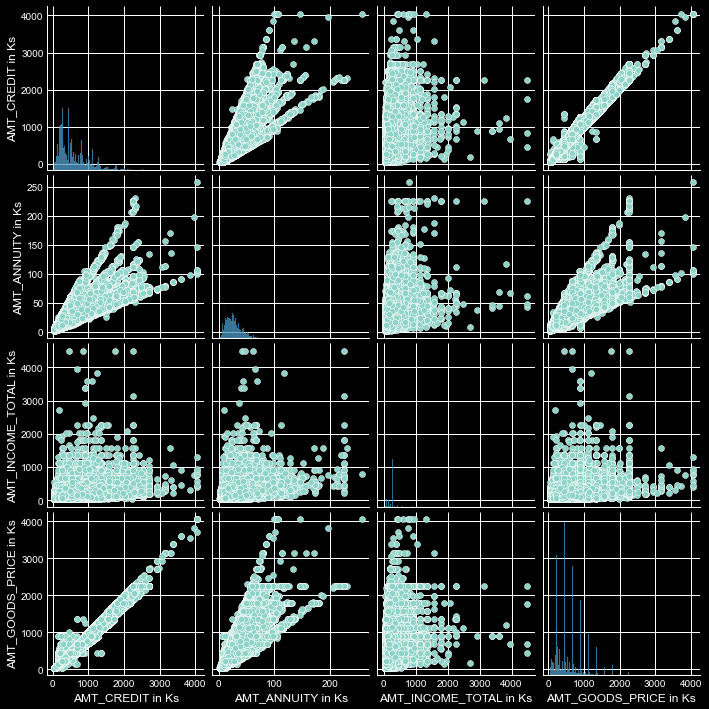

In [219]:
bv_plot = df_app_Target0[['AMT_CREDIT in Ks', 'AMT_ANNUITY in Ks', 'AMT_INCOME_TOTAL in Ks', 'AMT_GOODS_PRICE in Ks']].fillna(0)
sns.pairplot(bv_plot,palette=["v","y"])
plt.show()

### Multivariate analysis wrt Target 0

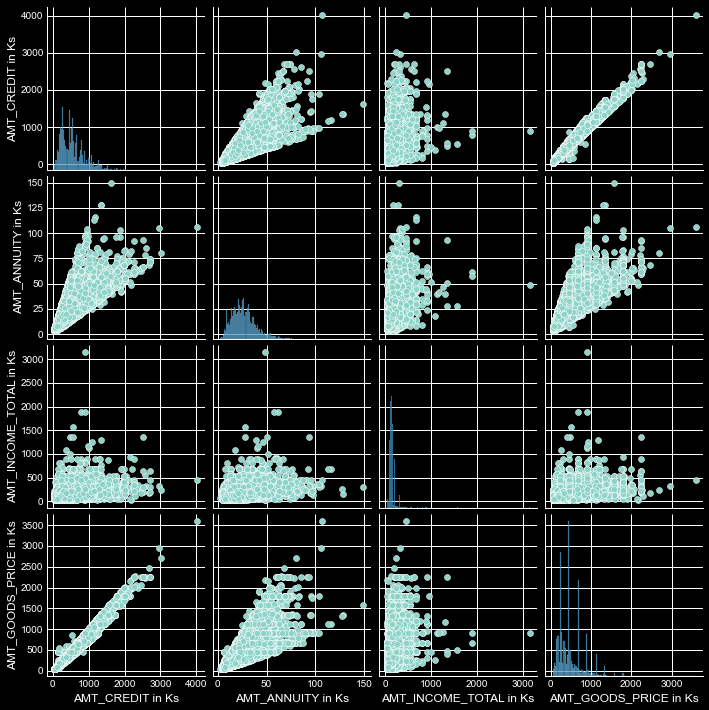

In [220]:
bv_plot = df_app_Target1[['AMT_CREDIT in Ks', 'AMT_ANNUITY in Ks', 'AMT_INCOME_TOTAL in Ks', 'AMT_GOODS_PRICE in Ks']].fillna(0)
sns.pairplot(bv_plot,palette=["v","y"])
plt.show()

# Previous App Data Analysis

In [221]:
#merge previous and current application data on SK_ID_CURR
df_app_prev= pd.merge(df_app, df_prev, how='inner',on='SK_ID_CURR')

### Data Checks

In [222]:
df_app_prev.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,Unaccompanied,Working,Secondary / secondary special,...,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,Family,State servant,Higher education,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,Family,State servant,Higher education,...,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,Cash loans,F,N,N,0,Family,State servant,Higher education,...,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,100004,0,Revolving loans,M,Y,Y,0,Unaccompanied,Working,Secondary / secondary special,...,Connectivity,4.0,middle,POS mobile without interest,365243.0,-784.0,-694.0,-724.0,-714.0,0.0


In [223]:
df_app_prev.shape

(1413630, 76)

In [224]:
df_app_prev.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413630 entries, 0 to 1413629
Data columns (total 76 columns):
 #   Column                               Non-Null Count    Dtype   
---  ------                               --------------    -----   
 0   SK_ID_CURR                           1413630 non-null  int64   
 1   TARGET                               1413630 non-null  int64   
 2   NAME_CONTRACT_TYPE_x                 1413630 non-null  object  
 3   CODE_GENDER                          1413630 non-null  object  
 4   FLAG_OWN_CAR                         1413630 non-null  object  
 5   FLAG_OWN_REALTY                      1413630 non-null  object  
 6   CNT_CHILDREN                         1413630 non-null  int64   
 7   NAME_TYPE_SUITE_x                    1413630 non-null  object  
 8   NAME_INCOME_TYPE                     1413630 non-null  object  
 9   NAME_EDUCATION_TYPE                  1413630 non-null  object  
 10  NAME_FAMILY_STATUS                   1413630 non-null 

In [225]:
df_app_prev.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'NAME_TYPE_SUITE_x',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'AMT_INCOME_TOTAL in Ks', 'AMT_INCOME_RANGE',
       'AMT_CREDIT in Ks', 'AMT_CREDIT_RANGE', 'AMT_ANNUITY in Ks',
       'AMT_ANNUITY_RANGE', 'AMT_GOODS_PRICE in Ks', 'AMT_GOODS_RANGE',
       'REGION_POPULATION_RELATIVE in 100Ks', 'Age_Years', 'Age_Years_RANGE',
       'Years Employed', 'Years_Employed_Range', 'CREDIT_INCOME_RATIO',
       'INCOME_ANNUITY_RATIO', 'CREDIT_ANNUITY_RATIO',
       'AMOUNTCREDIT_GOODSPRICE_RATIO',

In [226]:
df_app_prev.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,DAYS_REGISTRATION,CNT_FAM_MEMBERS,AMT_INCOME_TOTAL in Ks,AMT_CREDIT in Ks,AMT_ANNUITY in Ks,AMT_GOODS_PRICE in Ks,REGION_POPULATION_RELATIVE in 100Ks,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.413630e+06,1.413630e+06,1.413630e+06,1.413630e+06,1.413630e+06,1.413630e+06,1.413630e+06,1.413630e+06,1.413630e+06,1.413630e+06,...,4789.000000,1.413630e+06,1.413630e+06,1.106427e+06,852545.000000,852545.000000,852545.000000,852545.000000,852545.000000,852545.000000
mean,2.784806e+05,8.654811e-02,4.044701e-01,5.003244e+03,2.150073e+00,1.729422e+02,5.875558e+02,2.701642e+01,5.276537e+02,1.945916e+01,...,0.771244,-8.803663e+02,3.149842e+02,1.605210e+01,342258.023808,13487.873130,33274.245762,76664.601786,82352.471997,0.330577
std,1.028124e+05,2.811718e-01,7.137068e-01,3.551106e+03,8.978134e-01,9.360152e+01,3.849159e+02,1.394852e+01,3.531007e+02,1.059022e+01,...,0.100646,7.835412e+02,7.695273e+03,1.456684e+01,88831.611863,71648.117748,106160.956436,149703.992416,153536.612578,0.470421
min,1.000020e+05,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.565000e+01,4.500000e+01,1.620000e+00,4.050000e+01,2.900000e-01,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.893630e+05,0.000000e+00,0.000000e+00,2.000000e+03,2.000000e+00,1.125000e+02,2.700000e+02,1.682000e+01,2.385000e+02,1.003000e+01,...,0.715645,-1.313000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1630.000000,-1244.000000,-1316.000000,-1269.000000,0.000000
50%,2.789890e+05,0.000000e+00,0.000000e+00,4.508000e+03,2.000000e+00,1.575000e+02,5.085000e+02,2.493000e+01,4.500000e+02,1.885000e+01,...,0.835095,-5.820000e+02,4.000000e+00,1.200000e+01,365243.000000,-825.000000,-358.000000,-534.000000,-494.000000,0.000000
75%,3.675560e+05,0.000000e+00,1.000000e+00,7.511000e+03,3.000000e+00,2.070000e+02,8.079800e+02,3.454000e+01,6.795000e+02,2.639000e+01,...,0.852537,-2.710000e+02,8.500000e+01,2.400000e+01,365243.000000,-408.000000,135.000000,-73.000000,-42.000000,1.000000
max,4.562550e+05,1.000000e+00,7.000000e+00,2.467200e+04,9.000000e+00,4.500000e+03,4.050000e+03,2.250000e+02,4.050000e+03,4.622000e+01,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [227]:
#Splitting merged data wrt TARGET i.e 0 & 1 
df_app_prev_0= df_app_prev[df_app_prev.TARGET == 0]
df_app_prev_1= df_app_prev[df_app_prev.TARGET == 1]

In [228]:
df_app_prev_0.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1,100003,0,Cash loans,F,N,N,0,Family,State servant,Higher education,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,Family,State servant,Higher education,...,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,Cash loans,F,N,N,0,Family,State servant,Higher education,...,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,100004,0,Revolving loans,M,Y,Y,0,Unaccompanied,Working,Secondary / secondary special,...,Connectivity,4.0,middle,POS mobile without interest,365243.0,-784.0,-694.0,-724.0,-714.0,0.0
5,100006,0,Cash loans,F,N,Y,0,Unaccompanied,Working,Secondary / secondary special,...,XNA,48.0,low_normal,Cash X-Sell: low,365243.0,-151.0,1259.0,-151.0,-143.0,0.0


In [229]:
df_app_prev_1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,Unaccompanied,Working,Secondary / secondary special,...,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
161,100047,1,Cash loans,M,N,Y,0,Unaccompanied,Commercial associate,Secondary / secondary special,...,XNA,0.0,XNA,Card X-Sell,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
162,100047,1,Cash loans,M,N,Y,0,Unaccompanied,Commercial associate,Secondary / secondary special,...,XNA,24.0,high,Cash X-Sell: high,365243.0,-1437.0,-747.0,-1167.0,-1163.0,1.0
163,100047,1,Cash loans,M,N,Y,0,Unaccompanied,Commercial associate,Secondary / secondary special,...,XNA,36.0,low_normal,Cash Street: low,NaN,NaN,NaN,NaN,NaN,NaN
164,100047,1,Cash loans,M,N,Y,0,Unaccompanied,Commercial associate,Secondary / secondary special,...,Connectivity,10.0,low_normal,POS mobile with interest,365243.0,-2601.0,-2331.0,-2331.0,-2326.0,0.0


## Univariate analysis of few previous application data features  

In [230]:
df_app_prev.NAME_CONTRACT_TYPE_x.value_counts()

Cash loans         1307045
Revolving loans     106585
Name: NAME_CONTRACT_TYPE_x, dtype: int64

In [231]:
df_app_prev.NAME_CONTRACT_TYPE_x.isna().sum()

0

In [232]:
df_app_prev.NAME_CONTRACT_STATUS.value_counts()

Approved        886047
Canceled        259433
Refused         245382
Unused offer     22768
Name: NAME_CONTRACT_STATUS, dtype: int64

In [233]:
df_app_prev.NAME_CONTRACT_STATUS.isna().sum()

0

In [234]:
df_app_prev.NFLAG_INSURED_ON_APPROVAL.value_counts()

0.0    570713
1.0    281832
Name: NFLAG_INSURED_ON_APPROVAL, dtype: int64

In [235]:
df_app_prev.NFLAG_INSURED_ON_APPROVAL.isna().sum()

561085

In [236]:
df_app_prev.AMT_CREDIT.isna().value_counts()

False    1413629
True           1
Name: AMT_CREDIT, dtype: int64

In [237]:
df_app_prev.AMT_CREDIT.isna().sum()

1

In [238]:
df_app_prev.PRODUCT_COMBINATION.value_counts()

Cash                              235094
POS household with interest       226449
POS mobile with interest          190839
Cash X-Sell: middle               120031
Cash X-Sell: low                  110596
Card Street                        94591
POS industry with interest         83501
POS household without interest     71514
Card X-Sell                        66769
Cash Street: high                  51697
Cash X-Sell: high                  50801
Cash Street: middle                29933
Cash Street: low                   28591
POS other with interest            20308
POS mobile without interest        19890
POS industry without interest      10618
POS others without interest         2095
Name: PRODUCT_COMBINATION, dtype: int64

In [239]:
df_app_prev.PRODUCT_COMBINATION.isna().sum()

313

In [240]:
df_app_prev.NAME_CLIENT_TYPE.value_counts()

Repeater     1037644
New           259522
Refreshed     114921
XNA             1543
Name: NAME_CLIENT_TYPE, dtype: int64

In [241]:
df_app_prev.NAME_CLIENT_TYPE.isna().sum()

0

In [242]:
df_app_prev.CODE_REJECT_REASON.value_counts()

XAP       1145473
HC         145980
LIMIT       47770
SCO         32635
CLIENT      22768
SCOFR       10875
XNA          4378
VERIF        3079
SYSTEM        672
Name: CODE_REJECT_REASON, dtype: int64

In [243]:
df_app_prev.CODE_REJECT_REASON.isna().sum()

0

## Will be using below columns for further analysis
NAME_CONTRACT_TYPE,
NAME_CONTRACT_STATUS,
AMT_CREDIT,
PRODUCT_COMBINATION,
NAME_CLIENT_TYPE,
CODE_REJECT_REASON,

## Univariate & Segmented Univariate for selected columns of previous application data

### Univariate Analysis wrt TARGET

<AxesSubplot:>

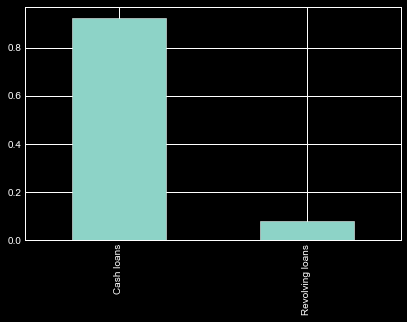

In [244]:
df_app_prev_0['NAME_CONTRACT_TYPE_x'].value_counts(normalize=True).plot.bar()

<AxesSubplot:>

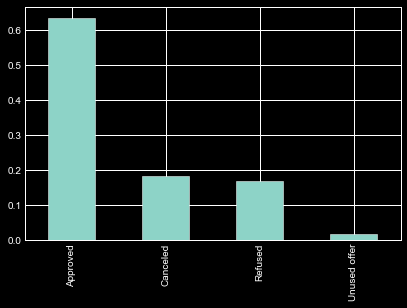

In [245]:
df_app_prev_0['NAME_CONTRACT_STATUS'].value_counts(normalize=True).plot.bar()

<AxesSubplot:>

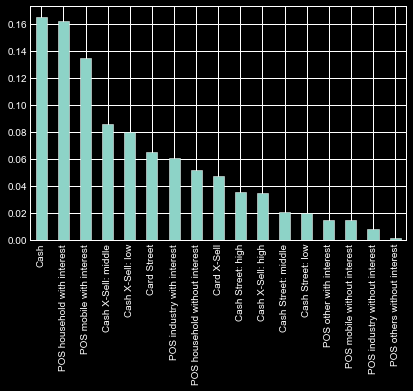

In [246]:
df_app_prev_0['PRODUCT_COMBINATION'].value_counts(normalize=True).plot.bar()

<AxesSubplot:>

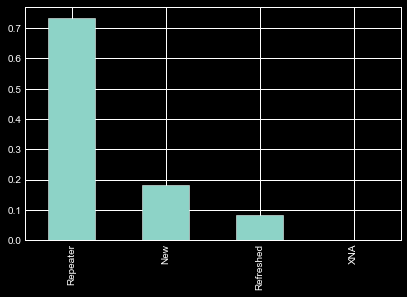

In [247]:
df_app_prev_0['NAME_CLIENT_TYPE'].value_counts(normalize=True).plot.bar()

<AxesSubplot:>

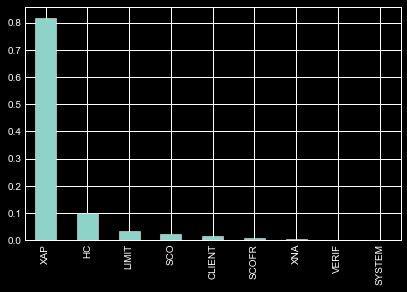

In [248]:
df_app_prev_0['CODE_REJECT_REASON'].value_counts(normalize=True).plot.bar()

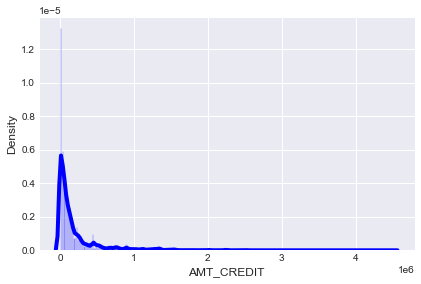

In [249]:
sns.set_style('darkgrid')
sns.distplot(df_app_prev_0['AMT_CREDIT'], color ='blue', bins = 300)
plt.show()

## Segmented Univariate Analysis wrt Target = 0 & TARGET = 1

In [250]:
#copied from open source the loop for univariate analysis
def masterplot1(var):
    plt.style.use('fivethirtyeight')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(40,15))   
    sns.countplot(x=var, data=df_app_prev_0,ax=ax1, palette=['#432371',"#FAAE7B"])
    ax1.set_ylabel('Total Counts')
    ax1.set_title(f'Distribution for Non-Defaulters {var}',fontsize=25)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, ha="right")
    for p in ax1.patches:
        ax1.annotate('{:.1f}%'.format((p.get_height()/len(df_app_prev_0))*100), (p.get_x()+0.1, p.get_height()+50))
        
    sns.countplot(x=var, data=df_app_prev_1,ax=ax2, palette=["#7fcdbb","#edf8b1"])
    ax2.set_ylabel('Total Counts')
    ax2.set_title(f'Distribution for Defaulters {var}',fontsize=25)    
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90, ha="right")
    for p in ax2.patches:
        ax2.annotate('{:.1f}%'.format((p.get_height()/len(df_app_prev_1))*100), (p.get_x()+0.1, p.get_height()+50))
    
    plt.show()

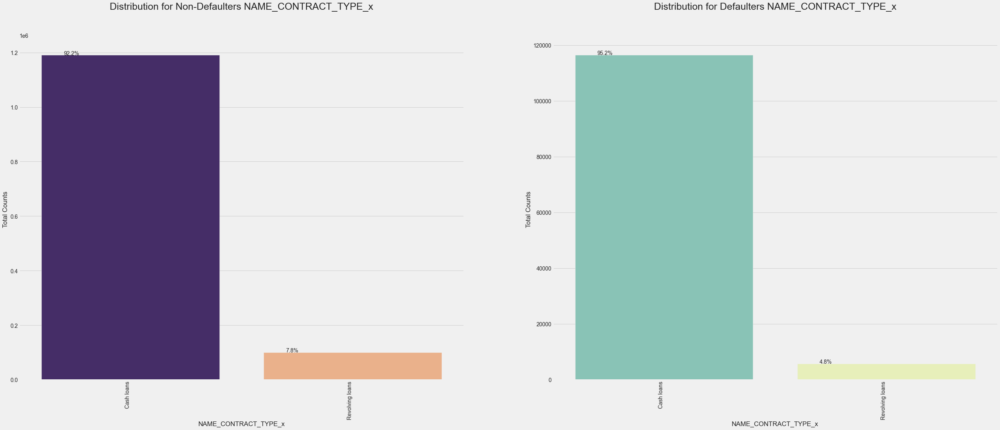

In [251]:
masterplot1('NAME_CONTRACT_TYPE_x')

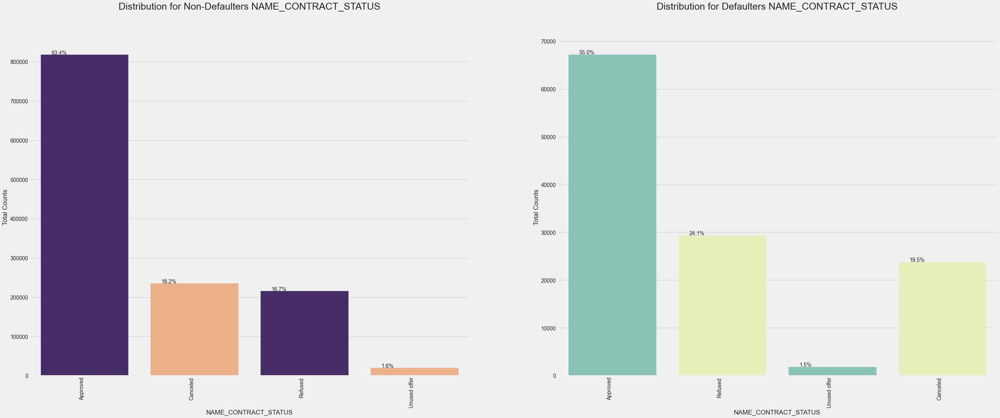

In [252]:
masterplot1('NAME_CONTRACT_STATUS')

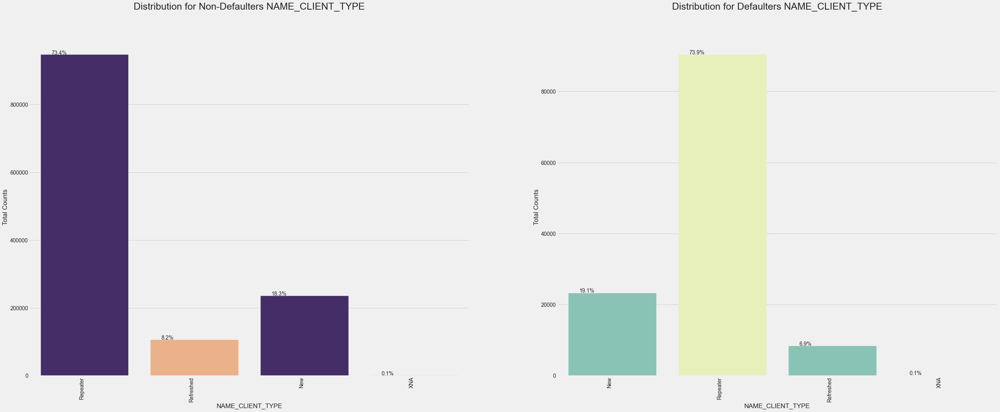

In [253]:
masterplot1('NAME_CLIENT_TYPE')

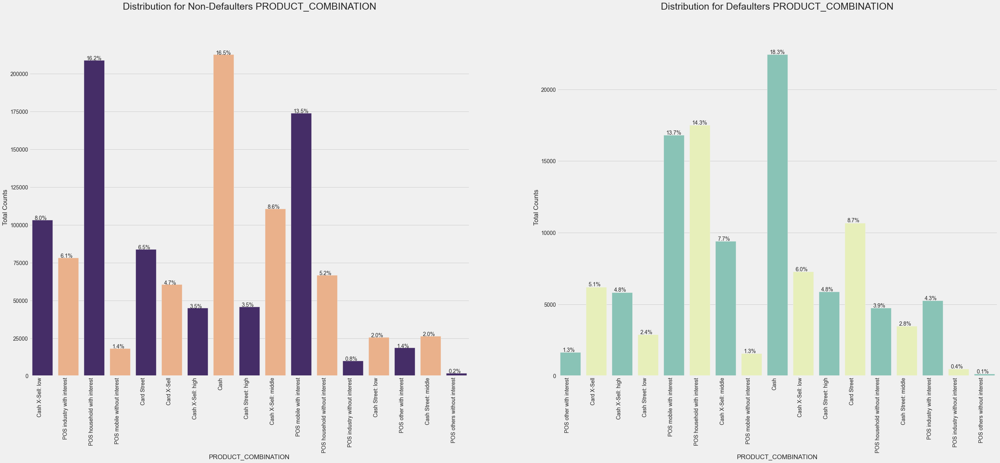

In [254]:
     masterplot1('PRODUCT_COMBINATION')

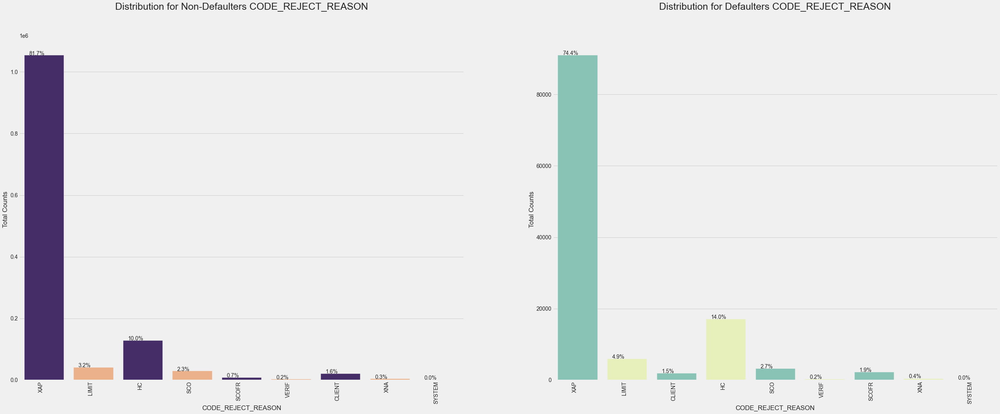

In [255]:
masterplot1('CODE_REJECT_REASON')

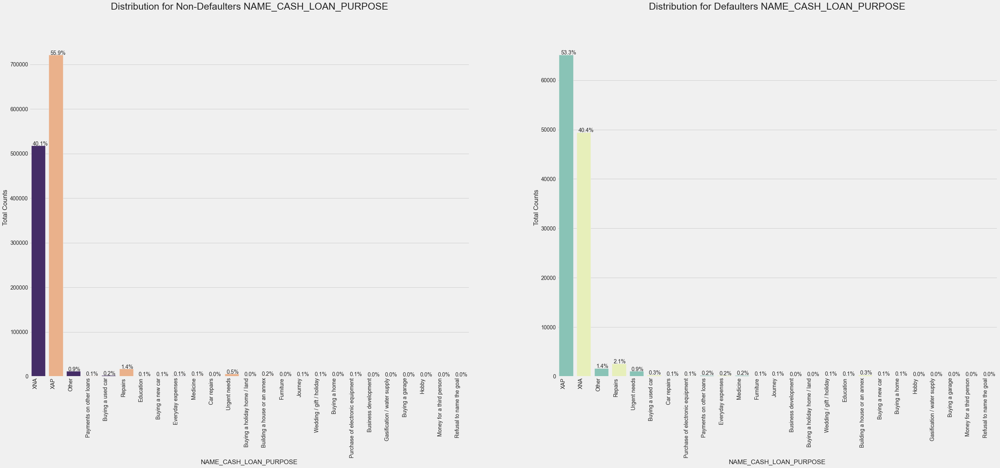

In [256]:
masterplot1('NAME_CASH_LOAN_PURPOSE')

## bivariate Analysis & multivariate Analysis of some numerical features of previous application data & Merged data wrt TARGET =0 & TARGET =1

<Figure size 1440x576 with 0 Axes>

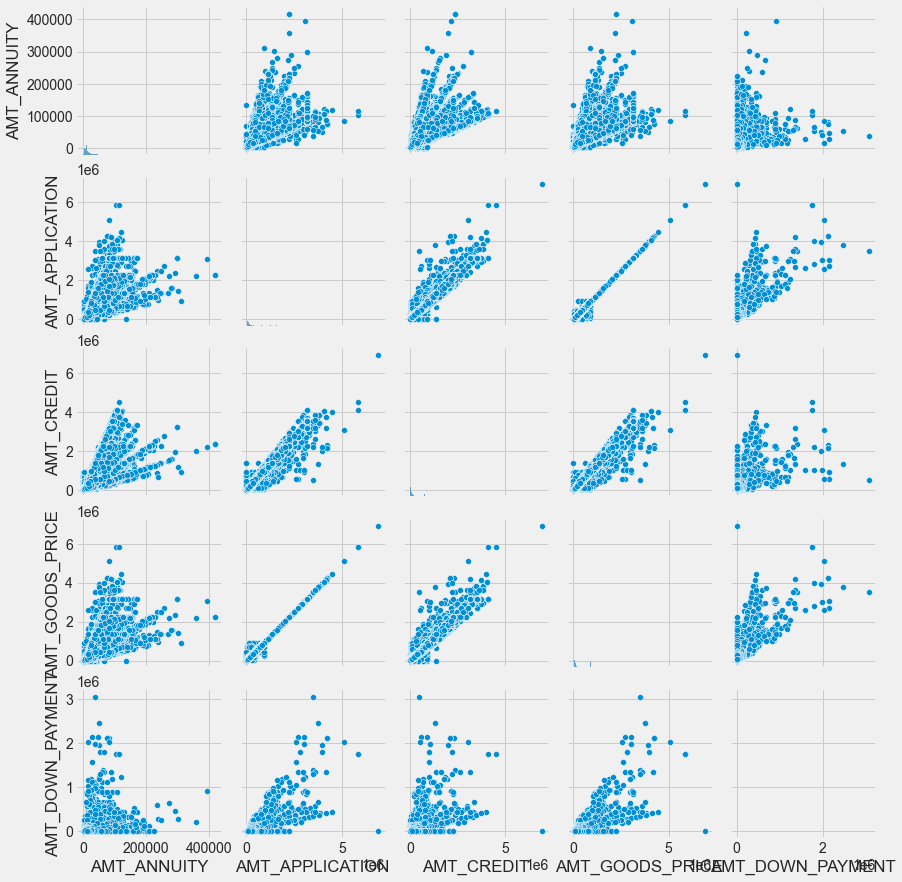

In [257]:
#pair plot of previous application dataset
plt.figure(figsize=[20,8])
sns.pairplot(df_prev[['AMT_ANNUITY','AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE','AMT_DOWN_PAYMENT']])
plt.show()

<Figure size 1440x576 with 0 Axes>

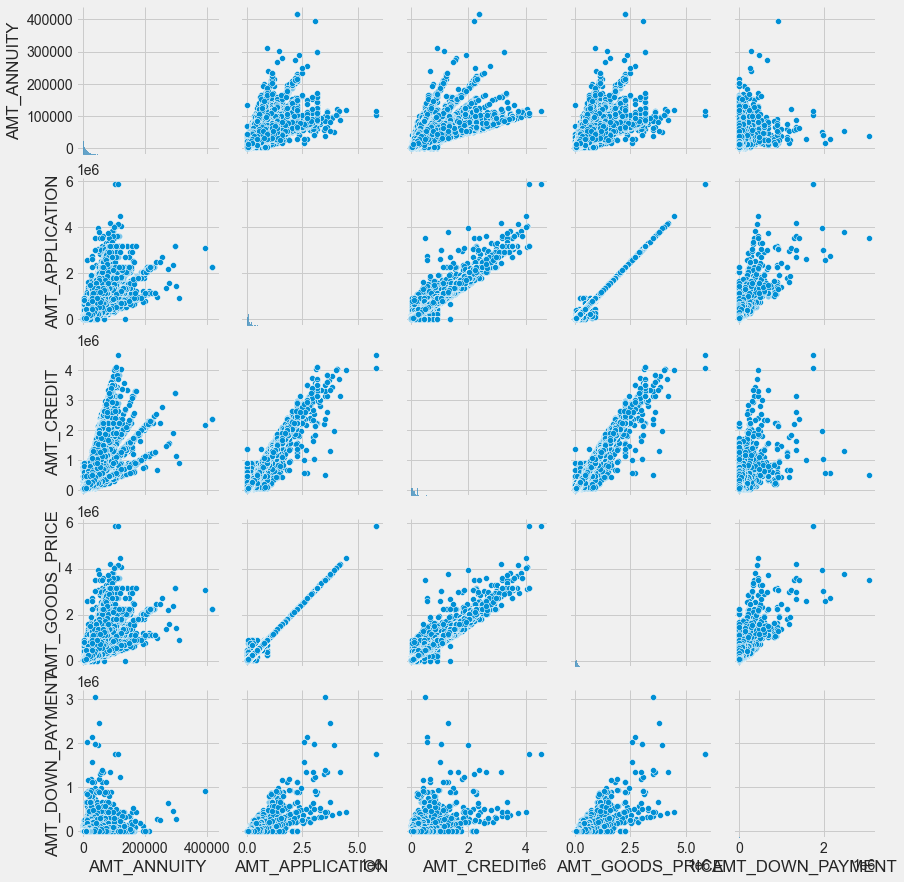

In [258]:
#pair plot of full merged application dataset Target = 0
plt.figure(figsize=[20,8])
sns.pairplot(df_app_prev_0[['AMT_ANNUITY','AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE','AMT_DOWN_PAYMENT']])
plt.show()

<Figure size 1440x576 with 0 Axes>

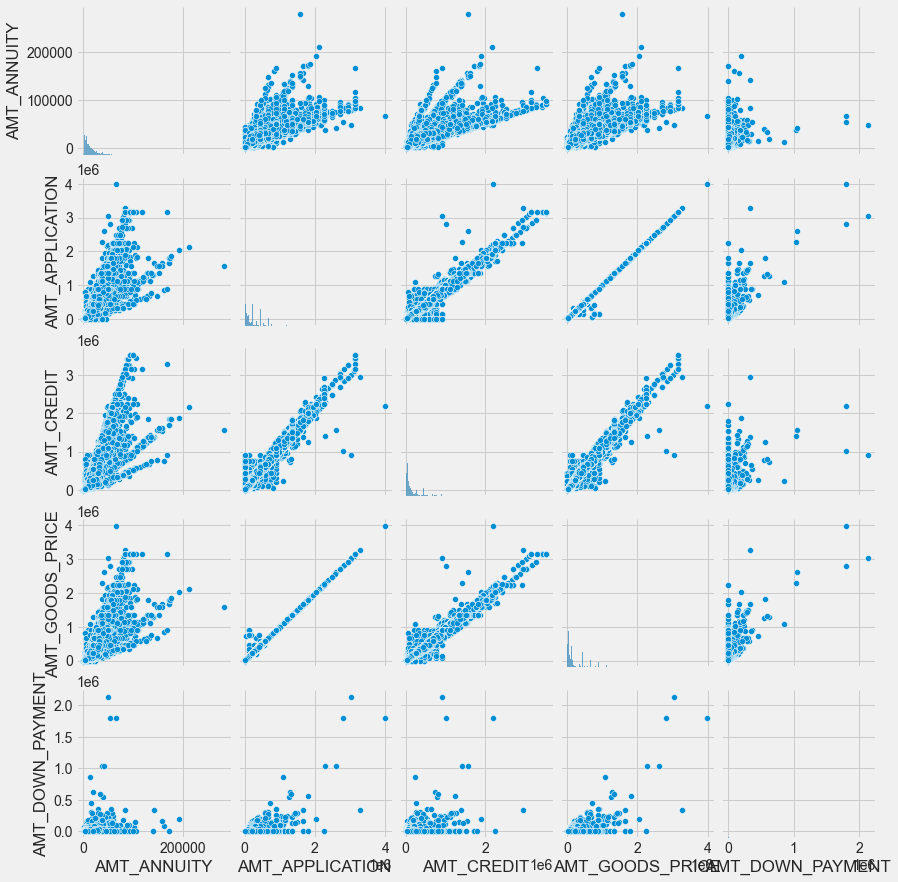

In [259]:
#pair plot of full merged application dataset Target = 1
plt.figure(figsize=[20,8])
sns.pairplot(df_app_prev_1[['AMT_ANNUITY','AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE','AMT_DOWN_PAYMENT']])
plt.show()

In [260]:
pivot1 = pd.pivot_table(df_app_prev, values='TARGET', index=['NAME_CLIENT_TYPE'],columns=['NAME_CONTRACT_STATUS'], aggfunc=np.mean)

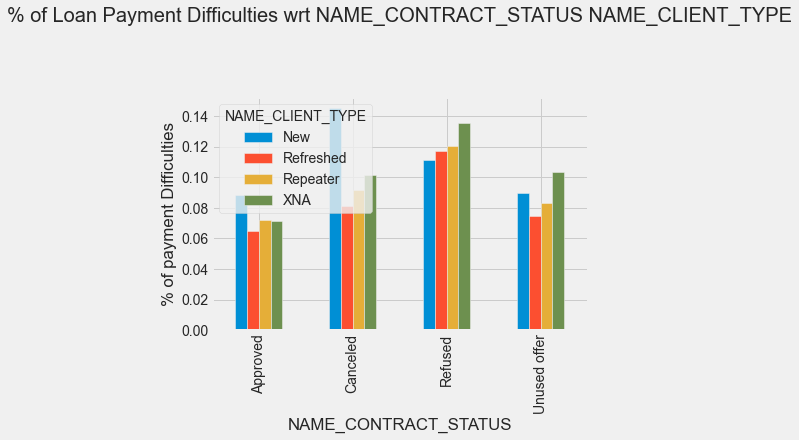

In [261]:
ax = pivot1.T.plot(kind='bar')
ylab = ax.set_ylabel('% of payment Difficulties')
plt.title('% of Loan Payment Difficulties wrt NAME_CONTRACT_STATUS NAME_CLIENT_TYPE', fontdict={'fontsize':20})
plt.show()

In [262]:
pivot2 = pd.pivot_table(df_app_prev, values='TARGET', index=['NAME_CONTRACT_TYPE_x'],columns=['NAME_CONTRACT_STATUS'], aggfunc=np.mean)

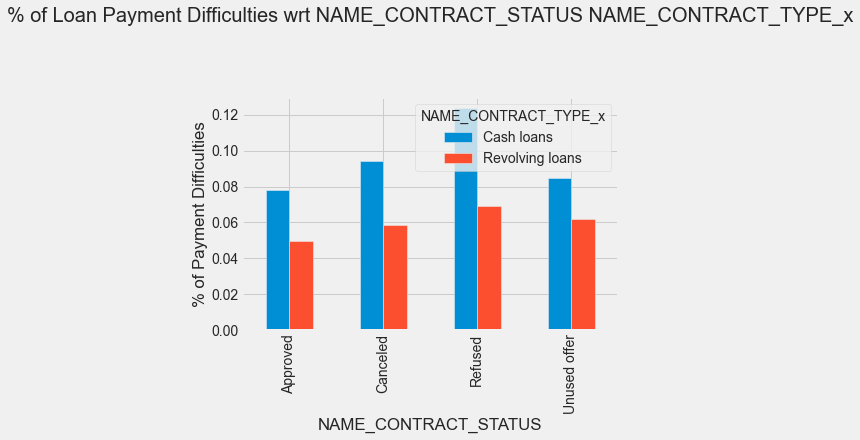

In [263]:
ax = pivot2.T.plot(kind='bar')
ylab = ax.set_ylabel('% of Payment Difficulties')
plt.title('% of Loan Payment Difficulties wrt NAME_CONTRACT_STATUS NAME_CONTRACT_TYPE_x', fontdict={'fontsize':20})
plt.show()